# Ecommerce Capstone Project

## Contents
- <a href=#1>Business Objective
- <a href=#2>Data Understanding & Clean up
	- <a href=#3>Input file - Preprocessing
	- <a href=#4>Reading Master input data
	- <a href=#5>Outlier Treatment - GMV
	- <a href=#6>Sale day, Pay day, holiday feature addition
	- <a href=#7>Media Investment
	- <a href=#8>Product List - Percent
	- <a href=#9>Merging of product to sales data
	- <a href=#10>Convert categorical attributes to numeric
	- <a href=#11>Weather Data
	- <a href=#12>NPS & StockIndex
	- <a href=#13>List Price - new KPI
	- <a href=#14>Split Sales data into 3 categories
- <a href=#15>Camera Accessory
	- <a href=#16>Data validation & Processing
	- <a href=#17>Data aggregation - Sales
	- <a href=#18>Data Analysis
	- <a href=#19>Model Building - Linear
        - <a href=#20>Summary
    - <a href=#26>Model Buidling - Multiplicative Model	
        - <a href=#27>Summary    
    - <a href=#100>Model Building-Distribution Model 
        - <a href=#128>Summary    
	- <a href=#21>Model Building - Koyck Model
		- <a href=#22>Summary
	- <a href=#23>Model Buidling - Multiplicative-Lag Model
		- <a href=#24>Summary  

## <div id=1></div>Business Objective

ElecKart is an e-commerce firm based out of Ontario, Canada specialising in electronic products. Over the last one year, they had spent a significant amount of money on marketing. Occasionally, they had also offered big-ticket promotions (similar to the Big Billion Day). 

They are about to create a marketing budget for the next year, which includes spending on commercials, online campaigns, and pricing & promotion strategies. The CFO feels that the money spent over the last 12 months on marketing was not sufficiently impactful, and, that they can either cut on the budget or reallocate it optimally across marketing levers to improve the revenue response.

Objective is to build the  <B>market mix model</B> which can indicate the <B>impact of the marketing spend on revenue</B> and present to CFO so to enable the spend on marketing is done wisely in the coming year.

Market Mix Model is required to be built for 3 categories using the data from <B>July 205 to June 2016</B>:
<B>
1. Camera Accessory
2. Gaming Accessory
3. Home Audio</B>

In [1]:
# import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import holidays
from pandas.tseries.offsets import CustomBusinessDay
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
pd.set_option('display.max_colwidth',-1)
pd.set_option('display.max_columns', None)

## <div id=2></div>Data Understanding & Clean up

### <div id=3></div>Input file - Preprocessing

In [2]:
#### Processing of Product list and percent file
productlist = pd.read_excel('Media data and other information.xlsx', sheet_name='Product List')
productlist.drop(productlist.columns[0], axis=1,inplace=True)
productlist.columns = ['subcategory','Frequency','Percent']
productlist.head()

,subcategory,Frequency,Percent
0,NaN,Frequency,Percent
1,\N,5828,0.353464
2,AmplifierReceiver,4056,0.245994
3,AudioMP3Player,112892,6.84682
4,Binoculars,14599,0.885419


In [3]:
#### Processing of Investment data 
Mediainvestments=pd.read_excel('Media data and other information.xlsx', sheet_name='Media Investment', skiprows=2)
Mediainvestments=Mediainvestments[0:12]
Mediainvestments.fillna(0, inplace=True)
Mediainvestments

,Year,Month,Total Investment,TV,Digital,Sponsorship,Content Marketing,Online marketing,Affiliates,SEM,Radio,Other
0,2015.0,7.0,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.00,0.000000
1,2015.0,8.0,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,0.00,0.000000
2,2015.0,9.0,96.254380,3.879504,1.356528,62.787651,0.610292,16.379990,5.038266,6.202149,0.00,0.000000
3,2015.0,10.0,170.156297,6.144711,12.622480,84.672532,3.444075,24.371778,6.973711,31.927011,0.00,0.000000
4,2015.0,11.0,51.216220,4.220630,1.275469,14.172116,0.168633,19.561574,6.595767,5.222032,0.00,0.000000
5,2015.0,12.0,106.745312,5.397502,3.063360,56.705419,1.067307,22.503756,6.826938,11.181030,0.00,0.000000
6,2016.0,1.0,74.196000,4.380000,0.456000,4.200000,0.900000,22.900000,7.370000,4.200000,2.70,27.090000
7,2016.0,2.0,48.052000,2.586008,1.912651,11.725555,0.596771,19.892366,6.465019,4.873630,0.00,0.000000
8,2016.0,3.0,100.024621,9.300000,2.100000,41.590000,0.370000,18.437818,6.217667,5.193591,0.87,15.945545
9,2016.0,4.0,56.848241,5.205196,0.871892,24.308354,0.034876,16.514510,5.693456,4.219958,0.00,0.000000


In [4]:
#### Processing of NPS and StockIndex data
nps_stock=pd.read_excel('Media data and other information.xlsx', sheet_name='Monthly NPS Score', skiprows=1)
nps_stock=nps_stock.T
new_header = nps_stock.iloc[0] 
nps_stock = nps_stock[1:] 
nps_stock.columns=['NPS','StockIndex']
nps_stock['Month']=nps_stock.index
nps_stock['Month']=nps_stock['Month'].str.replace('July','Jul',1)
nps_stock['Month']=nps_stock['Month'].str.replace('Sept','Sep',1)
nps_stock['Month']=nps_stock['Month'].str.replace('June','Jun',1)
# nps_stock.columns=['NPS','StockIndex','Month']
nps_stock['NPS']=pd.to_numeric(nps_stock['NPS'],errors='coerce')
nps_stock['StockIndex']=pd.to_numeric(nps_stock['StockIndex'],errors='coerce')
nps_stock

,NPS,StockIndex,Month
July'15,54.599588,1177.0,Jul'15
Aug'15,59.987101,1206.0,Aug'15
Sept'15,46.925419,1101.0,Sep'15
Oct'15,44.398389,1210.0,Oct'15
Nov'15,47.000000,1233.0,Nov'15
Dec'15,45.800000,1038.0,Dec'15
Jan'16,47.093031,1052.0,Jan'16
Feb'16,50.327406,1222.0,Feb'16
Mar'16,49.020550,1015.0,Mar'16
Apr'16,51.827605,1242.0,Apr'16


In [5]:
#### Sale Day processing
sale_day=['7/18/2015', '7/19/2015', '8/15/2015', '8/16/2015', '8/17/2015',
       '8/28/2015', '8/29/2015', '8/30/2015', '10/15/2015', '10/16/2015',
       '10/17/2015', '11/7/2015', '11/8/2015', '11/9/2015', '11/10/2015',
       '11/11/2015', '11/12/2015', '11/13/2015', '11/14/2015', '12/25/2015',
       '12/26/2015', '12/27/2015', '12/28/2015', '12/29/2015', '12/30/2015',
       '12/31/2015', '1/1/2016', '1/2/2016', '1/3/2016', '1/20/2016',
       '1/20/2016', '1/22/2016', '2/1/2016', '2/2/2016', '2/14/2016',
       '2/15/2016', '2/20/2016', '2/21/2016', '3/7/2016', '3/8/2016',
       '3/9/2016', '5/25/2016', '5/26/2016', '5/27/2016']

sale_day=pd.DataFrame(sale_day)
sale_day.columns=['SaleDay']
sale_day.head(3)

,SaleDay
0,7/18/2015
1,7/19/2015
2,8/15/2015


### <div id=4></div>Reading Master input data

In [6]:
sales_master=pd.read_csv(r'ConsumerElectronics.csv',encoding='latin-1')

In [7]:
sales_master.head()

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [8]:
sales_master.shape
### 1.6Mn records present in master sales data with 20 features.

(1648824, 20)

In [9]:
sales_master.Year.unique()

array([2015, 2016], dtype=int64)

In [10]:
sales_master.Month.unique()

array([10, 11,  4,  3,  9,  2,  1, 12,  8,  5,  6,  7], dtype=int64)

In [11]:
### Fetch data from July 2015 to June 2016 for analysis.
sales=sales_master.loc[((sales_master.Year == 2015) & (sales_master.Month > 6 ) ) | ((sales_master.Year ==2016) &(sales_master.Month <7)) ]

In [12]:
sales.shape

(1648215, 20)

In [13]:
### Fetch data only specific to 3 categories - CameraAccessory, HomeAudio & GamingAccessory.
sales=sales.loc[((sales.product_analytic_sub_category =='CameraAccessory')|(sales.product_analytic_sub_category =='HomeAudio')|(sales.product_analytic_sub_category =='GamingAccessory'))]

In [14]:
sales.shape

(566067, 20)

In [15]:
sales['order_date_formatted'] = pd.to_datetime(sales.order_date , format = '%Y-%m-%d %H:%M:%S')
sales['day']=sales['order_date_formatted'].dt.day

In [16]:
### Blank values seen for GMV . 
sales.loc[(sales.gmv == ' ')]

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,order_date_formatted,day
8,ACCCX3S5JGAJETYR,2015-10-16 00:49:14,2015,10,2.417870e+15,2.417870e+15,,1,\N,\N,Prepaid,9,,,CE,CameraAccessory,CameraAccessory,CameraTripod,4044,5,2015-10-16 00:49:14,16
95,ACCCX3SGAR6NNBMR,2015-10-05 13:25:48,2015,10,2.408842e+15,2.408842e+15,,1,\N,\N,Prepaid,3,,,CE,CameraAccessory,CameraAccessory,Lens,7150,5,2015-10-05 13:25:48,5
124,ACCCX3SGDGPZAQXD,2015-10-16 01:49:30,2015,10,4.417909e+15,4.417909e+15,,1,\N,\N,Prepaid,6,,,CE,CameraAccessory,CameraAccessory,Lens,17995,5,2015-10-16 01:49:30,16
142,ACCCX3SGDGPZAQXD,2015-10-16 22:59:20,2015,10,4.418717e+15,4.418717e+15,,1,\N,\N,Prepaid,6,,,CE,CameraAccessory,CameraAccessory,Lens,17995,5,2015-10-16 22:59:20,16
186,ACCCX3SGDGPZAQXD,2015-10-16 07:30:25,2015,10,4.418158e+15,4.418158e+15,,1,\N,\N,Prepaid,6,,,CE,CameraAccessory,CameraAccessory,Lens,17995,5,2015-10-16 07:30:25,16
398,ACCCX3SGDGPZAQXD,2015-10-17 14:50:26,2015,10,2.419285e+15,2.419285e+15,,1,\N,\N,Prepaid,6,,,CE,CameraAccessory,CameraAccessory,Lens,17995,5,2015-10-17 14:50:26,17
473,ACCCX3SGEP6YD7SW,2015-10-16 17:37:25,2015,10,3.418524e+15,3.418524e+15,,1,\N,\N,Prepaid,8,,,CE,CameraAccessory,CameraAccessory,Lens,10490,1,2015-10-16 17:37:25,16
494,ACCCX3SGFMC9ZMZC,2015-10-29 00:47:37,2015,10,3.429150e+15,3.429150e+15,,1,\N,\N,Prepaid,5,,,CE,CameraAccessory,CameraAccessory,Lens,38450,1,2015-10-29 00:47:37,29
679,ACCCX3SU22JG8NJX,2015-10-04 15:41:06,2015,10,2.408083e+15,2.408083e+15,,2,\N,\N,Prepaid,11,,,CE,CameraAccessory,CameraAccessory,CameraBattery,1545,1,2015-10-04 15:41:06,4
778,ACCCX3SU5VYKHSZG,2015-10-14 08:17:59,2015,10,2.416459e+15,2.416459e+15,,1,\N,\N,Prepaid,5,,,CE,CameraAccessory,CameraAccessory,CameraBattery,3810,13,2015-10-14 08:17:59,14


In [17]:
len(sales.loc[(sales.gmv == ' ')])

1672

In [18]:
# The column gmv is character type, convert it to float
sales['gmv'] = pd.to_numeric(sales['gmv'],errors='coerce')

In [19]:
### Set GMV as units * mrp where it is blank
sales['gmv']=sales.apply(lambda X : X.units*X.product_mrp if X.gmv ==' ' else X.gmv, axis=1)

In [20]:
### Set GMV as units * mrp where GMV is less than units * mrp
sales['gmv']=sales.apply(lambda X :(X.product_mrp*X.units) if (float(X.gmv) > (X.product_mrp*X.units)) else X.gmv, axis=1)

In [21]:
import math
sales['gmv']=sales.apply(lambda X :(X.product_mrp*X.units) if (math.isnan(X.gmv)) else X.gmv, axis=1)

In [22]:
len(sales.loc[(sales.gmv==0)])

3687

In [23]:
sales.loc[(sales.gmv.isnull())]

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,order_date_formatted,day


In [24]:
sales.loc[(sales.gmv==0)]

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,order_date_formatted,day
12807,ACCDGXGZQUGHFYHT,2015-10-23 19:26:01,2015,10,1.424635e+15,1.424635e+15,0.0,1,\N,\N,COD,5,1.95757717948634E+018,-4.61973414463541E+018,CE,GamingHardware,GamingAccessory,GamingAccessoryKit,0,-1,2015-10-23 19:26:01,23
15031,ACCDHHZZGFBDPJRP,2015-10-20 21:27:29,2015,10,3.422118e+15,3.422118e+15,0.0,1,\N,\N,Prepaid,6,4.4039953528426E+018,1.15136841865603E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1,2015-10-20 21:27:29,20
15032,ACCDHHZZGFBDPJRP,2015-10-28 23:49:41,2015,10,2.429117e+15,2.429117e+15,0.0,1,\N,\N,COD,8,2.02066165332605E+018,-5.73945007094169E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1,2015-10-28 23:49:41,28
15529,ACCDHTZ4CZCECAFF,2015-10-27 01:05:20,2015,10,1.427429e+15,1.427429e+15,0.0,1,\N,\N,COD,7,2.54451421812842E+018,8.25363017907057E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1,2015-10-27 01:05:20,27
16980,ACCDK94FSKCZBJCU,2015-10-28 18:36:07,2015,10,4.428925e+15,4.428925e+15,0.0,1,\N,\N,Prepaid,6,7.46177327353558E+018,1.84021085056852E+018,CE,EntertainmentSmall,HomeAudio,Dock,0,-1,2015-10-28 18:36:07,28
16981,ACCDK94FSKCZBJCU,2015-10-28 08:28:19,2015,10,1.428564e+15,1.428564e+15,0.0,1,\N,\N,COD,6,7.68753833881333E+018,1.84021085056852E+018,CE,EntertainmentSmall,HomeAudio,Dock,0,-1,2015-10-28 08:28:19,28
16982,ACCDK94FSKCZBJCU,2015-10-14 00:31:46,2015,10,3.416164e+15,3.416164e+15,0.0,1,\N,\N,COD,6,8.190936899675E+018,-8.95613073453997E+018,CE,EntertainmentSmall,HomeAudio,Dock,0,-1,2015-10-14 00:31:46,14
17333,ACCDM6FF7FTZEHZN,2015-10-31 18:19:57,2015,10,3.431501e+15,3.431501e+15,0.0,1,\N,\N,Prepaid,12,9.06987174296518E+018,-7.70816034119555E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1,2015-10-31 18:19:57,31
17356,ACCDM6FFABMXFBHG,2015-10-06 19:00:46,2015,10,4.409932e+15,4.409932e+15,0.0,1,\N,\N,COD,5,-6.98869013901039E+018,-6.71230362034968E+018,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1,2015-10-06 19:00:46,6
17357,ACCDM6FFABMXFBHG,2015-10-12 08:01:27,2015,10,1.414708e+15,1.414708e+15,0.0,1,\N,\N,COD,7,-7.10421140187762E+018,-5.09694409821032E+017,CE,CameraAccessory,CameraAccessory,CameraBattery,0,-1,2015-10-12 08:01:27,12


In [25]:
### Drop the values where GMV is zero as this can be incorrect. There is no other data to certify why they are 0. 
sales=sales.loc[(sales.gmv != 0)]

In [26]:
### Check for records with MRP as 0.
len(sales.loc[(sales.product_mrp == 0)])/len(sales.index)

0.0

In [27]:
### convert mrp as float
sales['product_mrp']= sales['product_mrp'].astype(float)

In [28]:
## Discount calculation - new KPI 
sales['discount_per']=(((sales.product_mrp * sales.units)-(sales.gmv.astype(float)))/(sales.product_mrp * sales.units))*100

In [29]:
sales['discount_per'].replace([np.inf, -np.inf],0,inplace=True)

In [30]:
sales.loc[(sales['discount_per'] <0 )]

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,order_date_formatted,day,discount_per


In [31]:
### Check for null values and impute by 0 for delivery delays .
sales.deliverybdays.unique()

array(['\\N', '5', '4', '6', '8', '7', '3', '9', '2', '18', '10', '32',
       '1', '14', '13', '0', '12', '11', '15', '16', '23', '36', '35',
       '19', '26', '17', '20', '53', '-71', '22', '25', '-39', '-72',
       '-41', '21', '-14', '-45', '-56', '24', '-73', '61', '30'],
      dtype=object)

In [32]:
sales.deliverybdays.replace('\\N','0',inplace=True)

In [33]:
sales.deliverycdays.unique()

array(['\\N', '6', '5', '7', '9', '4', '11', '3', '8', '20', '37', '12',
       '2', '1', '16', '17', '15', '14', '10', '13', '21', '18', '19',
       '27', '42', '41', '23', '31', '24', '0', '61', '-832', '26', '22',
       '-836', '29', '-466', '-848', '-844', '-482', '25', '-16', '-532',
       '-655', '28', '-859', '72', '35'], dtype=object)

In [34]:
sales.deliverycdays.replace('\\N','0',inplace=True)

In [35]:
sales.units.unique()

array([ 1,  2, 10,  4,  3,  6,  7,  8, 12, 34,  5, 17,  9, 21, 39, 15, 13,
       18, 19], dtype=int64)

In [36]:
sales.product_procurement_sla.unique()

array([ 0,  3,  5, -1,  1,  6,  2,  7,  4, 13, 14, 10,  9, 12,  8, 15],
      dtype=int64)

In [37]:
#transform negitive sla to zeros 
sales.loc[sales['product_procurement_sla'] < 0, 'product_procurement_sla'] = 0

In [38]:
sales.product_mrp.unique()

array([7190., 2099., 4044., ..., 1053., 9775., 3341.])

In [39]:
sales.product_analytic_vertical.unique()

array(['CameraTripod', 'Lens', 'CameraBag', 'Flash', 'CameraBattery',
       'CameraBatteryCharger', 'GamePad', 'GamingAccessoryKit',
       'GamingHeadset', 'GamingMemoryCard', 'MotionController',
       'GamingMouse', 'GamingAdapter', 'TVOutCableAccessory', 'GamingGun',
       'JoystickGamingWheel', 'HomeAudioSpeaker', 'CameraRemoteControl',
       'Binoculars', 'Filter', 'GamingMousePad', 'Strap',
       'GamingKeyboard', 'Dock', 'SlingBox', 'GamingSpeaker',
       'CoolingPad', 'BoomBox', 'CameraBatteryGrip', 'CameraAccessory',
       'CameraFilmRolls', 'CameraMount', 'DockingStation', 'DJController',
       'ExtensionTube', 'FMRadio', 'HiFiSystem', 'KaraokePlayer',
       'Telescope', 'VoiceRecorder', 'GamingChargingStation',
       'CameraEyeCup', 'GameControlMount', 'SoundMixer', 'CameraLEDLight',
       'CameraMicrophone', 'FlashShoeAdapter', 'Softbox',
       'ReflectorUmbrella', 'Teleconverter', 'CameraHousing'],
      dtype=object)

In [40]:
sales.product_analytic_sub_category.unique()

array(['CameraAccessory', 'GamingAccessory', 'HomeAudio'], dtype=object)

In [41]:
sales.product_analytic_super_category.unique()

array(['CE'], dtype=object)

In [42]:
sales.sla.unique()

array([ 5,  7, 10,  4,  6,  9,  8,  2,  3, 12,  1, 13, 11, 14, 19, 15, 17,
       16, 20, 18,  0, 21, 25, 22, 41, 23, 60, 24, 29, 26, 27, 30, 42, 28,
       37, 31, 39, 35, 32], dtype=int64)

In [43]:
sales['s1_fact.order_payment_type'].unique()

array(['COD', 'Prepaid'], dtype=object)

In [44]:
sales['date']=sales.order_date_formatted.apply(lambda x : x.date())

### <div id=5></div>Outlier Treatment - GMV

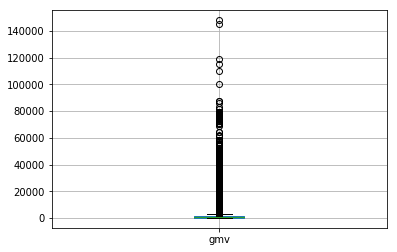

In [45]:
### Outlier check for gmv
boxplot = sales.boxplot(column=['gmv'])

In [46]:
## Finding the standard deviation of the features.
sales.std(axis = 0, skipna = True)

Year                       4.986571e-01
Month                      3.616032e+00
order_id                   1.270620e+15
order_item_id              5.710212e+16
gmv                        2.458177e+03
units                      2.510338e-01
sla                        2.701323e+00
product_mrp                4.700260e+03
product_procurement_sla    1.689143e+00
day                        8.693521e+00
discount_per               2.446097e+01
dtype: float64

In [47]:
sales.shape

(562380, 24)

In [48]:
len(sales.loc[(sales.gmv <= 3*2.458177e+03)])

551041

In [49]:
len(sales.loc[(sales.gmv >= 0.1*2.458177e+03)])

473194

In [50]:
### Remove rows with > 3 times standard deviation and less than 0.1 times the standard deviation .
sales=sales.loc[(sales.gmv <= 3*2.458177e+03) & (sales.gmv >= 0.1*2.458177e+03)]

In [51]:
sales.shape

(461855, 24)

### <div id=6></div>Sale day, Pay day, holiday feature addition

In [52]:
## Pay day marking. All Paydays - 01st and 15th of a month .
sales['payday']=sales['day'].apply(lambda x : 1 if (x == 1)|(x==15) else 0)

In [53]:
## Sale days 
sale_day['saleday_formatted']= pd.to_datetime(sale_day.SaleDay)
list_sale=set(sale_day.saleday_formatted.dt.date)
sales['saleday']=sales['order_date_formatted'].apply(lambda x : 1 if x.date() in list_sale else 0)

In [54]:
sales.loc[(sales.order_date == '2015-10-17 21:25:03')]

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,order_date_formatted,day,discount_per,date,payday,saleday
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618.0,1,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,2015-10-17 21:25:03,17,22.915674,2015-10-17,0,1


In [55]:
round(100*(sales.isnull().sum()/len(sales.index)), 2)

fsn_id                             0.0
order_date                         0.0
Year                               0.0
Month                              0.0
order_id                           0.0
order_item_id                      0.0
gmv                                0.0
units                              0.0
deliverybdays                      0.0
deliverycdays                      0.0
s1_fact.order_payment_type         0.0
sla                                0.0
cust_id                            0.0
pincode                            0.0
product_analytic_super_category    0.0
product_analytic_category          0.0
product_analytic_sub_category      0.0
product_analytic_vertical          0.0
product_mrp                        0.0
product_procurement_sla            0.0
order_date_formatted               0.0
day                                0.0
discount_per                       0.0
date                               0.0
payday                             0.0
saleday                  

In [56]:
### Holiday data for Ontario from July 2015 to Jun 2016 
canon_cal = CustomBusinessDay(calendar=holidays.CA())
rng = pd.Series(pd.date_range(start="7/1/2015",end="6/30/2016", freq=canon_cal)).to_frame("Date")
df = pd.Series(pd.date_range("2015-07-01","2016-06-30")).to_frame("Date")

In [57]:
weekend=df.merge(rng, how='left', indicator=True).query('_merge == "left_only"').drop(['_merge'],axis=1).sort_values(by='Date')
CA_holidays = holidays.CountryHoliday('CA', prov='ON', state='ON')['2015-07-01': '2016-06-30']
CA_holidays=pd.to_datetime(CA_holidays,format = '%Y-%m-%d %H:%M:%S')
CA_holidays=pd.DataFrame(CA_holidays,columns=['Date'])
CA_holidays=CA_holidays.append(weekend,sort=True).sort_values(by='Date')
CA_holidays['Holiday']=CA_holidays['Date'].apply(lambda x:1)
CA_holidays.head(5)

,Date,Holiday
0,2015-07-01,1
3,2015-07-04,1
4,2015-07-05,1
10,2015-07-11,1
11,2015-07-12,1


In [58]:
list_holiday=set(CA_holidays.Date.dt.date)
sales['holiday']=sales.date.apply(lambda X: 1 if X in (list_holiday) else 0)

In [59]:
sales.loc[(sales.holiday==1)]

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,order_date_formatted,day,discount_per,date,payday,saleday,holiday
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400.0,1,0,0,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,2015-10-17 15:11:54,17,10.987483,2015-10-17,0,1,1
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618.0,1,0,0,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,2015-10-17 21:25:03,17,22.915674,2015-10-17,0,1,1
5,ACCCX3S5JGAJETYR,2015-10-17 12:07:24,2015,10,3.419189e+15,3.419189e+15,3324.0,1,0,0,Prepaid,5,-7.64154636189174E+018,-1.91905269756031E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,4044.0,5,2015-10-17 12:07:24,17,17.804154,2015-10-17,0,1,1
9,ACCCX3S5JGAJETYR,2015-10-25 22:52:34,2015,10,4.426482e+15,4.426482e+15,3695.0,1,0,0,COD,7,-7.80915606896163E+018,-9.779010321304E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,4044.0,5,2015-10-25 22:52:34,25,8.630069,2015-10-25,0,0,1
12,ACCCX3SG2GG9YYAH,2015-10-10 22:10:51,2015,10,3.413503e+15,3.413503e+15,6750.0,1,0,0,Prepaid,5,-2.16791353432751E+018,-7.70816034119555E+018,CE,CameraAccessory,CameraAccessory,Lens,7150.0,0,2015-10-10 22:10:51,10,5.594406,2015-10-10,0,0,1
18,ACCCX3SG2GG9YYAH,2015-10-17 17:48:29,2015,10,3.419396e+15,3.419396e+15,6749.0,1,0,0,COD,6,1.39577391761009E+018,6.19547639233356E+018,CE,CameraAccessory,CameraAccessory,Lens,7150.0,0,2015-10-17 17:48:29,17,5.608392,2015-10-17,0,1,1
21,ACCCX3SG2GG9YYAH,2015-10-10 19:45:19,2015,10,4.413417e+15,4.413417e+15,6750.0,1,0,0,COD,4,-4.37831909957869E+018,-5.79215227581186E+018,CE,CameraAccessory,CameraAccessory,Lens,7150.0,0,2015-10-10 19:45:19,10,5.594406,2015-10-10,0,0,1
22,ACCCX3SG2GG9YYAH,2015-10-17 14:18:03,2015,10,1.419270e+15,1.419270e+15,6670.0,1,0,0,COD,9,5.47565504131203E+018,-3.61442852859684E+018,CE,CameraAccessory,CameraAccessory,Lens,7150.0,0,2015-10-17 14:18:03,17,6.713287,2015-10-17,0,1,1
23,ACCCX3SG2GG9YYAH,2015-10-17 21:43:02,2015,10,4.419535e+15,4.419535e+15,6749.0,1,0,0,COD,5,-3.22082661599207E+018,8.24822166568999E+016,CE,CameraAccessory,CameraAccessory,Lens,7150.0,0,2015-10-17 21:43:02,17,5.608392,2015-10-17,0,1,1
24,ACCCX3SG2GG9YYAH,2015-10-24 11:21:59,2015,10,2.425209e+15,2.425209e+15,6749.0,1,0,0,Prepaid,6,-7.44153128245563E+017,-7.77018966330885E+018,CE,CameraAccessory,CameraAccessory,Lens,7150.0,0,2015-10-24 11:21:59,24,5.608392,2015-10-24,0,0,1


### <div id=7></div>Media Investment

In [60]:
import datetime
import pandas as pd
import numpy as np
date1 = '2015-07-01'
date2 = '2016-06-30'
start = datetime.datetime.strptime(date1, '%Y-%m-%d')
end = datetime.datetime.strptime(date2, '%Y-%m-%d')
step = datetime.timedelta(days=1)
days=[]
while start <= end:
    days.append(start.date())
    start += step

In [61]:
df = pd.DataFrame({ 'Date': days }) 
df=pd.to_datetime(df.stack()).unstack()
df['Month']= pd.DatetimeIndex(df['Date']).month
df['Week']= pd.DatetimeIndex(df['Date']).week
df['days']=df['Date'].apply(lambda x:1)
df.head(10).T

,0,1,2,3,4,5,6,7,8,9
Date,2015-07-01 00:00:00,2015-07-02 00:00:00,2015-07-03 00:00:00,2015-07-04 00:00:00,2015-07-05 00:00:00,2015-07-06 00:00:00,2015-07-07 00:00:00,2015-07-08 00:00:00,2015-07-09 00:00:00,2015-07-10 00:00:00
Month,7,7,7,7,7,7,7,7,7,7
Week,27,27,27,27,27,28,28,28,28,28
days,1,1,1,1,1,1,1,1,1,1


In [62]:
df['daysperweek']=df.groupby([df.Month, df.Week])['days'].transform('sum')
df['dayspermonth']=df.groupby([df.Month])['days'].transform('sum')

In [63]:
Mediainvestments.columns = [x.strip() for x in Mediainvestments.columns]
Mediainvestments.columns = [x.replace(' ', '_') for x in Mediainvestments.columns]
Mediainvestments.fillna(0, inplace=True)
Mediainvestments.columns

Index(['Year', 'Month', 'Total_Investment', 'TV', 'Digital', 'Sponsorship',
       'Content_Marketing', 'Online_marketing', 'Affiliates', 'SEM', 'Radio',
       'Other'],
      dtype='object')

In [64]:
cols=['Total_Investment', 'TV', 'Digital', 'Sponsorship',
       'Content_Marketing', 'Online_marketing', 'Affiliates', 'SEM', 'Radio',
       'Other']
# dropping the year columns
Mediainvestments = Mediainvestments.drop(['Year'], axis=1)
Mediainvestweekly=pd.merge(df,Mediainvestments, how ='inner', on ='Month')
Mediainvestweekly.head()

,Date,Month,Week,days,daysperweek,dayspermonth,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other
0,2015-07-01,7,27,1,5,31,17.061775,0.21533,2.533014,7.41427,0.000933,1.327278,0.547254,5.023697,0.0,0.0
1,2015-07-02,7,27,1,5,31,17.061775,0.21533,2.533014,7.41427,0.000933,1.327278,0.547254,5.023697,0.0,0.0
2,2015-07-03,7,27,1,5,31,17.061775,0.21533,2.533014,7.41427,0.000933,1.327278,0.547254,5.023697,0.0,0.0
3,2015-07-04,7,27,1,5,31,17.061775,0.21533,2.533014,7.41427,0.000933,1.327278,0.547254,5.023697,0.0,0.0
4,2015-07-05,7,27,1,5,31,17.061775,0.21533,2.533014,7.41427,0.000933,1.327278,0.547254,5.023697,0.0,0.0


In [65]:
#### Addition of Wk end to the data for further processing
from pandas.tseries.offsets import *
Mediainvestweekly['WK_end'] = Mediainvestweekly['Date'] - pd.to_timedelta((Mediainvestweekly['Date'].dt.weekday-6)%-7,unit='d')
Mediainvestweekly

,Date,Month,Week,days,daysperweek,dayspermonth,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other,WK_end
0,2015-07-01,7,27,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-05
1,2015-07-02,7,27,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-05
2,2015-07-03,7,27,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-05
3,2015-07-04,7,27,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-05
4,2015-07-05,7,27,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-05
5,2015-07-06,7,28,1,7,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-12
6,2015-07-07,7,28,1,7,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-12
7,2015-07-08,7,28,1,7,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-12
8,2015-07-09,7,28,1,7,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-12
9,2015-07-10,7,28,1,7,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-07-12


In [66]:
Mediainvestweekly.loc[(Mediainvestweekly.Week==31)]

,Date,Month,Week,days,daysperweek,dayspermonth,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other,WK_end
26,2015-07-27,7,31,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-08-02
27,2015-07-28,7,31,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-08-02
28,2015-07-29,7,31,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-08-02
29,2015-07-30,7,31,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-08-02
30,2015-07-31,7,31,1,5,31,17.061775,0.215330,2.533014,7.414270,0.000933,1.327278,0.547254,5.023697,0.0,0.0,2015-08-02
31,2015-08-01,8,31,1,2,31,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,0.0,0.0,2015-08-02
32,2015-08-02,8,31,1,2,31,5.064306,0.006438,1.278074,1.063332,0.000006,0.129244,0.073684,2.513528,0.0,0.0,2015-08-02


In [67]:
Mediainvestweekly=Mediainvestweekly.drop(['Month','Date','days'],axis=1)

In [68]:
Mediainvestweekly.drop_duplicates(keep='first',inplace=True)
Mediainvestweekly[cols]=Mediainvestweekly[cols].div(Mediainvestweekly['dayspermonth'], axis=0)
Mediainvestweekly[cols]=Mediainvestweekly[cols].mul(Mediainvestweekly['daysperweek'], axis=0)
Mediainvestweekly.sort_values(by='WK_end')

,Week,daysperweek,dayspermonth,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other,WK_end
0,27,5,31,2.751899,0.034731,0.408551,1.195850,1.504673e-04,0.214077,0.088267,0.810274,0.000000,0.000000,2015-07-05
5,28,7,31,3.852659,0.048623,0.571971,1.674190,2.106543e-04,0.299708,0.123573,1.134383,0.000000,0.000000,2015-07-12
12,29,7,31,3.852659,0.048623,0.571971,1.674190,2.106543e-04,0.299708,0.123573,1.134383,0.000000,0.000000,2015-07-19
19,30,7,31,3.852659,0.048623,0.571971,1.674190,2.106543e-04,0.299708,0.123573,1.134383,0.000000,0.000000,2015-07-26
26,31,5,31,2.751899,0.034731,0.408551,1.195850,1.504673e-04,0.214077,0.088267,0.810274,0.000000,0.000000,2015-08-02
31,31,2,31,0.326729,0.000415,0.082456,0.068602,4.080729e-07,0.008338,0.004754,0.162163,0.000000,0.000000,2015-08-02
33,32,7,31,1.143553,0.001454,0.288597,0.240107,1.428255e-06,0.029184,0.016638,0.567571,0.000000,0.000000,2015-08-09
40,33,7,31,1.143553,0.001454,0.288597,0.240107,1.428255e-06,0.029184,0.016638,0.567571,0.000000,0.000000,2015-08-16
47,34,7,31,1.143553,0.001454,0.288597,0.240107,1.428255e-06,0.029184,0.016638,0.567571,0.000000,0.000000,2015-08-23
54,35,7,31,1.143553,0.001454,0.288597,0.240107,1.428255e-06,0.029184,0.016638,0.567571,0.000000,0.000000,2015-08-30


In [69]:
# dropping the factor columns
Mediainvestweekly.drop(['daysperweek','dayspermonth'], axis=1,inplace=True)

In [70]:
MediainvestweeklyFinal=Mediainvestweekly.groupby('WK_end').sum().reset_index()

In [71]:
MediainvestweeklyFinal.head()

,WK_end,Week,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other
0,2015-07-05,27,2.751899,0.034731,0.408551,1.195850,0.000150,0.214077,0.088267,0.810274,0.0,0.0
1,2015-07-12,28,3.852659,0.048623,0.571971,1.674190,0.000211,0.299708,0.123573,1.134383,0.0,0.0
2,2015-07-19,29,3.852659,0.048623,0.571971,1.674190,0.000211,0.299708,0.123573,1.134383,0.0,0.0
3,2015-07-26,30,3.852659,0.048623,0.571971,1.674190,0.000211,0.299708,0.123573,1.134383,0.0,0.0
4,2015-08-02,62,3.078629,0.035146,0.491007,1.264452,0.000151,0.222415,0.093021,0.972437,0.0,0.0


### <div id=8></div>Product List - Percent

In [72]:
### Media investment - arrive at the value only for the required categories based frequency of the product 
#category=set(sales.product_analytic_vertical.unique())
productlist.head()

,subcategory,Frequency,Percent
0,NaN,Frequency,Percent
1,\N,5828,0.353464
2,AmplifierReceiver,4056,0.245994
3,AudioMP3Player,112892,6.84682
4,Binoculars,14599,0.885419


In [73]:
productlist.rename(columns={"subcategory": "product_analytic_vertical"},inplace=True)

#### <div id=9></div>Merging of product to sales data

In [74]:
sales=pd.merge(sales,productlist,on='product_analytic_vertical')

In [75]:
sales.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'cust_id', 'pincode',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'product_mrp', 'product_procurement_sla', 'order_date_formatted', 'day',
       'discount_per', 'date', 'payday', 'saleday', 'holiday', 'Frequency',
       'Percent'],
      dtype='object')

In [76]:
### Dropping columns which doesnt add value for further analysis.
sales.drop(['order_date','order_id','order_item_id','fsn_id','product_analytic_super_category',
            'cust_id','pincode'],axis=1,inplace=True)

### <div id=10></div>Convert categorical attributes to numeric

In [77]:
### Payment type conversion 
payment=pd.get_dummies(sales['s1_fact.order_payment_type'],drop_first=True)
sales=pd.concat([sales,payment],axis=1)
sales.head()

,Year,Month,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,order_date_formatted,day,discount_per,date,payday,saleday,holiday,Frequency,Percent,Prepaid
0,2015,10,6400.0,1,0,0,COD,5,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,2015-10-17 15:11:54,17,10.987483,2015-10-17,0,1,1,37909,2.29915,0
1,2015,10,6900.0,1,0,0,COD,7,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,2015-10-19 10:07:22,19,4.033380,2015-10-19,0,0,0,37909,2.29915,0
2,2015,10,1990.0,1,0,0,COD,10,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,2015-10-20 15:45:56,20,5.192949,2015-10-20,0,0,0,37909,2.29915,0
3,2015,10,1690.0,1,0,0,Prepaid,4,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,2015-10-14 12:05:15,14,19.485469,2015-10-14,0,0,0,37909,2.29915,1
4,2015,10,1618.0,1,0,0,Prepaid,6,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,2015-10-17 21:25:03,17,22.915674,2015-10-17,0,1,1,37909,2.29915,1


### <div id=11></div>Weather Data

In [78]:
## Temperature data 
weather_2015=pd.read_csv(r'ONTARIO-2015.csv', skiprows=range(0, 24))
weather_2015=weather_2015.loc[(weather_2015.Month > 6)]
weather_2015['DateTime']=pd.to_datetime(weather_2015['Date/Time'] , format = '%Y-%m-%d')

In [79]:
weather_2015=weather_2015.set_index(weather_2015.DateTime)

In [80]:
### get the mean  of max temp , avg of total rain, avg of total snow, avg of total precipitation,  avg of snow on Grnd in a week .
weekly_data=pd.DataFrame()
weekly_data['Max_Temp_avg'] = weather_2015['Max Temp (°C)'].resample('W').mean()
weekly_data['Rain_avg'] = weather_2015['Total Rain (mm)'].resample('W').mean()
weekly_data['Snow_avg'] = weather_2015['Snow on Grnd (cm)'].resample('W').mean()
weekly_data['Precipitation_avg'] = weather_2015['Total Precip (mm)'].resample('W').mean()
weekly_data['Max_Temp_max'] = weather_2015['Max Temp (°C)'].resample('W').max()
weekly_data['Rain_max'] = weather_2015['Total Rain (mm)'].resample('W').max()
weekly_data['Snow_max'] = weather_2015['Snow on Grnd (cm)'].resample('W').max()
weekly_data['Precipitation_max'] = weather_2015['Total Precip (mm)'].resample('W').max()

In [81]:
weekly_data['Hot_WK']=weekly_data.apply(lambda x :1 if (x['Max_Temp_avg'] < x['Max_Temp_max']) else 0, axis=1)
weekly_data['Snow_WK']=weekly_data.apply(lambda x :1 if x.Snow_max > x.Snow_avg else 0,axis=1)
weekly_data['Rain']=weekly_data.apply(lambda x :1 if x.Rain_max > x.Rain_avg else 0,axis=1)
weekly_data['Precipitation']=weekly_data.apply(lambda x :1 if x.Precipitation_max > x.Precipitation_avg else 0,axis=1)

In [82]:
## Temperature data for 2016
weather_2016=pd.read_csv(r'ONTARIO-2016.csv', skiprows=range(0, 24))
weather_2016=weather_2016.loc[(weather_2016.Month < 7)]
weather_2016['DateTime']=pd.to_datetime(weather_2016['Date/Time'] , format = '%Y-%m-%d')
# resample data to weekly
weather_2016=weather_2016.set_index(weather_2016.DateTime)
#weekly_groups = weather_2015.resample('W', on='DateTime')
weekly_data_16=pd.DataFrame()
weekly_data_16['Max_Temp_avg'] = weather_2016['Max Temp (°C)'].resample('W').mean()
weekly_data_16['Rain_avg'] = weather_2016['Total Rain (mm)'].resample('W').mean()
weekly_data_16['Snow_avg'] = weather_2016['Snow on Grnd (cm)'].resample('W').mean()
weekly_data_16['Precipitation_avg'] = weather_2016['Total Precip (mm)'].resample('W').mean()

weekly_data_16['Max_Temp_max'] = weather_2016['Max Temp (°C)'].resample('W').max()
weekly_data_16['Rain_max'] = weather_2016['Total Rain (mm)'].resample('W').max()
weekly_data_16['Snow_max'] = weather_2016['Snow on Grnd (cm)'].resample('W').max()
weekly_data_16['Precipitation_max'] = weather_2016['Total Precip (mm)'].resample('W').max()

weekly_data_16['Hot_WK']=weekly_data_16.apply(lambda x :1 if (x['Max_Temp_avg'] < x['Max_Temp_max']) else 0, axis=1)
weekly_data_16['Snow_WK']=weekly_data_16.apply(lambda x :1 if x.Snow_max > x.Snow_avg else 0,axis=1)
weekly_data_16['Rain']=weekly_data_16.apply(lambda x :1 if x.Rain_max > x.Rain_avg else 0,axis=1)
weekly_data_16['Precipitation']=weekly_data_16.apply(lambda x :1 if x.Precipitation_max > x.Precipitation_avg else 0,axis=1)

In [83]:
weather=pd.concat([weekly_data,weekly_data_16])
weather['Week']=weather.index
weather.drop(['Max_Temp_avg','Rain_avg','Snow_avg','Precipitation_avg','Max_Temp_max','Rain_max','Snow_max','Precipitation_max'],axis=1,inplace=True)

In [84]:
weather.drop_duplicates(subset='Week',keep='first',inplace=True)

### <div id=12></div>NPS & StockIndex

In [85]:
nps_stock=nps_stock.dropna()
nps_stock['dateformatted']= pd.to_datetime(nps_stock.Month, format = "%b'%y")
df_tmp = pd.DataFrame([["Jun-16",50.5,1194.0,pd.to_datetime('2016-06-30')]], columns=('Month','NPS','StockIndex','dateformatted'))
nps_stock=nps_stock.append(df_tmp)

In [86]:
nps_stock.head(4)

,Month,NPS,StockIndex,dateformatted
July'15,Jul'15,54.599588,1177.0,2015-07-01
Aug'15,Aug'15,59.987101,1206.0,2015-08-01
Sept'15,Sep'15,46.925419,1101.0,2015-09-01
Oct'15,Oct'15,44.398389,1210.0,2015-10-01


In [87]:
### Create weekly data by resampling daily and then weekly - mean . 
nps_stock.set_index(nps_stock.dateformatted,inplace=True)
daily_nps_stock=pd.DataFrame()
daily_nps_stock['NPS'] = nps_stock.NPS.resample('D').ffill()
daily_nps_stock['Stock'] = nps_stock.StockIndex.resample('D').ffill()
wk_nps_stock=pd.DataFrame()
wk_nps_stock['NPS'] = daily_nps_stock.NPS.resample('W').mean()
wk_nps_stock['Stock'] = daily_nps_stock.Stock.resample('W').mean()

In [88]:
wk_nps_stock.shape

(53, 2)

In [89]:
wk_nps_stock['Week']=wk_nps_stock.index

#### <div id=13></div>List Price - new KPI

In [90]:
##List price 
sales['listprice']=(sales['gmv']/sales['units'])

### <div id=14></div>Split Sales data into 3 categories

In [91]:
### Groupby subCategory 'CameraAccessory', 'GamingAccessory', 'HomeAudio'
camera_accessory_orig=sales.loc[(sales.product_analytic_sub_category=='CameraAccessory')]
gaming_accessory_orig=sales.loc[(sales.product_analytic_sub_category=='GamingAccessory')]
home_audio_orig=sales.loc[(sales.product_analytic_sub_category=='HomeAudio')]

In [92]:
print(camera_accessory_orig.shape)
print(gaming_accessory_orig.shape)
print(home_audio_orig.shape)

(173668, 24)
(165687, 24)
(122500, 24)


### <div id=15></div>Camera Accessory

#### <div id=16></div>Data validation & Processing

In [93]:
### Check if data has only CameraAccessory catee=gory
camera_accessory_orig.product_analytic_sub_category.unique()

array(['CameraAccessory'], dtype=object)

In [94]:
camera_accessory_orig.product_analytic_category.unique()

array(['CameraAccessory'], dtype=object)

In [95]:
## Media Investment - percent calculation based on the product list within store.
camera_accessory_orig.Percent.unique().sum()
## 14.525 % of media investment will be considered towards Camera Accessory.

14.525746835320204

In [96]:
### Convert camera accessory verticals to features uding get-dummies
vertical=pd.get_dummies(camera_accessory_orig['product_analytic_vertical'],drop_first=True)
camera_accessory=pd.concat([camera_accessory_orig,vertical],axis=1)
camera_accessory.head()

,Year,Month,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla,order_date_formatted,day,discount_per,date,payday,saleday,holiday,Frequency,Percent,Prepaid,listprice,CameraAccessory,CameraBag,CameraBattery,CameraBatteryCharger,CameraBatteryGrip,CameraEyeCup,CameraFilmRolls,CameraHousing,CameraLEDLight,CameraMicrophone,CameraMount,CameraRemoteControl,CameraTripod,ExtensionTube,Filter,Flash,FlashShoeAdapter,Lens,ReflectorUmbrella,Softbox,Strap,Telescope
0,2015,10,6400.0,1,0,0,COD,5,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,2015-10-17 15:11:54,17,10.987483,2015-10-17,0,1,1,37909,2.29915,0,6400.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,2015,10,6900.0,1,0,0,COD,7,CameraAccessory,CameraAccessory,CameraTripod,7190.0,0,2015-10-19 10:07:22,19,4.033380,2015-10-19,0,0,0,37909,2.29915,0,6900.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,2015,10,1990.0,1,0,0,COD,10,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,2015-10-20 15:45:56,20,5.192949,2015-10-20,0,0,0,37909,2.29915,0,1990.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
3,2015,10,1690.0,1,0,0,Prepaid,4,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,2015-10-14 12:05:15,14,19.485469,2015-10-14,0,0,0,37909,2.29915,1,1690.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
4,2015,10,1618.0,1,0,0,Prepaid,6,CameraAccessory,CameraAccessory,CameraTripod,2099.0,3,2015-10-17 21:25:03,17,22.915674,2015-10-17,0,1,1,37909,2.29915,1,1618.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [97]:
camera_accessory.product_analytic_vertical.unique()

array(['CameraTripod', 'Lens', 'CameraBag', 'CameraBattery',
       'CameraBatteryCharger', 'CameraRemoteControl', 'Filter',
       'Binoculars', 'Strap', 'Flash', 'CameraBatteryGrip',
       'CameraAccessory', 'CameraFilmRolls', 'CameraMount', 'Telescope',
       'ExtensionTube', 'CameraEyeCup', 'CameraLEDLight',
       'CameraMicrophone', 'FlashShoeAdapter', 'Softbox',
       'ReflectorUmbrella', 'CameraHousing'], dtype=object)

In [98]:
### Drop the columns not required for further analysis and processing
camera_accessory.drop(['Year','Month','s1_fact.order_payment_type','product_analytic_sub_category','product_analytic_vertical'],axis=1,inplace=True)

In [99]:
camera_accessory.product_analytic_category.unique()

array(['CameraAccessory'], dtype=object)

In [100]:
### Convert delays in numeric
camera_accessory['deliverybdays']=pd.to_numeric(camera_accessory.deliverybdays)
camera_accessory['deliverycdays']=pd.to_numeric(camera_accessory.deliverycdays)

#### <div id=17></div>Data aggregation - Sales

In [101]:
### Daily aggregation
date_group=camera_accessory.groupby('date')
daily_camera_accessory=pd.DataFrame()
daily_camera_accessory['date_formatted']=pd.to_datetime(camera_accessory.date, format = '%Y-%m-%d')
daily_camera_accessory.set_index(daily_camera_accessory.date_formatted, inplace=True)
daily_camera_accessory['Telescope']=date_group['Telescope'].sum()
daily_camera_accessory['Strap']=date_group['Strap'].sum()
daily_camera_accessory['Softbox']=date_group['Softbox'].sum()
daily_camera_accessory['ReflectorUmbrella']=date_group['ReflectorUmbrella'].sum()
daily_camera_accessory['Lens']=date_group['Lens'].sum()
daily_camera_accessory['FlashShoeAdapter']=date_group['FlashShoeAdapter'].sum()
daily_camera_accessory['Flash']=date_group['Flash'].sum()
daily_camera_accessory['CameraMount']=date_group['CameraMount'].sum()
daily_camera_accessory['Filter']=date_group['Filter'].sum()
daily_camera_accessory['ExtensionTube']=date_group['ExtensionTube'].sum()
daily_camera_accessory['CameraTripod']=date_group['CameraTripod'].sum()
daily_camera_accessory['CameraRemoteControl']=date_group['CameraRemoteControl'].sum()
daily_camera_accessory['CameraMicrophone']=date_group['CameraMicrophone'].sum()
daily_camera_accessory['CameraMount']=date_group['CameraMount'].sum()
daily_camera_accessory['CameraRemoteControl']=date_group['CameraRemoteControl'].sum()
daily_camera_accessory['CameraLEDLight']=date_group['CameraLEDLight'].sum()
daily_camera_accessory['CameraHousing']=date_group['CameraHousing'].sum()
daily_camera_accessory['CameraFilmRolls']=date_group['CameraFilmRolls'].sum()
daily_camera_accessory['CameraEyeCup']=date_group['CameraEyeCup'].sum()
daily_camera_accessory['CameraBatteryGrip']=date_group['CameraBatteryGrip'].sum()
daily_camera_accessory['CameraBatteryCharger']=date_group['CameraBatteryCharger'].sum()

In [102]:
daily_camera_accessory['listprice']=date_group.listprice.sum()
daily_camera_accessory['Prepaid']=date_group.Prepaid.sum()
daily_camera_accessory['sla']=date_group.sla.mean()
daily_camera_accessory['product_procurement_sla']=date_group.product_procurement_sla.mean()
daily_camera_accessory['payday']=date_group.payday.max()
daily_camera_accessory['saleday']=date_group.saleday.max()
daily_camera_accessory['discount_per']=date_group.discount_per.mean()
daily_camera_accessory['CameraAccessory']=date_group['CameraAccessory'].sum()
daily_camera_accessory['CameraBag']=date_group['CameraBag'].sum()
daily_camera_accessory['CameraBattery']=date_group['CameraBattery'].sum()
daily_camera_accessory['Holiday']=date_group['holiday'].max()

In [103]:
daily_camera_accessory['gmv']=date_group['gmv'].sum()
daily_camera_accessory['deliverybdays']=date_group['deliverybdays'].mean()
daily_camera_accessory['deliverycdays']=date_group['deliverycdays'].mean()

In [104]:
daily_camera_accessory.shape

(173668, 34)

In [105]:
camera_accessory.shape

(173668, 41)

In [106]:
### Deduplicate to keep the unique daily aggregated data .
daily_camera_accessory.drop_duplicates(keep='first',inplace=True)

In [107]:
daily_camera_accessory.shape
### 338 records with 34 features are present.

(338, 34)

In [108]:
## check for any null values
round(100*(daily_camera_accessory.isnull().sum()/len(daily_camera_accessory.index)), 2)

date_formatted             0.0
Telescope                  0.0
Strap                      0.0
Softbox                    0.0
ReflectorUmbrella          0.0
Lens                       0.0
FlashShoeAdapter           0.0
Flash                      0.0
CameraMount                0.0
Filter                     0.0
ExtensionTube              0.0
CameraTripod               0.0
CameraRemoteControl        0.0
CameraMicrophone           0.0
CameraLEDLight             0.0
CameraHousing              0.0
CameraFilmRolls            0.0
CameraEyeCup               0.0
CameraBatteryGrip          0.0
CameraBatteryCharger       0.0
listprice                  0.0
Prepaid                    0.0
sla                        0.0
product_procurement_sla    0.0
payday                     0.0
saleday                    0.0
discount_per               0.0
CameraAccessory            0.0
CameraBag                  0.0
CameraBattery              0.0
Holiday                    0.0
gmv                        0.0
delivery

In [109]:
### Weekly Aggregations
CameraAccessory_Week=pd.DataFrame()
CameraAccessory_Week['Telescope']=daily_camera_accessory['Telescope'].resample('W').sum()
CameraAccessory_Week['Strap']=daily_camera_accessory['Strap'].resample('W').sum()
CameraAccessory_Week['Softbox']=daily_camera_accessory['Softbox'].resample('W').sum()
CameraAccessory_Week['ReflectorUmbrella']=daily_camera_accessory['ReflectorUmbrella'].resample('W').sum()
CameraAccessory_Week['Lens']=daily_camera_accessory['Lens'].resample('W').sum()
CameraAccessory_Week['FlashShoeAdapter']=daily_camera_accessory['FlashShoeAdapter'].resample('W').sum()
CameraAccessory_Week['Flash']=daily_camera_accessory['Flash'].resample('W').sum()
CameraAccessory_Week['gmv']=daily_camera_accessory['gmv'].resample('W').sum()
CameraAccessory_Week['deliverybdays']=daily_camera_accessory['deliverybdays'].resample('W').mean()
CameraAccessory_Week['deliverycdays']=daily_camera_accessory['deliverycdays'].resample('W').mean()
CameraAccessory_Week['Week']=CameraAccessory_Week.index
CameraAccessory_Week['Prepaid']=daily_camera_accessory.Prepaid.resample('W').sum()
CameraAccessory_Week['sla']=daily_camera_accessory.sla.resample('W').mean()
CameraAccessory_Week['product_procurement_sla']=daily_camera_accessory.product_procurement_sla.resample('W').mean()
CameraAccessory_Week['payday']=daily_camera_accessory.payday.resample('W').sum()
CameraAccessory_Week['saleday']=daily_camera_accessory.saleday.resample('W').sum()
CameraAccessory_Week['discount_per']=daily_camera_accessory.discount_per.resample('W').mean()
CameraAccessory_Week['CameraAccessory']=daily_camera_accessory['CameraAccessory'].resample('W').sum()
CameraAccessory_Week['CameraBag']=daily_camera_accessory['CameraBag'].resample('W').sum()
CameraAccessory_Week['CameraBattery']=daily_camera_accessory['CameraBattery'].resample('W').sum()


In [110]:
CameraAccessory_Week['CameraMount']=daily_camera_accessory['CameraMount'].resample('W').sum()
CameraAccessory_Week['Filter']=daily_camera_accessory['Filter'].resample('W').sum()
CameraAccessory_Week['ExtensionTube']=daily_camera_accessory['ExtensionTube'].resample('W').sum()
CameraAccessory_Week['CameraTripod']=daily_camera_accessory['CameraTripod'].resample('W').sum()
CameraAccessory_Week['CameraRemoteControl']=daily_camera_accessory['CameraRemoteControl'].resample('W').sum()
CameraAccessory_Week['CameraMicrophone']=daily_camera_accessory['CameraMicrophone'].resample('W').sum()
CameraAccessory_Week['CameraMount']=daily_camera_accessory['CameraMount'].resample('W').sum()
CameraAccessory_Week['CameraRemoteControl']=daily_camera_accessory['CameraRemoteControl'].resample('W').sum()
CameraAccessory_Week['CameraLEDLight']=daily_camera_accessory['CameraLEDLight'].resample('W').sum()
CameraAccessory_Week['CameraHousing']=daily_camera_accessory['CameraHousing'].resample('W').sum()
CameraAccessory_Week['CameraFilmRolls']=daily_camera_accessory['CameraFilmRolls'].resample('W').sum()
CameraAccessory_Week['CameraEyeCup']=daily_camera_accessory['CameraEyeCup'].resample('W').sum()
CameraAccessory_Week['CameraBatteryGrip']=daily_camera_accessory['CameraBatteryGrip'].resample('W').sum()
CameraAccessory_Week['CameraBatteryCharger']=daily_camera_accessory['CameraBatteryCharger'].resample('W').sum()
CameraAccessory_Week['listprice']=daily_camera_accessory.listprice.resample('W').mean()
CameraAccessory_Week['Holiday']=daily_camera_accessory.Holiday.resample('W').sum()

In [111]:
CameraAccessory_Week.shape
### There are 53 records with 34 features

(53, 34)

In [112]:
CameraAccessory_Week.loc[(CameraAccessory_Week.Week=='2015-08-23')]

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Week,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday
date_formatted,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-08-23,0,0,0,0,0.0,0,0.0,0.0,NaN,NaN,2015-08-23,0.0,NaN,NaN,0,0,NaN,0,0.0,0.0,0,0.0,0,0.0,0.0,0,0,0,0,0,0,0.0,NaN,0


In [113]:
### Merge Weather data to the weekly aggregate
camera_master=pd.merge(CameraAccessory_Week, weather, on='Week')
camera_master.shape

(53, 38)

In [114]:
camera_master.head()

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Week,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation
0,0,0,0,0,1.0,0,0.0,16084.0,0.470588,0.500000,2015-07-05,18.0,3.264706,1.323529,0,0,39.804973,0,1.0,0.0,0,0.0,0,13.0,1.0,0,0,0,0,0,0,1.0,8042.000000,1,1,0,0,0
1,16,13,0,0,260.0,0,19.0,2274396.0,0.000000,0.000000,2015-07-12,758.0,7.099222,2.737721,0,0,42.014021,33,205.0,551.0,4,167.0,0,443.0,85.0,0,0,0,0,0,12,196.0,371338.166667,2,1,0,1,1
2,22,24,0,0,313.0,0,23.0,2412128.0,0.000000,0.000000,2015-07-19,848.0,6.469560,2.754690,1,2,43.396963,20,254.0,622.0,11,134.0,0,491.0,99.0,0,0,0,0,0,5,196.0,338842.714286,2,1,0,1,1
3,31,23,0,0,382.0,0,24.0,2378641.0,0.005510,0.006297,2015-07-26,801.0,6.410917,2.832621,0,0,43.083996,27,221.0,623.0,7,154.0,0,463.0,66.0,0,0,0,0,0,9,242.0,333070.857143,2,1,0,1,1
4,13,23,0,0,202.0,0,27.0,1595257.0,0.000000,0.000000,2015-08-02,492.0,6.419474,2.776306,0,0,42.183558,20,130.0,414.0,2,90.0,0,354.0,52.0,0,0,0,0,0,9,159.0,312263.400000,0,1,0,1,1


In [115]:
### Merge NPS & StockIndex to weekly aggregate
camera_master_2=pd.merge(camera_master, wk_nps_stock, on='Week')

In [116]:
wk_nps_stock.head(4)

,NPS,Stock,Week
dateformatted,,,
2015-07-05,54.599588,1177.0,2015-07-05
2015-07-12,54.599588,1177.0,2015-07-12
2015-07-19,54.599588,1177.0,2015-07-19
2015-07-26,54.599588,1177.0,2015-07-26


In [117]:
camera_master_2.loc[(camera_master_2.Week=='2015-08-23')]

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Week,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock
7,0,0,0,0,0.0,0,0.0,0.0,NaN,NaN,2015-08-23,0.0,NaN,NaN,0,0,NaN,0,0.0,0.0,0,0.0,0,0.0,0.0,0,0,0,0,0,0,0.0,NaN,0,1,0,1,1,59.987101,1206.0


In [118]:
## Null investigation
round(100*(camera_master_2.isnull().sum()/len(camera_master_2.index)), 2)

Telescope                  0.00
Strap                      0.00
Softbox                    0.00
ReflectorUmbrella          0.00
Lens                       0.00
FlashShoeAdapter           0.00
Flash                      0.00
gmv                        0.00
deliverybdays              1.89
deliverycdays              1.89
Week                       0.00
Prepaid                    0.00
sla                        1.89
product_procurement_sla    1.89
payday                     0.00
saleday                    0.00
discount_per               1.89
CameraAccessory            0.00
CameraBag                  0.00
CameraBattery              0.00
CameraMount                0.00
Filter                     0.00
ExtensionTube              0.00
CameraTripod               0.00
CameraRemoteControl        0.00
CameraMicrophone           0.00
CameraLEDLight             0.00
CameraHousing              0.00
CameraFilmRolls            0.00
CameraEyeCup               0.00
CameraBatteryGrip          0.00
CameraBa

In [119]:
### Dropping null values
camera_master_2=camera_master_2.dropna()

In [120]:
camera_master_2.head(3)

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Week,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock
0,0,0,0,0,1.0,0,0.0,16084.0,0.470588,0.5,2015-07-05,18.0,3.264706,1.323529,0,0,39.804973,0,1.0,0.0,0,0.0,0,13.0,1.0,0,0,0,0,0,0,1.0,8042.000000,1,1,0,0,0,54.599588,1177.0
1,16,13,0,0,260.0,0,19.0,2274396.0,0.000000,0.0,2015-07-12,758.0,7.099222,2.737721,0,0,42.014021,33,205.0,551.0,4,167.0,0,443.0,85.0,0,0,0,0,0,12,196.0,371338.166667,2,1,0,1,1,54.599588,1177.0
2,22,24,0,0,313.0,0,23.0,2412128.0,0.000000,0.0,2015-07-19,848.0,6.469560,2.754690,1,2,43.396963,20,254.0,622.0,11,134.0,0,491.0,99.0,0,0,0,0,0,5,196.0,338842.714286,2,1,0,1,1,54.599588,1177.0


In [121]:
camera_master_2.shape

(52, 40)

In [122]:
## Merge Media Investment with Weekly aggregate
camera_accessory_orig.Percent.unique().sum()
## 14.525 % of media investment will be considered towards Camera Accessory.

14.525746835320204

In [123]:
camera_invs=MediainvestweeklyFinal.apply(lambda x:x[cols]*0.14525*10000000,axis=1)

In [124]:
camera_master_2.head(2)

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Week,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock
0,0,0,0,0,1.0,0,0.0,16084.0,0.470588,0.5,2015-07-05,18.0,3.264706,1.323529,0,0,39.804973,0,1.0,0.0,0,0.0,0,13.0,1.0,0,0,0,0,0,0,1.0,8042.000000,1,1,0,0,0,54.599588,1177.0
1,16,13,0,0,260.0,0,19.0,2274396.0,0.000000,0.0,2015-07-12,758.0,7.099222,2.737721,0,0,42.014021,33,205.0,551.0,4,167.0,0,443.0,85.0,0,0,0,0,0,12,196.0,371338.166667,2,1,0,1,1,54.599588,1177.0


In [125]:
camera_invs['Week']=MediainvestweeklyFinal['WK_end']

In [126]:
camera_final=pd.merge(camera_master_2,camera_invs,on='Week')

In [127]:
### check for duplicates and per week record.
camera_final.groupby('Week').size()

Week
2015-07-05    1
2015-07-12    1
2015-07-19    1
2015-07-26    1
2015-08-02    1
2015-08-09    1
2015-08-16    1
2015-08-30    1
2015-09-06    1
2015-09-13    1
2015-09-20    1
2015-09-27    1
2015-10-04    1
2015-10-11    1
2015-10-18    1
2015-10-25    1
2015-11-01    1
2015-11-08    1
2015-11-15    1
2015-11-22    1
2015-11-29    1
2015-12-06    1
2015-12-13    1
2015-12-20    1
2015-12-27    1
2016-01-03    1
2016-01-10    1
2016-01-17    1
2016-01-24    1
2016-01-31    1
2016-02-07    1
2016-02-14    1
2016-02-21    1
2016-02-28    1
2016-03-06    1
2016-03-13    1
2016-03-20    1
2016-03-27    1
2016-04-03    1
2016-04-10    1
2016-04-17    1
2016-04-24    1
2016-05-01    1
2016-05-08    1
2016-05-15    1
2016-05-22    1
2016-05-29    1
2016-06-05    1
2016-06-12    1
2016-06-19    1
2016-06-26    1
2016-07-03    1
dtype: int64

In [128]:
camera_master_2.groupby('Week').size()

Week
2015-07-05    1
2015-07-12    1
2015-07-19    1
2015-07-26    1
2015-08-02    1
2015-08-09    1
2015-08-16    1
2015-08-30    1
2015-09-06    1
2015-09-13    1
2015-09-20    1
2015-09-27    1
2015-10-04    1
2015-10-11    1
2015-10-18    1
2015-10-25    1
2015-11-01    1
2015-11-08    1
2015-11-15    1
2015-11-22    1
2015-11-29    1
2015-12-06    1
2015-12-13    1
2015-12-20    1
2015-12-27    1
2016-01-03    1
2016-01-10    1
2016-01-17    1
2016-01-24    1
2016-01-31    1
2016-02-07    1
2016-02-14    1
2016-02-21    1
2016-02-28    1
2016-03-06    1
2016-03-13    1
2016-03-20    1
2016-03-27    1
2016-04-03    1
2016-04-10    1
2016-04-17    1
2016-04-24    1
2016-05-01    1
2016-05-08    1
2016-05-15    1
2016-05-22    1
2016-05-29    1
2016-06-05    1
2016-06-12    1
2016-06-19    1
2016-06-26    1
2016-07-03    1
dtype: int64

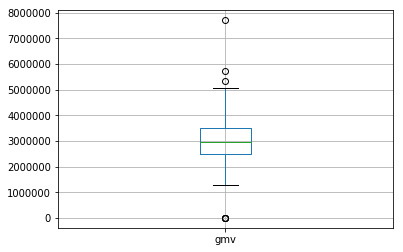

In [129]:
### Outlier Check on Weekly aggregate
boxplot = camera_final.boxplot(column=['gmv'])

In [130]:
camera_final.gmv.describe(percentiles=[.25, .5, .75, .90, .95, .99])

count    5.200000e+01
mean     3.017622e+06
std      1.399597e+06
min      5.980000e+02
25%      2.471572e+06
50%      2.959727e+06
75%      3.506639e+06
90%      4.635014e+06
95%      5.187078e+06
99%      6.697892e+06
max      7.699508e+06
Name: gmv, dtype: float64

In [131]:
### Remove the last 2 minimum values as outlier removal.
camera_final=camera_final.loc[~(camera_final.gmv == 5.980000e+02)]
camera_final=camera_final.loc[~(camera_final.gmv==1.819000e+03)]

#### <div id=18></div>CameraAccessory - Data Analysis

In [132]:
camera_final.head(4)

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Week,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other
0,0,0,0,0,1.0,0,0.0,16084.0,0.470588,0.500000,2015-07-05,18.0,3.264706,1.323529,0,0,39.804973,0,1.0,0.0,0,0.0,0,13.0,1.0,0,0,0,0,0,0,1.0,8042.000000,1,1,0,0,0,54.599588,1177.0,3.997134e+06,50446.309880,593419.743794,1.736972e+06,218.553818,310946.888189,128207.456473,1.176923e+06,0.0,0.0
1,16,13,0,0,260.0,0,19.0,2274396.0,0.000000,0.000000,2015-07-12,758.0,7.099222,2.737721,0,0,42.014021,33,205.0,551.0,4,167.0,0,443.0,85.0,0,0,0,0,0,12,196.0,371338.166667,2,1,0,1,1,54.599588,1177.0,5.595987e+06,70624.833832,830787.641311,2.431761e+06,305.975345,435325.643465,179490.439062,1.647692e+06,0.0,0.0
2,22,24,0,0,313.0,0,23.0,2412128.0,0.000000,0.000000,2015-07-19,848.0,6.469560,2.754690,1,2,43.396963,20,254.0,622.0,11,134.0,0,491.0,99.0,0,0,0,0,0,5,196.0,338842.714286,2,1,0,1,1,54.599588,1177.0,5.595987e+06,70624.833832,830787.641311,2.431761e+06,305.975345,435325.643465,179490.439062,1.647692e+06,0.0,0.0
3,31,23,0,0,382.0,0,24.0,2378641.0,0.005510,0.006297,2015-07-26,801.0,6.410917,2.832621,0,0,43.083996,27,221.0,623.0,7,154.0,0,463.0,66.0,0,0,0,0,0,9,242.0,333070.857143,2,1,0,1,1,54.599588,1177.0,5.595987e+06,70624.833832,830787.641311,2.431761e+06,305.975345,435325.643465,179490.439062,1.647692e+06,0.0,0.0


In [133]:
camera_final=camera_final.set_index(camera_final.Week)

In [134]:
camera_final.drop('Week',axis=1,inplace=True)

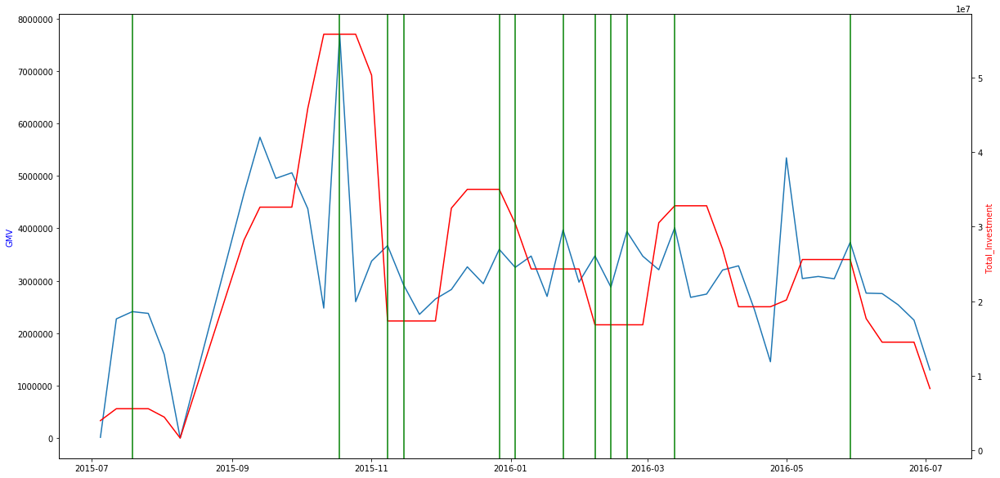

In [135]:
### Plotting GMV, Investment and Sale day .
### Red line - Total investment 
### Blue line - GMV/Revenue 
### Green line - Sale day 

sale_week=camera_final.loc[(camera_final.saleday > 0)].index
fig_camera = plt.figure(figsize=(20, 10))
axis1 = fig_camera.add_subplot(111)
axis1.plot(camera_final.index, camera_final.gmv)
axis1.set_ylabel('GMV',color='b')
axis2 = axis1.twinx()
axis2.plot(camera_final.index,camera_final.Total_Investment, 'r-')
axis2.set_ylabel('Total_Investment ', color='r')

for wk in sale_week:
    plt.axvline(x=wk, color='g')
    
##Observation : Investment trend has some correlation with revenue but not always.
## Investment had a one-time high during Oct 2015. 
## Sale day : There is jump in revenue for most part during the sale day compared to the earlier week.

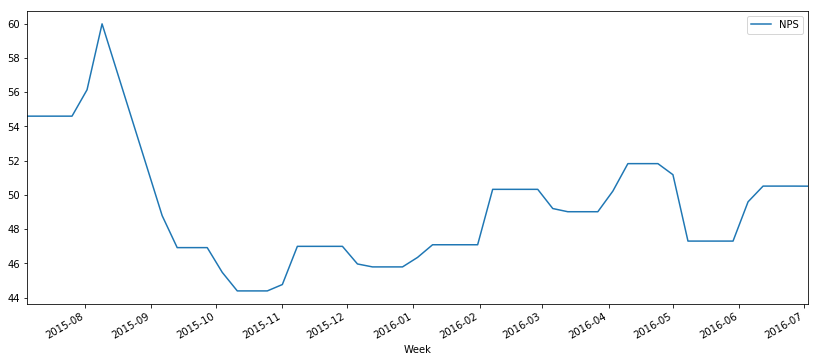

In [136]:
plt.figure(figsize=(14, 6))
camera_final.NPS.plot(label="NPS")
plt.legend()
### NPS was high only during the high investment week and then a dip seen. 
### Followed by a increase in trend in July.

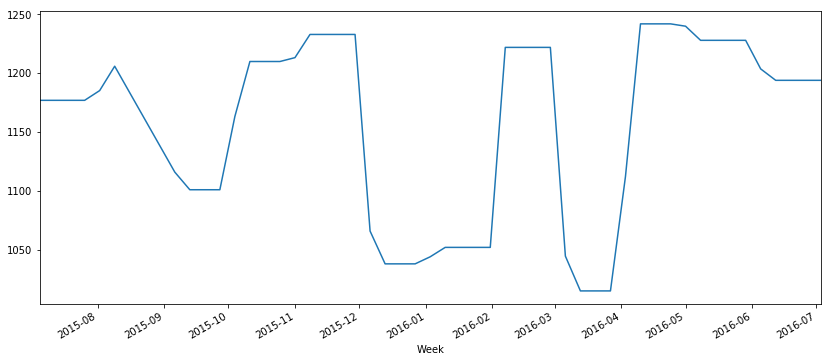

In [137]:
plt.figure(figsize=(14, 6))
camera_final.Stock.plot()
### Stock Index seems to be cyclic but has not dipped to low from April 2016 onwards.

In [138]:
camera_withoutGMV=camera_final.copy()
camera_withoutGMV=camera_withoutGMV.drop('gmv',axis=1)

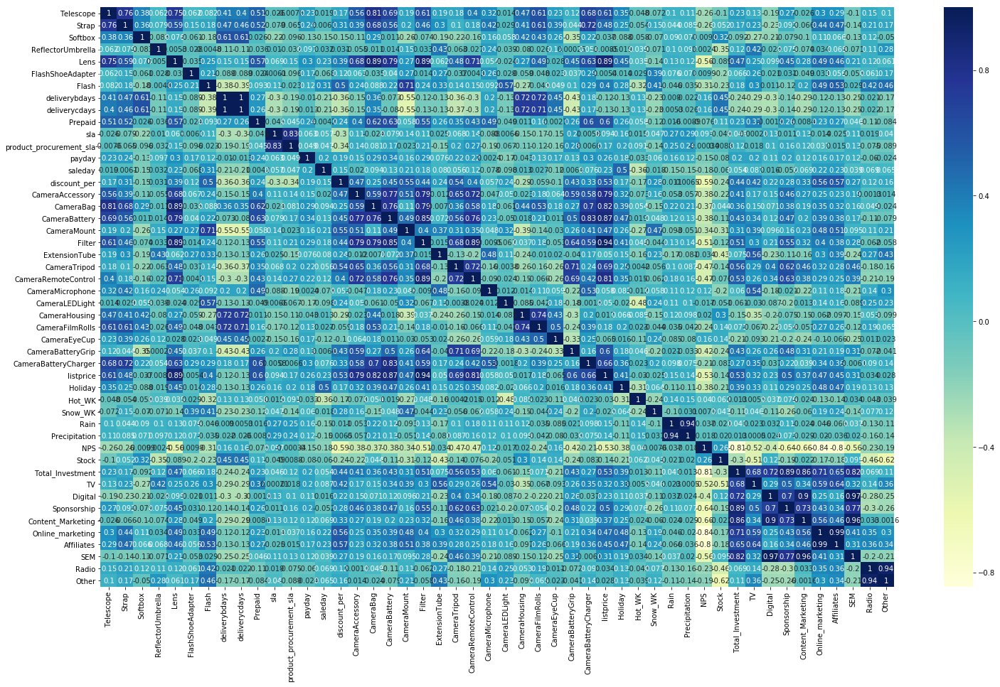

In [139]:
### Correlation Matrix of the features
plt.figure(figsize = (25, 15))
sns.heatmap(camera_withoutGMV.corr(), annot = True, cmap="YlGnBu")
plt.show()

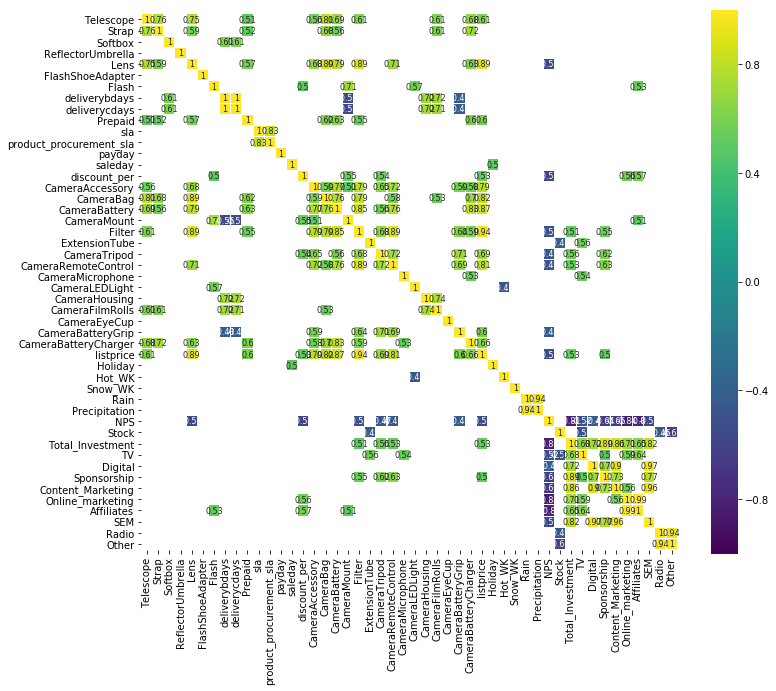

In [140]:
### Correlation Matrix
corr = camera_final.drop('gmv', axis=1).corr() # We already examined SalePrice correlations
plt.figure(figsize=(12, 10))

sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
             cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
             annot=True, annot_kws={"size": 8}, square=True);

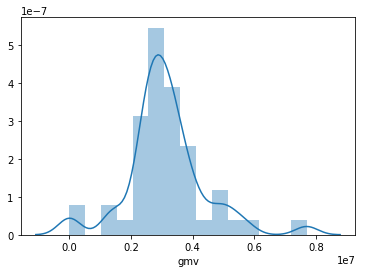

In [141]:
sns.distplot(camera_final['gmv'])
plt.show()

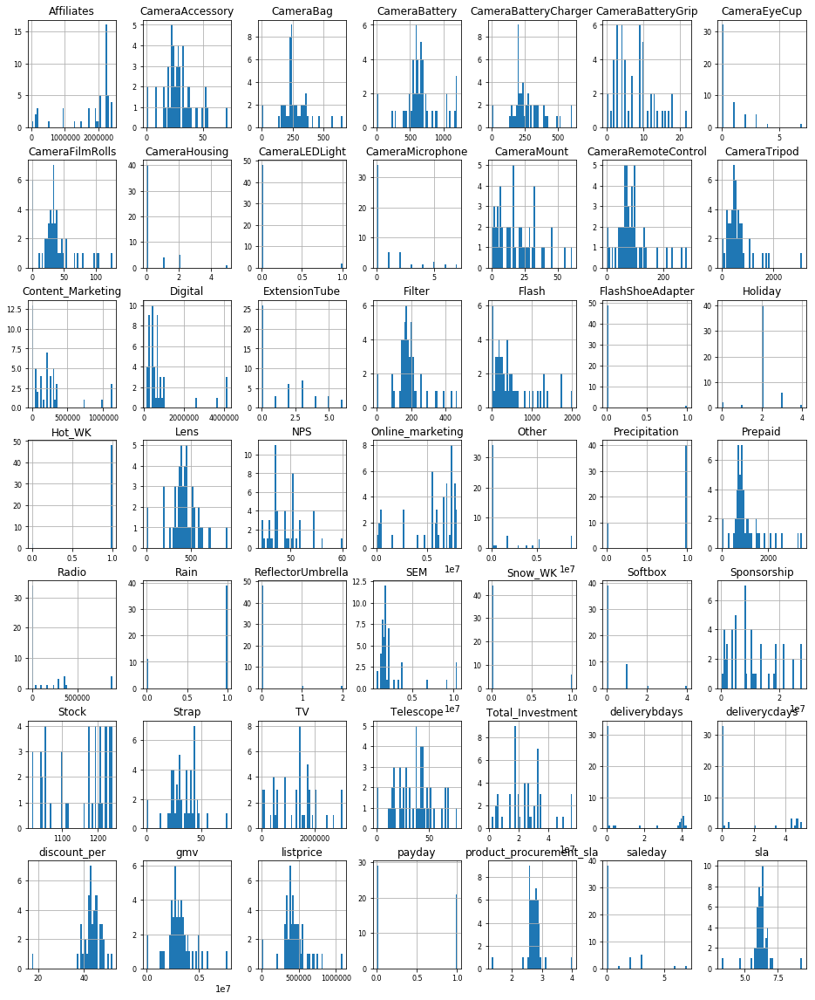

In [142]:
camera_final.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

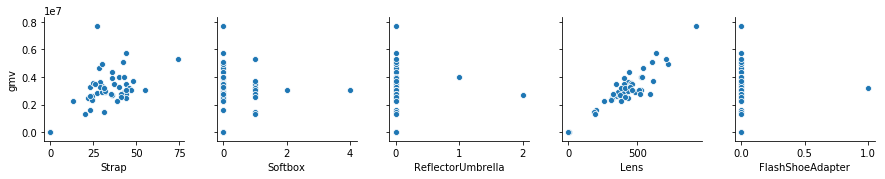

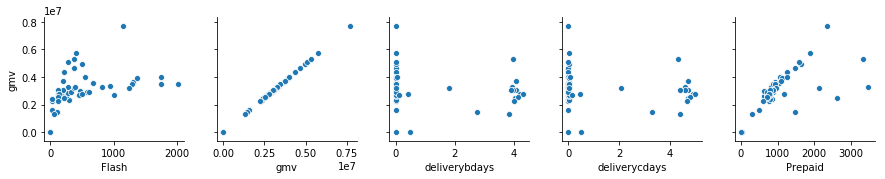

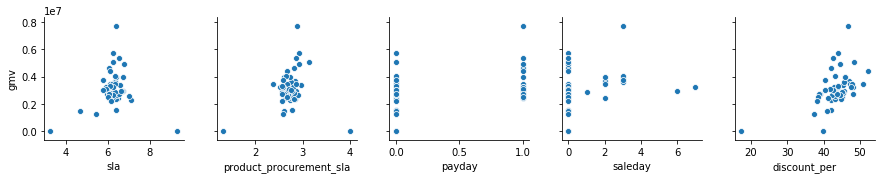

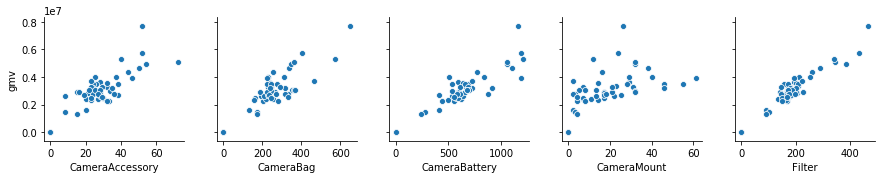

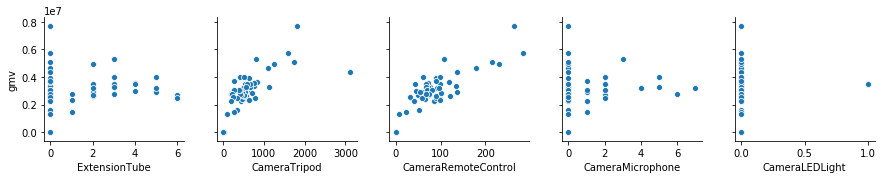

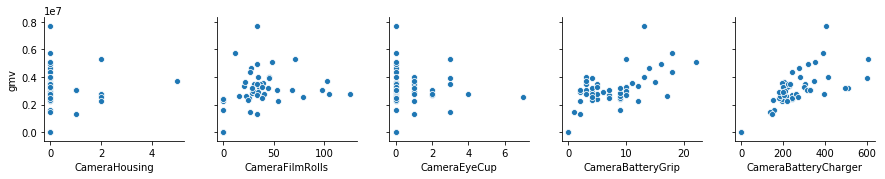

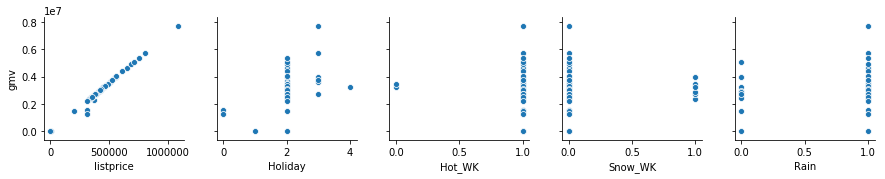

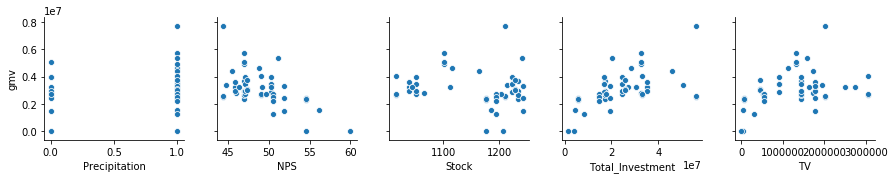

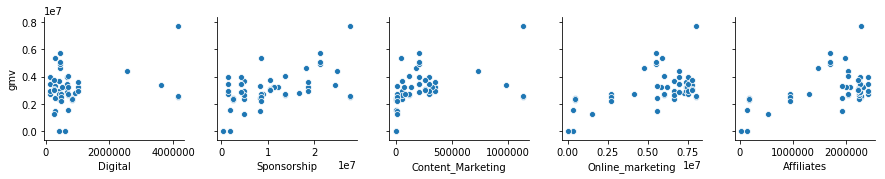

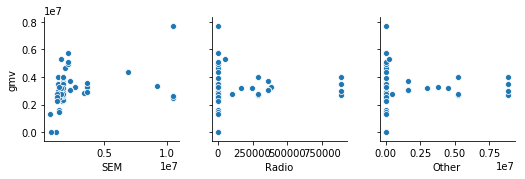

In [143]:
for i in range(1, len(camera_final.columns), 5):
     sns.pairplot(data=camera_final,
                 x_vars=camera_final.columns[i:i+5],
                 y_vars=['gmv'])

Most of the features are having linear relationship with `gmv`

In [144]:
df_num_corr = camera_final.corr()['gmv'][1:] # 1 because the first row is gmv
features_list = df_num_corr[abs(df_num_corr) > 0.5].sort_values(ascending=False)
print("There is {} strongly correlated values with gmv:\n{}".format(len(features_list), features_list))

There is 17 strongly correlated values with gmv:
gmv                     1.000000
listprice               0.991680
Filter                  0.945928
Lens                    0.904379
CameraBattery           0.878310
CameraBag               0.821620
CameraRemoteControl     0.819851
CameraAccessory         0.790835
CameraTripod            0.687884
CameraBatteryCharger    0.663542
Prepaid                 0.604713
CameraBatteryGrip       0.586967
Total_Investment        0.553736
discount_per            0.533668
Sponsorship             0.518428
Online_marketing        0.515781
NPS                    -0.557015
Name: gmv, dtype: float64


In [145]:
# Calculate the VIFs amongst the features
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
38,Total_Investment,7.792558e+09
41,Sponsorship,1.775600e+09
43,Online_marketing,3.238460e+08
45,SEM,1.437638e+08
47,Other,1.020584e+08
44,Affiliates,6.274133e+07
39,TV,1.905817e+07
40,Digital,1.457242e+07
42,Content_Marketing,1.187533e+06
37,Stock,3.568547e+05


#### <div id=19></div>Model Building - Linear

In [146]:
#creating the train and validation set from orignial data set
camera_linear=camera_final.copy()
train = camera_linear[:int(0.7*(len(camera_linear)))]
test = camera_linear[int(0.7*(len(camera_linear))):]

In [147]:
camera_linear.columns

Index(['Telescope', 'Strap', 'Softbox', 'ReflectorUmbrella', 'Lens',
       'FlashShoeAdapter', 'Flash', 'gmv', 'deliverybdays', 'deliverycdays',
       'Prepaid', 'sla', 'product_procurement_sla', 'payday', 'saleday',
       'discount_per', 'CameraAccessory', 'CameraBag', 'CameraBattery',
       'CameraMount', 'Filter', 'ExtensionTube', 'CameraTripod',
       'CameraRemoteControl', 'CameraMicrophone', 'CameraLEDLight',
       'CameraHousing', 'CameraFilmRolls', 'CameraEyeCup', 'CameraBatteryGrip',
       'CameraBatteryCharger', 'listprice', 'Holiday', 'Hot_WK', 'Snow_WK',
       'Rain', 'Precipitation', 'NPS', 'Stock', 'Total_Investment', 'TV',
       'Digital', 'Sponsorship', 'Content_Marketing', 'Online_marketing',
       'Affiliates', 'SEM', 'Radio', 'Other'],
      dtype='object')

In [148]:
### Feature Scaling

cols_orig=['Telescope', 'Strap', 'Softbox', 'ReflectorUmbrella', 'Lens',
       'FlashShoeAdapter', 'Flash', 'deliverybdays', 'deliverycdays',
       'Prepaid', 'sla', 'product_procurement_sla', 'payday', 'saleday',
       'discount_per', 'CameraAccessory', 'CameraBag', 'CameraBattery',
       'CameraMount', 'Filter', 'ExtensionTube', 'CameraTripod',
       'CameraRemoteControl', 'CameraMicrophone', 'CameraLEDLight',
       'CameraHousing', 'CameraFilmRolls', 'CameraEyeCup', 'CameraBatteryGrip',
       'CameraBatteryCharger', 'listprice', 'Holiday', 'Hot_WK', 'Snow_WK',
       'Rain', 'Precipitation', 'NPS', 'Stock', 'Total_Investment', 'TV',
       'Digital', 'Sponsorship', 'Content_Marketing', 'Online_marketing',
       'Affiliates', 'SEM', 'Radio', 'Other']
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train[cols_orig]= scaler.fit_transform(train[cols_orig])
train.head(4)

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other
Week,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-07-05,-2.007241,-2.766336,-0.171499,-0.232845,-2.494078,-0.171499,-1.126190,16084.0,5.645863,5.611329,-2.042008,-4.062751,-4.113546,-0.866025,-0.560931,-0.866591,-2.044101,-2.286994,-2.460107,-1.674529,-2.135344,-0.841939,-1.317307,-1.573601,-0.395817,-0.246183,0.0,-1.860293,-0.47907,-1.714984,-2.113060,-2.379480,-1.799352,0.246183,-0.454859,-1.837117,-2.0,1.604688,0.488346,-1.498646,-1.683035,-0.388246,-1.012710,-0.901441,-2.112443,-2.128919,-0.662809,-0.473266,-0.512309
2015-07-12,-0.991834,-1.540744,-0.171499,-0.232845,-0.923367,-0.171499,-1.091482,2274396.0,-0.242604,-0.248283,-0.381943,0.923031,-0.051272,-0.866025,-0.560931,-0.450715,0.183198,-0.344206,-0.403441,-1.396104,-0.361959,-0.841939,-0.558786,-0.260778,-0.395817,-0.246183,0.0,-1.860293,-0.47907,0.528920,-0.421571,-0.470699,-0.142054,0.246183,-0.454859,0.544331,0.5,1.604688,0.488346,-1.390428,-1.657146,-0.180463,-0.938019,-0.901170,-2.064254,-2.064381,-0.493587,-0.473266,-0.512309
2015-07-19,-0.611057,-0.503705,-0.171499,-0.232845,-0.601947,-0.171499,-1.084175,2412128.0,-0.242604,-0.248283,-0.180043,0.104320,-0.002529,1.154701,0.593927,-0.190362,-0.694223,0.122445,-0.138426,-0.908859,-0.712388,-0.841939,-0.474114,-0.041975,-0.395817,-0.246183,0.0,-1.860293,-0.47907,-0.780024,-0.421571,-0.641432,-0.142054,0.246183,-0.454859,0.544331,0.5,1.604688,0.488346,-1.390428,-1.657146,-0.180463,-0.938019,-0.901170,-2.064254,-2.064381,-0.493587,-0.473266,-0.512309
2015-07-26,-0.039891,-0.597981,-0.171499,-0.232845,-0.183495,-0.171499,-1.082349,2378641.0,-0.173662,-0.174490,-0.285480,0.028071,0.221328,-0.866025,-0.560931,-0.249281,-0.221766,-0.191830,-0.134694,-1.187285,-0.500007,-0.841939,-0.523506,-0.557726,-0.395817,-0.246183,0.0,-1.860293,-0.47907,-0.032056,-0.022553,-0.671758,-0.142054,0.246183,-0.454859,0.544331,0.5,1.604688,0.488346,-1.390428,-1.657146,-0.180463,-0.938019,-0.901170,-2.064254,-2.064381,-0.493587,-0.473266,-0.512309


In [149]:
#Feature selection using rFE
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE

X=train.copy()
X=X.drop('gmv',axis=1)
Y=train['gmv']
estimator_lr=LinearRegression()
rfe = RFE(estimator_lr, 15)             
rfe = rfe.fit(X,Y)

In [150]:
ranking=pd.DataFrame(list(zip(X.columns,rfe.support_,rfe.ranking_)),columns=('Feature','FistList','Rank'))
ranking. head(3)

,Feature,FistList,Rank
0,Telescope,False,7
1,Strap,False,25
2,Softbox,False,3


In [151]:
col_rfe = X.columns[rfe.support_]
col_rfe

Index(['FlashShoeAdapter', 'Flash', 'Prepaid', 'product_procurement_sla',
       'discount_per', 'CameraBag', 'Filter', 'CameraTripod', 'CameraEyeCup',
       'CameraBatteryGrip', 'CameraBatteryCharger', 'listprice', 'Rain',
       'Precipitation', 'Affiliates'],
      dtype='object')

In [152]:
ranking.loc[(ranking.Rank >= 2) & (ranking.Rank<=15)]

,Feature,FistList,Rank
0,Telescope,False,7
2,Softbox,False,3
4,Lens,False,13
12,payday,False,14
13,saleday,False,12
17,CameraBattery,False,6
22,CameraRemoteControl,False,8
23,CameraMicrophone,False,4
26,CameraFilmRolls,False,15
32,Hot_WK,False,11


In [153]:
# Calculate the VIFs on the features selected by RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,listprice,294.58
6,Filter,82.72
5,CameraBag,78.48
4,discount_per,53.56
13,Precipitation,51.82
12,Rain,46.67
3,product_procurement_sla,39.33
10,CameraBatteryCharger,21.17
14,Affiliates,13.99
9,CameraBatteryGrip,10.99


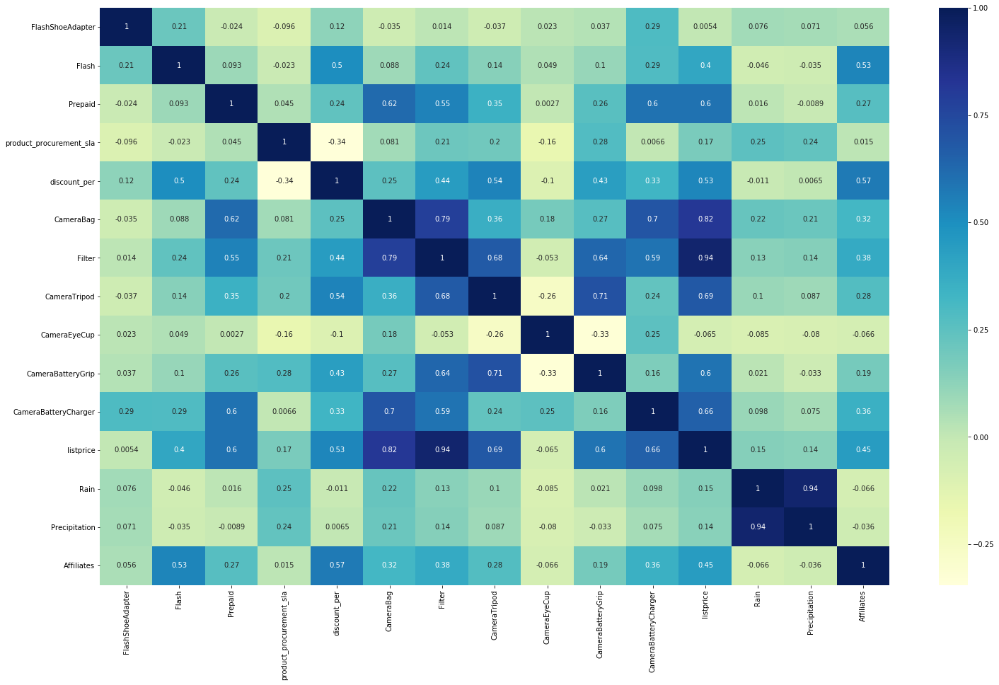

In [154]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(X.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [155]:
## remove attributes with high multicolinearity 
col_rfe=['FlashShoeAdapter', 'Flash', 'Prepaid', 'product_procurement_sla',
       'discount_per', 'CameraBag', 'CameraTripod', 'CameraEyeCup',
        'CameraBatteryCharger', 'Rain', 'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,discount_per,49.99
3,product_procurement_sla,37.16
5,CameraBag,20.12
8,CameraBatteryCharger,18.44
10,Affiliates,12.65
2,Prepaid,6.90
9,Rain,5.52
6,CameraTripod,3.65
1,Flash,3.14
7,CameraEyeCup,1.74


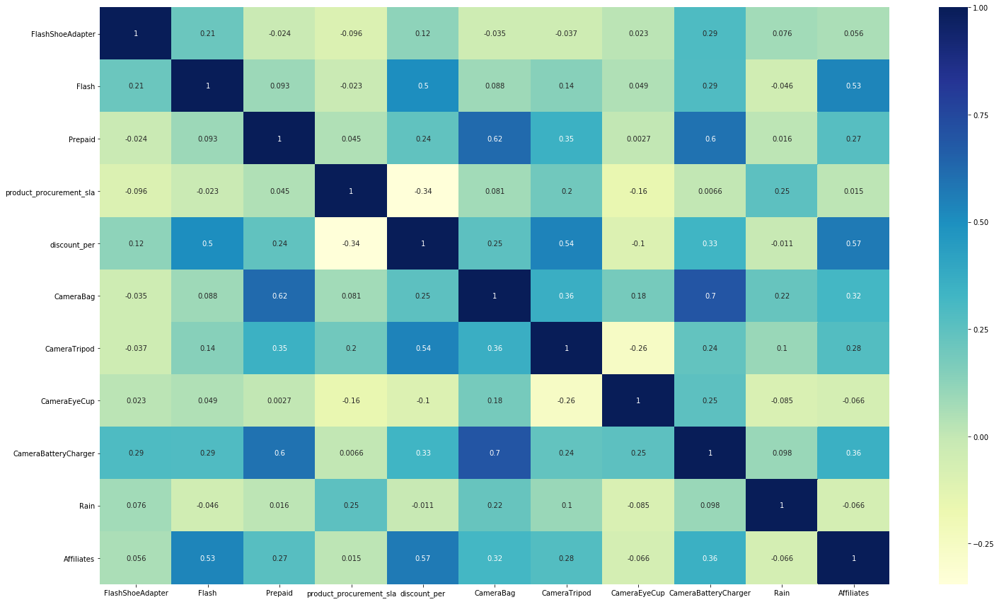

In [156]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(X.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [157]:
## remove attributes with high multicolinearity 
col_rfe=['FlashShoeAdapter', 'Flash', 'Prepaid', 'product_procurement_sla',
        'CameraTripod', 'CameraEyeCup',
         'Rain', 'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,product_procurement_sla,12.67
7,Affiliates,10.25
6,Rain,4.98
2,Prepaid,4.10
4,CameraTripod,3.28
1,Flash,2.96
5,CameraEyeCup,1.41
0,FlashShoeAdapter,1.09


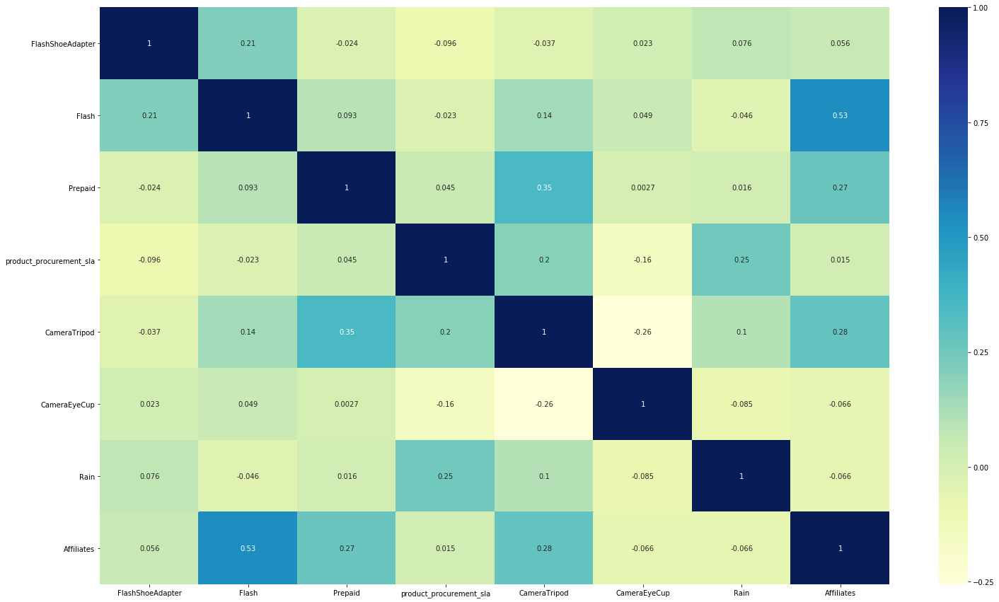

In [158]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(X.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [159]:
import statsmodels.api as sm
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m1 = sm.OLS(y,X).fit()
camera_linear_m1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     299.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.36e-23
Time:                        21:43:37   Log-Likelihood:                -465.21
No. Observations:                  35   AIC:                             948.4
Df Residuals:                      26   BIC:                             962.4
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                    3.255e+06   2.81e+04    115.803      0.000     3.2e+06    3.31e+06
FlashShoeAdapter        -4.045e+04   2.92e+04     -1.385      0.178      -1e+05    1.96e+04
Flash                    1.093e+05   4.19e+04      2.609      0.015    2.32e+04    1.95e+05
Prepaid                  1.214e+06   4.39e+04     27.674      0.000    1.12e+06     1.3e+06
product_procurement_sla  5066.6332   3.04e+04      0.167      0.869   -5.74e+04    6.76e+04
CameraTripod             4.068e+04   4.36e+04      0.933      0.359   -4.89e+04     1.3e+05
CameraEyeCup            -6.313e+04   3.36e+04     -1.879      0.071   -1.32e+05    5916.703
Rain                     -1.49e+04   3.01e+04     -0.495      0.625   -7.68e+04     4.7e+04
Affiliates               2.381e+05   3.66e+04      6.510      0.000    1.63e+05    3.13e+05
==============================================================================
Omnibus:                        1.026   Durbin-Watson:                   2.188
Prob(Omnibus):                  0.599   Jarque-Bera (JB):                0.262
Skew:                           0.063   Prob(JB):                        0.877
Kurtosis:                       3.404   Cond. No.                         3.25
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [160]:
## remove attributes with high multicolinearity /high p-value
col_rfe=['FlashShoeAdapter', 'Flash', 'Prepaid', 'CameraTripod', 'CameraEyeCup',
         'Rain', 'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Affiliates,7.26
2,Prepaid,3.98
3,CameraTripod,3.22
5,Rain,3.17
1,Flash,2.93
4,CameraEyeCup,1.34
0,FlashShoeAdapter,1.09


In [161]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m2 = sm.OLS(y,X).fit()
camera_linear_m2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     355.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.02e-25
Time:                        21:43:37   Log-Likelihood:                -465.23
No. Observations:                  35   AIC:                             946.5
Df Residuals:                      27   BIC:                             958.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.255e+06   2.76e+04    117.946      0.000     3.2e+06    3.31e+06
FlashShoeAdapter -4.106e+04   2.84e+04     -1.444      0.160   -9.94e+04    1.73e+04
Flash             1.091e+05   4.11e+04      2.653      0.013    2.47e+04    1.93e+05
Prepaid           1.215e+06   4.29e+04     28.345      0.000    1.13e+06     1.3e+06
CameraTripod      4.042e+04   4.28e+04      0.945      0.353   -4.73e+04    1.28e+05
CameraEyeCup     -6.396e+04   3.26e+04     -1.962      0.060   -1.31e+05    2936.358
Rain             -1.348e+04   2.83e+04     -0.476      0.638   -7.16e+04    4.47e+04
Affiliates        2.383e+05   3.59e+04      6.641      0.000    1.65e+05    3.12e+05
==============================================================================
Omnibus:                        0.975   Durbin-Watson:                   2.180
Prob(Omnibus):                  0.614   Jarque-Bera (JB):                0.234
Skew:                           0.059   Prob(JB):                        0.889
Kurtosis:                       3.383   Cond. No.                         3.24
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [162]:
## remove attributes with high multicolinearity /high p-value
col_rfe=['FlashShoeAdapter', 'Flash', 'Prepaid', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Affiliates,6.27
2,Prepaid,3.90
3,CameraTripod,3.11
1,Flash,2.90
4,CameraEyeCup,1.32
0,FlashShoeAdapter,1.07


In [163]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m3 = sm.OLS(y,X).fit()
camera_linear_m3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     426.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.62e-26
Time:                        21:43:37   Log-Likelihood:                -465.38
No. Observations:                  35   AIC:                             944.8
Df Residuals:                      28   BIC:                             955.6
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.255e+06   2.72e+04    119.611      0.000     3.2e+06    3.31e+06
FlashShoeAdapter -4.259e+04   2.79e+04     -1.529      0.138   -9.97e+04    1.45e+04
Flash             1.094e+05   4.05e+04      2.698      0.012    2.63e+04    1.92e+05
Prepaid           1.214e+06   4.22e+04     28.781      0.000    1.13e+06     1.3e+06
CameraTripod      3.921e+04   4.21e+04      0.931      0.360    -4.7e+04    1.25e+05
CameraEyeCup     -6.378e+04   3.21e+04     -1.984      0.057    -1.3e+05    2078.448
Affiliates        2.404e+05   3.51e+04      6.842      0.000    1.68e+05    3.12e+05
==============================================================================
Omnibus:                        1.368   Durbin-Watson:                   2.185
Prob(Omnibus):                  0.505   Jarque-Bera (JB):                0.478
Skew:                           0.134   Prob(JB):                        0.787
Kurtosis:                       3.506   Cond. No.                         3.24
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [164]:
## Adding next set of features
col_rfe=['Telescope','Softbox','Lens','payday','saleday','CameraBattery','CameraRemoteControl','CameraMicrophone',
         'CameraFilmRolls','Hot_WK','Snow_WK','Stock','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'Prepaid', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
19,Affiliates,699.82
13,Online_marketing,581.88
2,Lens,94.94
5,CameraBattery,49.66
11,Stock,43.63
9,Hot_WK,39.95
0,Telescope,29.22
12,TV,29.01
6,CameraRemoteControl,23.18
8,CameraFilmRolls,13.86


In [165]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m4 = sm.OLS(y,X).fit()
camera_linear_m4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     108.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.87e-12
Time:                        21:43:37   Log-Likelihood:                -456.21
No. Observations:                  35   AIC:                             954.4
Df Residuals:                      14   BIC:                             987.1
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                3.255e+06   2.96e+04    109.901      0.000    3.19e+06    3.32e+06
Telescope           -4.564e+04   8.31e+04     -0.549      0.591   -2.24e+05    1.33e+05
Softbox             -6869.8363   8.07e+04     -0.085      0.933    -1.8e+05    1.66e+05
Lens                 1.747e+05   1.51e+05      1.159      0.266   -1.48e+05    4.98e+05
payday               1484.5988   4.31e+04      0.034      0.973   -9.09e+04    9.39e+04
saleday             -6.405e+04   6.32e+04     -1.013      0.328      -2e+05    7.16e+04
CameraBattery            1e+05   1.19e+05      0.838      0.416   -1.56e+05    3.56e+05
CameraRemoteControl -1.773e+05   1.01e+05     -1.753      0.102   -3.94e+05    3.97e+04
CameraMicrophone    -5184.5929   8.26e+04     -0.063      0.951   -1.82e+05    1.72e+05
CameraFilmRolls      -5.78e+04   8.65e+04     -0.668      0.515   -2.43e+05    1.28e+05
Hot_WK              -6.177e+04   7.12e+04     -0.867      0.400   -2.15e+05     9.1e+04
Snow_WK             -2.352e+04   8.42e+04     -0.279      0.784   -2.04e+05    1.57e+05
Stock                7625.3375   5.65e+04      0.135      0.895   -1.14e+05    1.29e+05
TV                  -5.032e+04   1.45e+05     -0.347      0.734   -3.61e+05     2.6e+05
Online_marketing     1.298e+05   3.46e+05      0.375      0.713   -6.12e+05    8.71e+05
FlashShoeAdapter    -7837.4575   6.23e+04     -0.126      0.902   -1.42e+05    1.26e+05
Flash                7.076e+04   9.43e+04      0.750      0.466   -1.32e+05    2.73e+05
Prepaid              1.201e+06   2.55e+05      4.714      0.000    6.55e+05    1.75e+06
CameraTripod         3.385e+04   6.76e+04      0.500      0.625   -1.11e+05    1.79e+05
CameraEyeCup        -4.881e+04    9.3e+04     -0.525      0.608   -2.48e+05    1.51e+05
Affiliates           1.598e+05   3.77e+05      0.424      0.678   -6.48e+05    9.68e+05
==============================================================================
Omnibus:                        2.311   Durbin-Watson:                   2.444
Prob(Omnibus):                  0.315   Jarque-Bera (JB):                1.181
Skew:                          -0.291   Prob(JB):                        0.554
Kurtosis:                       3.687   Cond. No.                         45.8
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [166]:
### Removing features with high VIF/high p-value
col_rfe=['Telescope','Softbox','Lens','saleday','CameraBattery','CameraRemoteControl','CameraMicrophone',
         'CameraFilmRolls','Hot_WK','Snow_WK','Stock','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'Prepaid', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
18,Affiliates,693.84
12,Online_marketing,577.61
2,Lens,94.94
4,CameraBattery,48.45
10,Stock,43.62
8,Hot_WK,39.95
0,Telescope,29.20
11,TV,28.68
5,CameraRemoteControl,22.82
7,CameraFilmRolls,13.86


In [167]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m5 = sm.OLS(y,X).fit()
camera_linear_m5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     122.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.28e-13
Time:                        21:43:37   Log-Likelihood:                -456.21
No. Observations:                  35   AIC:                             952.4
Df Residuals:                      15   BIC:                             983.5
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                3.255e+06   2.86e+04    113.754      0.000    3.19e+06    3.32e+06
Telescope           -4.438e+04   7.21e+04     -0.616      0.547   -1.98e+05    1.09e+05
Softbox             -6898.3327    7.8e+04     -0.088      0.931   -1.73e+05    1.59e+05
Lens                 1.753e+05   1.45e+05      1.211      0.244   -1.33e+05    4.84e+05
saleday             -6.319e+04   5.61e+04     -1.126      0.278   -1.83e+05    5.65e+04
CameraBattery        1.001e+05   1.15e+05      0.869      0.398   -1.45e+05    3.46e+05
CameraRemoteControl -1.774e+05   9.77e+04     -1.815      0.090   -3.86e+05    3.09e+04
CameraMicrophone    -6248.4420    7.4e+04     -0.084      0.934   -1.64e+05    1.51e+05
CameraFilmRolls     -5.821e+04   8.28e+04     -0.703      0.493   -2.35e+05    1.18e+05
Hot_WK              -6.139e+04    6.8e+04     -0.903      0.381   -2.06e+05    8.35e+04
Snow_WK             -2.322e+04   8.09e+04     -0.287      0.778   -1.96e+05    1.49e+05
Stock                7800.0993   5.44e+04      0.143      0.888   -1.08e+05    1.24e+05
TV                  -4.897e+04   1.35e+05     -0.363      0.721   -3.36e+05    2.38e+05
Online_marketing     1.313e+05   3.31e+05      0.396      0.698   -5.75e+05    8.38e+05
FlashShoeAdapter    -7545.9966   5.97e+04     -0.126      0.901   -1.35e+05     1.2e+05
Flash                7.126e+04      9e+04      0.791      0.441   -1.21e+05    2.63e+05
Prepaid              1.199e+06   2.41e+05      4.969      0.000    6.85e+05    1.71e+06
CameraTripod         3.451e+04   6.27e+04      0.551      0.590   -9.91e+04    1.68e+05
CameraEyeCup        -4.826e+04   8.86e+04     -0.545      0.594   -2.37e+05    1.41e+05
Affiliates           1.571e+05   3.56e+05      0.441      0.665   -6.02e+05    9.16e+05
==============================================================================
Omnibus:                        2.371   Durbin-Watson:                   2.445
Prob(Omnibus):                  0.306   Jarque-Bera (JB):                1.229
Skew:                          -0.299   Prob(JB):                        0.541
Kurtosis:                       3.697   Cond. No.                         44.4
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [168]:
### Removing features with high VIF/high p-value
col_rfe=['Telescope','Softbox','Lens','saleday','CameraBattery','CameraRemoteControl',
         'CameraFilmRolls','Hot_WK','Snow_WK','Stock','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'Prepaid', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
17,Affiliates,693.84
11,Online_marketing,565.60
2,Lens,90.02
4,CameraBattery,45.81
9,Stock,43.62
7,Hot_WK,39.82
0,Telescope,27.89
5,CameraRemoteControl,21.64
10,TV,14.77
6,CameraFilmRolls,12.90


In [169]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m6 = sm.OLS(y,X).fit()
camera_linear_m6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     137.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.55e-14
Time:                        21:43:37   Log-Likelihood:                -456.22
No. Observations:                  35   AIC:                             950.4
Df Residuals:                      16   BIC:                             980.0
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                3.255e+06   2.77e+04    117.456      0.000     3.2e+06    3.31e+06
Telescope           -4.503e+04   6.94e+04     -0.649      0.526   -1.92e+05    1.02e+05
Softbox             -1.007e+04   6.62e+04     -0.152      0.881    -1.5e+05     1.3e+05
Lens                 1.766e+05   1.39e+05      1.268      0.223   -1.19e+05    4.72e+05
saleday              -6.38e+04   5.39e+04     -1.184      0.254   -1.78e+05    5.05e+04
CameraBattery        9.879e+04   1.11e+05      0.894      0.385   -1.35e+05    3.33e+05
CameraRemoteControl -1.739e+05   8.56e+04     -2.030      0.059   -3.55e+05    7679.444
CameraFilmRolls      -5.85e+04   8.01e+04     -0.730      0.476   -2.28e+05    1.11e+05
Hot_WK              -6.246e+04   6.47e+04     -0.965      0.349      -2e+05    7.47e+04
Snow_WK             -2.536e+04   7.43e+04     -0.341      0.737   -1.83e+05    1.32e+05
Stock                7852.9778   5.26e+04      0.149      0.883   -1.04e+05    1.19e+05
TV                  -5.707e+04   9.17e+04     -0.622      0.543   -2.52e+05    1.37e+05
Online_marketing      1.43e+05   2.91e+05      0.491      0.630   -4.75e+05    7.61e+05
FlashShoeAdapter    -7317.5433   5.77e+04     -0.127      0.901    -1.3e+05    1.15e+05
Flash                6.969e+04   8.53e+04      0.817      0.426   -1.11e+05    2.51e+05
Prepaid              1.197e+06   2.31e+05      5.169      0.000    7.06e+05    1.69e+06
CameraTripod         3.526e+04   6.01e+04      0.587      0.565   -9.21e+04    1.63e+05
CameraEyeCup         -4.58e+04    8.1e+04     -0.566      0.580   -2.17e+05    1.26e+05
Affiliates           1.518e+05   3.39e+05      0.447      0.661   -5.68e+05    8.71e+05
==============================================================================
Omnibus:                        2.396   Durbin-Watson:                   2.445
Prob(Omnibus):                  0.302   Jarque-Bera (JB):                1.251
Skew:                          -0.289   Prob(JB):                        0.535
Kurtosis:                       3.724   Cond. No.                         42.7
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [170]:
### Removing features with high VIF/high p-value
col_rfe=['Telescope','Softbox','Lens','saleday','CameraBattery','CameraRemoteControl',
         'CameraFilmRolls','Hot_WK','Snow_WK','Stock','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
16,Affiliates,618.61
11,Online_marketing,482.83
2,Lens,81.55
9,Stock,42.73
4,CameraBattery,42.30
7,Hot_WK,37.29
0,Telescope,27.85
5,CameraRemoteControl,20.72
10,TV,14.37
6,CameraFilmRolls,12.78


In [171]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m7 = sm.OLS(y,X).fit()
camera_linear_m7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.966
Method:                 Least Squares   F-statistic:                     57.34
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.09e-11
Time:                        21:43:38   Log-Likelihood:                -473.40
No. Observations:                  35   AIC:                             982.8
Df Residuals:                      17   BIC:                             1011.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                3.255e+06   4.39e+04     74.098      0.000    3.16e+06    3.35e+06
Telescope           -3392.3444   1.09e+05     -0.031      0.976   -2.34e+05    2.27e+05
Softbox              1.011e+05   9.92e+04      1.019      0.322   -1.08e+05     3.1e+05
Lens                 6.727e+05    1.6e+05      4.205      0.001    3.35e+05    1.01e+06
saleday              3.657e+04   7.97e+04      0.459      0.652   -1.32e+05    2.05e+05
CameraBattery        4.646e+05   1.35e+05      3.453      0.003    1.81e+05    7.48e+05
CameraRemoteControl    2.1e+04   1.22e+05      0.172      0.865   -2.36e+05    2.78e+05
CameraFilmRolls     -7.248e+04   1.27e+05     -0.571      0.575    -3.4e+05    1.95e+05
Hot_WK               5.829e+04   9.56e+04      0.609      0.550   -1.44e+05     2.6e+05
Snow_WK              1.741e+05   1.01e+05      1.728      0.102   -3.85e+04    3.87e+05
Stock               -5.242e+04   8.14e+04     -0.644      0.528   -2.24e+05    1.19e+05
TV                   1.914e+05   1.24e+05      1.546      0.140   -6.98e+04    4.53e+05
Online_marketing     6.626e+05   4.33e+05      1.529      0.145   -2.52e+05    1.58e+06
FlashShoeAdapter    -1.394e+05    8.2e+04     -1.699      0.108   -3.13e+05    3.37e+04
Flash                3.866e+05   9.41e+04      4.109      0.001    1.88e+05    5.85e+05
CameraTripod         2.439e+05   7.05e+04      3.459      0.003    9.51e+04    3.93e+05
CameraEyeCup        -1.928e+05    1.2e+05     -1.604      0.127   -4.46e+05    6.08e+04
Affiliates          -8.577e+05    4.4e+05     -1.949      0.068   -1.79e+06    7.09e+04
==============================================================================
Omnibus:                        2.776   Durbin-Watson:                   2.266
Prob(Omnibus):                  0.250   Jarque-Bera (JB):                1.669
Skew:                          -0.494   Prob(JB):                        0.434
Kurtosis:                       3.408   Cond. No.                         33.1
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [172]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens','saleday','CameraBattery','CameraRemoteControl',
         'CameraFilmRolls','Hot_WK','Snow_WK','Stock','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
15,Affiliates,618.59
10,Online_marketing,481.50
1,Lens,67.30
8,Stock,42.28
6,Hot_WK,35.30
3,CameraBattery,32.09
4,CameraRemoteControl,19.72
9,TV,14.24
5,CameraFilmRolls,12.06
13,CameraTripod,6.24


In [173]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m8 = sm.OLS(y,X).fit()
camera_linear_m8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     64.50
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.31e-12
Time:                        21:43:38   Log-Likelihood:                -473.40
No. Observations:                  35   AIC:                             980.8
Df Residuals:                      18   BIC:                             1007.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                3.255e+06   4.27e+04     76.245      0.000    3.17e+06    3.34e+06
Softbox              1.007e+05   9.56e+04      1.054      0.306      -1e+05    3.01e+05
Lens                 6.714e+05    1.5e+05      4.467      0.000    3.56e+05    9.87e+05
saleday              3.731e+04   7.39e+04      0.505      0.620   -1.18e+05    1.93e+05
CameraBattery        4.628e+05   1.19e+05      3.895      0.001    2.13e+05    7.12e+05
CameraRemoteControl  2.096e+04   1.18e+05      0.177      0.862   -2.28e+05     2.7e+05
CameraFilmRolls     -7.417e+04   1.11e+05     -0.665      0.514   -3.08e+05     1.6e+05
Hot_WK               5.892e+04   9.08e+04      0.649      0.525   -1.32e+05     2.5e+05
Snow_WK              1.742e+05   9.78e+04      1.780      0.092   -3.14e+04     3.8e+05
Stock               -5.187e+04   7.72e+04     -0.672      0.510   -2.14e+05     1.1e+05
TV                   1.914e+05    1.2e+05      1.591      0.129   -6.14e+04    4.44e+05
Online_marketing     6.649e+05   4.15e+05      1.602      0.127   -2.07e+05    1.54e+06
FlashShoeAdapter    -1.397e+05   7.92e+04     -1.763      0.095   -3.06e+05    2.68e+04
Flash                3.866e+05   9.14e+04      4.229      0.001    1.95e+05    5.79e+05
CameraTripod         2.445e+05   6.63e+04      3.690      0.002    1.05e+05    3.84e+05
CameraEyeCup        -1.922e+05   1.15e+05     -1.666      0.113   -4.35e+05    5.02e+04
Affiliates          -8.587e+05   4.27e+05     -2.013      0.059   -1.75e+06    3.74e+04
==============================================================================
Omnibus:                        2.851   Durbin-Watson:                   2.275
Prob(Omnibus):                  0.240   Jarque-Bera (JB):                1.718
Skew:                          -0.499   Prob(JB):                        0.423
Kurtosis:                       3.428   Cond. No.                         31.4
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [174]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens','saleday','CameraBattery','CameraRemoteControl',
         'CameraFilmRolls','Hot_WK','Snow_WK','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,Affiliates,601.52
9,Online_marketing,473.27
1,Lens,67.25
3,CameraBattery,32.08
4,CameraRemoteControl,19.52
8,TV,13.81
5,CameraFilmRolls,12.04
6,Hot_WK,9.57
12,CameraTripod,6.23
11,Flash,4.66


In [175]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m9 = sm.OLS(y,X).fit()
camera_linear_m9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.969
Method:                 Least Squares   F-statistic:                     70.81
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.88e-13
Time:                        21:43:38   Log-Likelihood:                -473.84
No. Observations:                  35   AIC:                             979.7
Df Residuals:                      19   BIC:                             1005.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                3.255e+06   4.21e+04     77.369      0.000    3.17e+06    3.34e+06
Softbox              7.238e+04   8.45e+04      0.857      0.402   -1.04e+05    2.49e+05
Lens                 7.145e+05   1.34e+05      5.334      0.000    4.34e+05    9.95e+05
saleday              1.087e+04   6.17e+04      0.176      0.862   -1.18e+05     1.4e+05
CameraBattery        4.446e+05   1.14e+05      3.900      0.001    2.06e+05    6.83e+05
CameraRemoteControl  1790.1006   1.13e+05      0.016      0.988   -2.35e+05    2.39e+05
CameraFilmRolls     -4.055e+04   9.82e+04     -0.413      0.684   -2.46e+05    1.65e+05
Hot_WK               2.811e+04   7.73e+04      0.364      0.720   -1.34e+05     1.9e+05
Snow_WK              1.538e+05   9.17e+04      1.677      0.110   -3.81e+04    3.46e+05
TV                   2.068e+05   1.16e+05      1.777      0.092   -3.68e+04     4.5e+05
Online_marketing      6.15e+05   4.03e+05      1.528      0.143   -2.27e+05    1.46e+06
FlashShoeAdapter    -1.279e+05   7.61e+04     -1.680      0.109   -2.87e+05    3.15e+04
Flash                 3.77e+05    8.9e+04      4.237      0.000    1.91e+05    5.63e+05
CameraTripod         2.415e+05   6.51e+04      3.707      0.001    1.05e+05    3.78e+05
CameraEyeCup        -1.747e+05   1.11e+05     -1.577      0.131   -4.06e+05    5.71e+04
Affiliates           -8.39e+05   4.19e+05     -2.001      0.060   -1.72e+06    3.87e+04
==============================================================================
Omnibus:                        3.628   Durbin-Watson:                   2.304
Prob(Omnibus):                  0.163   Jarque-Bera (JB):                2.343
Skew:                          -0.579   Prob(JB):                        0.310
Kurtosis:                       3.513   Cond. No.                         30.8
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [176]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens','saleday','CameraBattery',
         'CameraFilmRolls','Hot_WK','Snow_WK','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
13,Affiliates,564.02
8,Online_marketing,449.26
1,Lens,48.14
3,CameraBattery,29.43
7,TV,13.63
4,CameraFilmRolls,10.37
5,Hot_WK,9.35
11,CameraTripod,5.61
10,Flash,4.62
12,CameraEyeCup,2.74


In [177]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m10 = sm.OLS(y,X).fit()
camera_linear_m10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.970
Method:                 Least Squares   F-statistic:                     79.86
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.04e-14
Time:                        21:43:38   Log-Likelihood:                -473.84
No. Observations:                  35   AIC:                             977.7
Df Residuals:                      20   BIC:                             1001.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.255e+06    4.1e+04     79.378      0.000    3.17e+06    3.34e+06
Softbox           7.271e+04   7.99e+04      0.910      0.373   -9.39e+04    2.39e+05
Lens              7.154e+05   1.18e+05      6.052      0.000    4.69e+05    9.62e+05
saleday           1.088e+04   6.01e+04      0.181      0.858   -1.15e+05    1.36e+05
CameraBattery     4.454e+05      1e+05      4.434      0.000    2.36e+05    6.55e+05
CameraFilmRolls  -4.118e+04   8.76e+04     -0.470      0.643   -2.24e+05    1.42e+05
Hot_WK             2.82e+04   7.51e+04      0.375      0.711   -1.28e+05    1.85e+05
Snow_WK           1.541e+05   8.65e+04      1.781      0.090   -2.64e+04    3.35e+05
TV                2.072e+05   1.11e+05      1.869      0.076    -2.4e+04    4.38e+05
Online_marketing  6.158e+05   3.89e+05      1.581      0.129   -1.96e+05    1.43e+06
FlashShoeAdapter -1.281e+05   7.34e+04     -1.745      0.096   -2.81e+05     2.5e+04
Flash              3.77e+05   8.67e+04      4.348      0.000    1.96e+05    5.58e+05
CameraTripod      2.418e+05   6.06e+04      3.989      0.001    1.15e+05    3.68e+05
CameraEyeCup     -1.751e+05   1.05e+05     -1.664      0.112   -3.94e+05    4.43e+04
Affiliates         -8.4e+05   4.04e+05     -2.079      0.051   -1.68e+06    2815.541
==============================================================================
Omnibus:                        3.601   Durbin-Watson:                   2.306
Prob(Omnibus):                  0.165   Jarque-Bera (JB):                2.322
Skew:                          -0.578   Prob(JB):                        0.313
Kurtosis:                       3.508   Cond. No.                         29.9
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [178]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens','CameraBattery',
         'CameraFilmRolls','Hot_WK','Snow_WK','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,Affiliates,553.61
7,Online_marketing,444.48
1,Lens,47.15
2,CameraBattery,29.42
6,TV,13.40
3,CameraFilmRolls,10.36
4,Hot_WK,8.77
10,CameraTripod,5.53
9,Flash,4.57
11,CameraEyeCup,2.73


In [179]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m11 = sm.OLS(y,X).fit()
camera_linear_m11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.972
Method:                 Least Squares   F-statistic:                     90.16
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.12e-15
Time:                        21:43:38   Log-Likelihood:                -473.87
No. Observations:                  35   AIC:                             975.7
Df Residuals:                      21   BIC:                             997.5
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.255e+06      4e+04     81.272      0.000    3.17e+06    3.34e+06
Softbox           6.551e+04   6.76e+04      0.969      0.344   -7.51e+04    2.06e+05
Lens              7.169e+05   1.15e+05      6.222      0.000    4.77e+05    9.56e+05
CameraBattery     4.463e+05    9.8e+04      4.556      0.000    2.43e+05     6.5e+05
CameraFilmRolls  -3.863e+04   8.45e+04     -0.457      0.652   -2.14e+05    1.37e+05
Hot_WK            1.974e+04   5.74e+04      0.344      0.734   -9.96e+04    1.39e+05
Snow_WK           1.539e+05   8.45e+04      1.822      0.083   -2.18e+04     3.3e+05
TV                2.078e+05   1.08e+05      1.920      0.068   -1.72e+04    4.33e+05
Online_marketing  5.989e+05   3.69e+05      1.622      0.120   -1.69e+05    1.37e+06
FlashShoeAdapter -1.299e+05    7.1e+04     -1.830      0.082   -2.78e+05    1.78e+04
Flash             3.795e+05   8.36e+04      4.539      0.000    2.06e+05    5.53e+05
CameraTripod      2.406e+05   5.89e+04      4.088      0.001    1.18e+05    3.63e+05
CameraEyeCup     -1.765e+05   1.02e+05     -1.723      0.100    -3.9e+05    3.65e+04
Affiliates       -8.257e+05   3.87e+05     -2.134      0.045   -1.63e+06   -2.09e+04
==============================================================================
Omnibus:                        4.086   Durbin-Watson:                   2.308
Prob(Omnibus):                  0.130   Jarque-Bera (JB):                2.692
Skew:                          -0.600   Prob(JB):                        0.260
Kurtosis:                       3.636   Cond. No.                         28.9
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [180]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens','CameraBattery',
         'CameraFilmRolls','Snow_WK','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,Affiliates,500.06
6,Online_marketing,415.51
1,Lens,45.42
2,CameraBattery,28.89
5,TV,13.21
3,CameraFilmRolls,10.30
9,CameraTripod,5.53
8,Flash,4.10
10,CameraEyeCup,2.71
4,Snow_WK,2.63


In [181]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m12 = sm.OLS(y,X).fit()
camera_linear_m12.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.973
Method:                 Least Squares   F-statistic:                     101.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.15e-16
Time:                        21:43:39   Log-Likelihood:                -473.96
No. Observations:                  35   AIC:                             973.9
Df Residuals:                      22   BIC:                             994.1
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.255e+06   3.92e+04     82.951      0.000    3.17e+06    3.34e+06
Softbox           5.069e+04   5.11e+04      0.992      0.332   -5.52e+04    1.57e+05
Lens              7.186e+05   1.13e+05      6.373      0.000    4.85e+05    9.52e+05
CameraBattery     4.459e+05    9.6e+04      4.646      0.000    2.47e+05    6.45e+05
CameraFilmRolls  -4.221e+04   8.21e+04     -0.514      0.612   -2.13e+05    1.28e+05
Snow_WK           1.551e+05   8.27e+04      1.875      0.074   -1.65e+04    3.27e+05
TV                 2.08e+05   1.06e+05      1.962      0.063   -1.18e+04    4.28e+05
Online_marketing  5.954e+05   3.62e+05      1.646      0.114   -1.55e+05    1.35e+06
FlashShoeAdapter -1.299e+05   6.96e+04     -1.868      0.075   -2.74e+05    1.43e+04
Flash             3.786e+05   8.19e+04      4.625      0.000    2.09e+05    5.48e+05
CameraTripod       2.42e+05   5.75e+04      4.208      0.000    1.23e+05    3.61e+05
CameraEyeCup     -1.738e+05      1e+05     -1.737      0.096   -3.81e+05    3.37e+04
Affiliates       -8.224e+05   3.79e+05     -2.170      0.041   -1.61e+06   -3.64e+04
==============================================================================
Omnibus:                        3.679   Durbin-Watson:                   2.265
Prob(Omnibus):                  0.159   Jarque-Bera (JB):                2.357
Skew:                          -0.568   Prob(JB):                        0.308
Kurtosis:                       3.569   Cond. No.                         28.8
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [182]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens','CameraBattery',
        'Snow_WK','TV','Online_marketing',
         'FlashShoeAdapter', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,Affiliates,499.94
5,Online_marketing,413.32
1,Lens,33.20
2,CameraBattery,27.60
4,TV,12.65
8,CameraTripod,4.91
7,Flash,3.60
3,Snow_WK,2.62
0,Softbox,2.01
9,CameraEyeCup,1.88


In [183]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m13 = sm.OLS(y,X).fit()
camera_linear_m13.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.974
Method:                 Least Squares   F-statistic:                     114.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.21e-17
Time:                        21:43:39   Log-Likelihood:                -474.17
No. Observations:                  35   AIC:                             972.3
Df Residuals:                      23   BIC:                             991.0
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.255e+06   3.86e+04     84.310      0.000    3.17e+06    3.33e+06
Softbox           5.602e+04   4.92e+04      1.138      0.267   -4.58e+04    1.58e+05
Lens              7.053e+05   1.08e+05      6.530      0.000    4.82e+05    9.29e+05
CameraBattery     4.495e+05   9.42e+04      4.772      0.000    2.55e+05    6.44e+05
Snow_WK           1.565e+05   8.13e+04      1.924      0.067   -1.18e+04    3.25e+05
TV                2.133e+05   1.04e+05      2.055      0.051   -1462.556    4.28e+05
Online_marketing  5.918e+05   3.56e+05      1.664      0.110   -1.44e+05    1.33e+06
FlashShoeAdapter -1.308e+05   6.84e+04     -1.911      0.069   -2.72e+05    1.08e+04
Flash             3.794e+05   8.05e+04      4.712      0.000    2.13e+05    5.46e+05
CameraTripod      2.411e+05   5.66e+04      4.263      0.000    1.24e+05    3.58e+05
CameraEyeCup      -1.88e+05   9.46e+04     -1.988      0.059   -3.84e+05    7629.439
Affiliates       -8.499e+05   3.69e+05     -2.302      0.031   -1.61e+06   -8.61e+04
==============================================================================
Omnibus:                        3.214   Durbin-Watson:                   2.331
Prob(Omnibus):                  0.200   Jarque-Bera (JB):                1.919
Skew:                          -0.426   Prob(JB):                        0.383
Kurtosis:                       3.769   Cond. No.                         26.4
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [184]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens','CameraBattery',
        'Snow_WK','TV', 'FlashShoeAdapter', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Lens,33.18
2,CameraBattery,27.14
9,Affiliates,26.52
4,TV,11.09
7,CameraTripod,4.33
6,Flash,3.48
3,Snow_WK,2.54
0,Softbox,1.95
8,CameraEyeCup,1.78
5,FlashShoeAdapter,1.57


In [185]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m14 = sm.OLS(y,X).fit()
camera_linear_m14.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.972
Method:                 Least Squares   F-statistic:                     117.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.21e-18
Time:                        21:43:39   Log-Likelihood:                -476.16
No. Observations:                  35   AIC:                             974.3
Df Residuals:                      24   BIC:                             991.4
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.255e+06      4e+04     81.367      0.000    3.17e+06    3.34e+06
Softbox           6.668e+04   5.06e+04      1.319      0.200   -3.77e+04    1.71e+05
Lens              6.907e+05   1.12e+05      6.192      0.000    4.61e+05    9.21e+05
CameraBattery     4.579e+05   9.74e+04      4.699      0.000    2.57e+05    6.59e+05
Snow_WK           1.446e+05    8.4e+04      1.723      0.098   -2.86e+04    3.18e+05
TV                 2.23e+05   1.07e+05      2.076      0.049    1323.591    4.45e+05
FlashShoeAdapter -1.388e+05   7.07e+04     -1.963      0.061   -2.85e+05    7100.624
Flash             3.715e+05   8.33e+04      4.460      0.000       2e+05    5.43e+05
CameraTripod      2.714e+05   5.55e+04      4.891      0.000    1.57e+05    3.86e+05
CameraEyeCup      -2.09e+05   9.71e+04     -2.152      0.042   -4.09e+05   -8528.516
Affiliates       -2.614e+05    1.1e+05     -2.386      0.025   -4.87e+05   -3.53e+04
==============================================================================
Omnibus:                        2.804   Durbin-Watson:                   1.958
Prob(Omnibus):                  0.246   Jarque-Bera (JB):                1.688
Skew:                          -0.221   Prob(JB):                        0.430
Kurtosis:                       3.980   Cond. No.                         9.51
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [186]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens','CameraBattery',
        'Snow_WK','TV', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Lens,31.58
2,CameraBattery,26.58
8,Affiliates,21.99
4,TV,8.71
6,CameraTripod,4.31
5,Flash,3.40
3,Snow_WK,1.97
0,Softbox,1.85
7,CameraEyeCup,1.72


In [187]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m15 = sm.OLS(y,X).fit()
camera_linear_m15.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.977
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                     116.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.80e-18
Time:                        21:43:39   Log-Likelihood:                -478.77
No. Observations:                  35   AIC:                             977.5
Df Residuals:                      25   BIC:                             993.1
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          3.255e+06   4.22e+04     77.084      0.000    3.17e+06    3.34e+06
Softbox        6.186e+04   5.33e+04      1.161      0.257   -4.79e+04    1.72e+05
Lens           7.707e+05    1.1e+05      7.031      0.000    5.45e+05    9.96e+05
CameraBattery  3.921e+05   9.66e+04      4.060      0.000    1.93e+05    5.91e+05
Snow_WK        3.016e+04   6.38e+04      0.473      0.640   -1.01e+05    1.61e+05
TV             6.294e+04   7.38e+04      0.853      0.402   -8.91e+04    2.15e+05
Flash          2.709e+05   6.93e+04      3.908      0.001    1.28e+05    4.14e+05
CameraTripod   2.773e+05   5.85e+04      4.742      0.000    1.57e+05    3.98e+05
CameraEyeCup  -9.103e+04   8.06e+04     -1.130      0.269   -2.57e+05    7.49e+04
Affiliates    -1.142e+05   8.43e+04     -1.354      0.188   -2.88e+05    5.95e+04
==============================================================================
Omnibus:                        4.338   Durbin-Watson:                   2.033
Prob(Omnibus):                  0.114   Jarque-Bera (JB):                3.094
Skew:                          -0.444   Prob(JB):                        0.213
Kurtosis:                       4.154   Cond. No.                         6.45
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [188]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens',        'Snow_WK','TV', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,Affiliates,20.85
1,Lens,11.74
3,TV,7.71
5,CameraTripod,3.87
4,Flash,3.39
0,Softbox,1.80
2,Snow_WK,1.71
6,CameraEyeCup,1.71


In [189]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m16 = sm.OLS(y,X).fit()
camera_linear_m16.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.949
Method:                 Least Squares   F-statistic:                     80.84
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.16e-16
Time:                        21:43:39   Log-Likelihood:                -487.63
No. Observations:                  35   AIC:                             993.3
Df Residuals:                      26   BIC:                             1007.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         3.255e+06   5.33e+04     61.028      0.000    3.15e+06    3.36e+06
Softbox       2.753e+04   6.65e+04      0.414      0.682   -1.09e+05    1.64e+05
Lens          1.128e+06   8.27e+04     13.636      0.000    9.58e+05     1.3e+06
Snow_WK       6.437e+04   7.98e+04      0.806      0.427   -9.97e+04    2.28e+05
TV            1.057e+04   9.18e+04      0.115      0.909   -1.78e+05    1.99e+05
Flash         1.863e+05   8.35e+04      2.231      0.035    1.47e+04    3.58e+05
CameraTripod  3.461e+05   7.07e+04      4.896      0.000    2.01e+05    4.91e+05
CameraEyeCup  4.821e+04   9.21e+04      0.524      0.605   -1.41e+05    2.37e+05
Affiliates    -1.33e+05   1.06e+05     -1.251      0.222   -3.52e+05    8.55e+04
==============================================================================
Omnibus:                        2.503   Durbin-Watson:                   1.873
Prob(Omnibus):                  0.286   Jarque-Bera (JB):                1.599
Skew:                          -0.511   Prob(JB):                        0.450
Kurtosis:                       3.224   Cond. No.                         4.82
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [190]:
### Removing features with high VIF/high p-value
col_rfe=['Softbox','Lens',        'Snow_WK', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Lens,11.53
6,Affiliates,10.66
4,CameraTripod,3.82
3,Flash,3.34
5,CameraEyeCup,1.66
2,Snow_WK,1.64
0,Softbox,1.48


In [191]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m17 = sm.OLS(y,X).fit()
camera_linear_m17.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                     95.89
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.11e-17
Time:                        21:43:39   Log-Likelihood:                -487.64
No. Observations:                  35   AIC:                             991.3
Df Residuals:                      27   BIC:                             1004.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         3.255e+06   5.23e+04     62.175      0.000    3.15e+06    3.36e+06
Softbox       2.582e+04   6.36e+04      0.406      0.688   -1.05e+05    1.56e+05
Lens          1.129e+06   8.01e+04     14.102      0.000    9.65e+05    1.29e+06
Snow_WK       6.162e+04   7.48e+04      0.824      0.417   -9.18e+04    2.15e+05
Flash         1.831e+05   7.71e+04      2.373      0.025    2.48e+04    3.41e+05
CameraTripod  3.457e+05   6.93e+04      4.988      0.000    2.03e+05    4.88e+05
CameraEyeCup  5.209e+04   8.41e+04      0.619      0.541   -1.21e+05    2.25e+05
Affiliates   -1.242e+05   7.24e+04     -1.717      0.097   -2.73e+05    2.42e+04
==============================================================================
Omnibus:                        2.738   Durbin-Watson:                   1.873
Prob(Omnibus):                  0.254   Jarque-Bera (JB):                1.783
Skew:                          -0.539   Prob(JB):                        0.410
Kurtosis:                       3.243   Cond. No.                         3.27
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [192]:
### Removing features with high VIF/high p-value
col_rfe=['Lens',        'Snow_WK', 'Flash', 'CameraTripod', 'CameraEyeCup',
          'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Lens,11.38
5,Affiliates,10.10
3,CameraTripod,3.62
2,Flash,3.12
1,Snow_WK,1.64
4,CameraEyeCup,1.58


In [193]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m18 = sm.OLS(y,X).fit()
camera_linear_m18.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.953
Method:                 Least Squares   F-statistic:                     115.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.03e-18
Time:                        21:43:39   Log-Likelihood:                -487.75
No. Observations:                  35   AIC:                             989.5
Df Residuals:                      28   BIC:                             1000.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         3.255e+06   5.16e+04     63.123      0.000    3.15e+06    3.36e+06
Lens          1.125e+06   7.83e+04     14.367      0.000    9.65e+05    1.29e+06
Snow_WK       6.201e+04   7.37e+04      0.842      0.407   -8.89e+04    2.13e+05
Flash         1.895e+05   7.44e+04      2.547      0.017    3.71e+04    3.42e+05
CameraTripod  3.497e+05   6.76e+04      5.175      0.000    2.11e+05    4.88e+05
CameraEyeCup  6.364e+04    7.8e+04      0.816      0.421   -9.61e+04    2.23e+05
Affiliates   -1.274e+05   7.08e+04     -1.799      0.083   -2.73e+05    1.77e+04
==============================================================================
Omnibus:                        2.810   Durbin-Watson:                   1.838
Prob(Omnibus):                  0.245   Jarque-Bera (JB):                1.918
Skew:                          -0.566   Prob(JB):                        0.383
Kurtosis:                       3.178   Cond. No.                         3.06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [194]:
ranking.loc[(ranking.Rank >= 15) & (ranking.Rank<=20)]

,Feature,FistList,Rank
3,ReflectorUmbrella,False,16
18,CameraMount,False,20
20,ExtensionTube,False,17
26,CameraFilmRolls,False,15
45,SEM,False,19
47,Other,False,18


In [195]:
### Removing features with high VIF/high p-value
### Adding SEM inplace of Affiliates as aFfiliates has high VIF 
## Removing CameraTripod
col_rfe=['Lens','Snow_WK', 'Flash', 'SEM']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Lens,3.30
2,Flash,2.69
3,SEM,2.19
1,Snow_WK,1.41


In [196]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_linear_m19 = sm.OLS(y,X).fit()
camera_linear_m19.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.926
Model:                            OLS   Adj. R-squared:                  0.916
Method:                 Least Squares   F-statistic:                     93.76
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.65e-16
Time:                        21:43:40   Log-Likelihood:                -499.01
No. Observations:                  35   AIC:                             1008.
Df Residuals:                      30   BIC:                             1016.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.255e+06   6.87e+04     47.355      0.000    3.11e+06     3.4e+06
Lens        1.277e+06   7.92e+04     16.117      0.000    1.12e+06    1.44e+06
Snow_WK     1.004e+05   7.77e+04      1.292      0.206   -5.83e+04    2.59e+05
Flash       8.622e+04   8.16e+04      1.057      0.299   -8.04e+04    2.53e+05
SEM         1.109e+05    7.3e+04      1.518      0.140   -3.83e+04     2.6e+05
==============================================================================
Omnibus:                        1.799   Durbin-Watson:                   1.833
Prob(Omnibus):                  0.407   Jarque-Bera (JB):                1.331
Skew:                           0.476   Prob(JB):                        0.514
Kurtosis:                       2.931   Cond. No.                         1.86
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#####  Summary :  Snow_WK, Lens, Flash,  SEM are retained in model.

In [197]:
### K Fold Timeseries validation for RMSE .

X = camera_linear.copy()
X=X[col_rfe]
y=camera_linear['gmv']


[629412.8943540585]


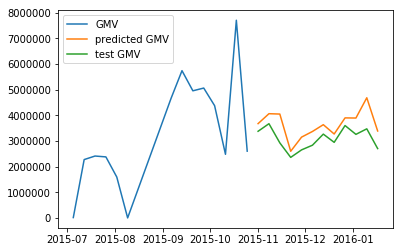

[629412.8943540585, 74475808959.22356]


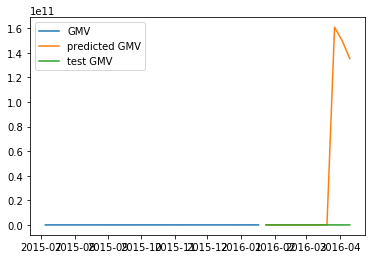

[629412.8943540585, 74475808959.22356, 1678150.6475560702]


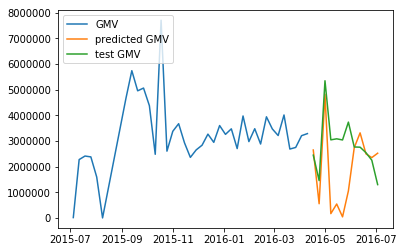

RMSE: 24826038840.921818


In [198]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from numpy import sqrt
tscv = TimeSeriesSplit(n_splits = 3)
rmse = []

for train_index, test_index in tscv.split(X):
    cv_train, cv_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    scaler_new=StandardScaler()
    cv_train[col_rfe]=scaler_new.fit_transform(cv_train[col_rfe])
    cv_test[col_rfe]=scaler_new.transform(cv_test[col_rfe])
    #print(cv_train)
    cv_train = sm.add_constant(cv_train)
    cv_test=sm.add_constant(cv_test, prepend=True, has_constant='add')
    
    model = sm.OLS(y_train,cv_train).fit()
    predictions = model.predict(cv_test)
    true_values = y_test.values
    rmse.append(sqrt(mean_squared_error(true_values, predictions)))
    print(rmse)
    plt.plot(y_train.index,y_train, '-', label="GMV")
    plt.plot(y_test.index,predictions,'-',label="predicted GMV")
    plt.plot(y_test.index, y_test,'-',label="test GMV")
    plt.legend(loc='upper left')
    plt.show()
print("RMSE: {}".format(np.mean(rmse)))

In [199]:
#### Test validation on Model 
test[cols_orig] = scaler.transform(test[cols_orig])
test_new=test[col_rfe]
test_new=sm.add_constant(test_new, prepend=True, has_constant='add')
test_new

,const,Lens,Snow_WK,Flash,SEM
Week,,,,,
2016-03-27,1.0,-0.529173,-0.454859,-0.227451,-0.473557
2016-04-03,1.0,-0.007624,-0.454859,-0.452136,-0.515644
2016-04-10,1.0,0.222828,-0.454859,-0.406468,-0.571761
2016-04-17,1.0,0.131860,-0.454859,-0.744408,-0.571761
2016-04-24,1.0,-1.384271,-0.454859,-0.932559,-0.571761
2016-05-01,1.0,1.781410,-0.454859,-0.450309,-0.528823
2016-05-08,1.0,0.283473,-0.454859,-0.757195,-0.271198
2016-05-15,1.0,0.695861,-0.454859,-0.771809,-0.271198
2016-05-22,1.0,0.592764,-0.454859,-0.905158,-0.271198


In [200]:
y_pred=camera_linear_m19.predict(test_new)
test_lr_reg=test.copy()
test_lr_reg['predicted_gmv']=y_pred

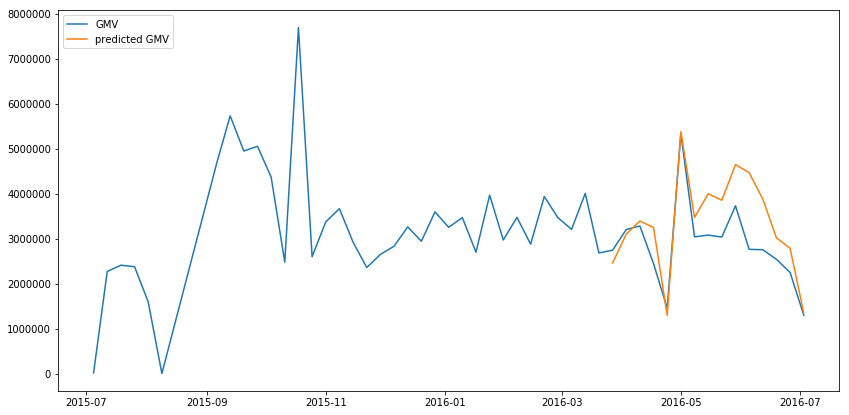

In [201]:
plt.figure(figsize=(14,7))
plt.plot(camera_final.index,camera_final.gmv, '-', label="GMV")
plt.plot(test.index,test_lr_reg.predicted_gmv,'-',label="predicted GMV")
#plt.plot(train.index, y_train_pred,'-',label="gmv_train_predicted")
plt.legend(loc='upper left')
plt.show()

In [202]:
from numpy import sqrt
from sklearn.metrics import mean_squared_error
camera_lr_reg_RMSE=sqrt(mean_squared_error(test.gmv,test_lr_reg.predicted_gmv))
camera_lr_reg_RMSE

731285.7843490915

#### <div id=20></div>Summary:
Model Adj-2 : 0.916 <br>
K-Fold Timeseries split : Mean RMSE : 617423 <br>
Test RMSE : 731285<br>

### <div id=26></div>Model Building - Multiplicative Model

In [203]:
camera_log=camera_final.copy()
cols_orig=['Telescope','Strap','Softbox','ReflectorUmbrella','Lens','FlashShoeAdapter','Flash','deliverybdays','deliverycdays','Prepaid','sla','product_procurement_sla','payday','saleday','discount_per','CameraAccessory','CameraBag','CameraBattery','CameraMount','Filter','ExtensionTube','CameraTripod','CameraRemoteControl','CameraMicrophone','CameraLEDLight','CameraHousing','CameraFilmRolls','CameraEyeCup','CameraBatteryGrip','CameraBatteryCharger','listprice','Holiday','Hot_WK','Snow_WK','Rain','Precipitation','NPS','Stock','Total_Investment','TV','Digital','Sponsorship','Content_Marketing','Online_marketing','Affiliates','SEM','Radio','Other']

In [204]:
### Convert 0 & Negative values to non-zero value
camera_log=camera_log.apply(lambda x : [abs(i)+0.0001 if i <= 0 else i for i in x])
camera_log

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other
Week,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-07-05,0.0001,0.0001,0.0001,0.0001,1.0000,0.0001,0.0001,1.608400e+04,0.470588,0.500000,18.0,3.264706,1.323529,0.0001,0.0001,39.804973,0.0001,1.0000,0.0001,0.0001,0.0001,0.0001,13.0,1.0000,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,1.0000,8.042000e+03,1.0000,1.0000,0.0001,0.0001,0.0001,54.599588,1177.000000,3.997134e+06,5.044631e+04,5.934197e+05,1.736972e+06,2.185538e+02,3.109469e+05,1.282075e+05,1.176923e+06,0.000100,1.000000e-04
2015-07-12,16.0000,13.0000,0.0001,0.0001,260.0000,0.0001,19.0000,2.274396e+06,0.000100,0.000100,758.0,7.099222,2.737721,0.0001,0.0001,42.014021,33.0000,205.0000,551.0000,4.0000,167.0000,0.0001,443.0,85.0000,0.0001,0.0001,0.0001,0.0001,0.0001,12.0000,196.0000,3.713382e+05,2.0000,1.0000,0.0001,1.0000,1.0000,54.599588,1177.000000,5.595987e+06,7.062483e+04,8.307876e+05,2.431761e+06,3.059753e+02,4.353256e+05,1.794904e+05,1.647692e+06,0.000100,1.000000e-04
2015-07-19,22.0000,24.0000,0.0001,0.0001,313.0000,0.0001,23.0000,2.412128e+06,0.000100,0.000100,848.0,6.469560,2.754690,1.0000,2.0000,43.396963,20.0000,254.0000,622.0000,11.0000,134.0000,0.0001,491.0,99.0000,0.0001,0.0001,0.0001,0.0001,0.0001,5.0000,196.0000,3.388427e+05,2.0000,1.0000,0.0001,1.0000,1.0000,54.599588,1177.000000,5.595987e+06,7.062483e+04,8.307876e+05,2.431761e+06,3.059753e+02,4.353256e+05,1.794904e+05,1.647692e+06,0.000100,1.000000e-04
2015-07-26,31.0000,23.0000,0.0001,0.0001,382.0000,0.0001,24.0000,2.378641e+06,0.005510,0.006297,801.0,6.410917,2.832621,0.0001,0.0001,43.083996,27.0000,221.0000,623.0000,7.0000,154.0000,0.0001,463.0,66.0000,0.0001,0.0001,0.0001,0.0001,0.0001,9.0000,242.0000,3.330709e+05,2.0000,1.0000,0.0001,1.0000,1.0000,54.599588,1177.000000,5.595987e+06,7.062483e+04,8.307876e+05,2.431761e+06,3.059753e+02,4.353256e+05,1.794904e+05,1.647692e+06,0.000100,1.000000e-04
2015-08-02,13.0000,23.0000,0.0001,0.0001,202.0000,0.0001,27.0000,1.595257e+06,0.000100,0.000100,492.0,6.419474,2.776306,0.0001,0.0001,42.183558,20.0000,130.0000,414.0000,2.0000,90.0000,0.0001,354.0,52.0000,0.0001,0.0001,0.0001,0.0001,0.0001,9.0000,159.0000,3.122634e+05,0.0001,1.0000,0.0001,1.0000,1.0000,56.138878,1185.285714,4.471708e+06,5.104962e+04,7.131876e+05,1.836617e+06,2.191465e+02,3.230583e+05,1.351124e+05,1.412465e+06,0.000100,1.000000e-04
2015-08-09,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,2.646000e+03,0.000100,0.000100,3.0,9.333333,4.000000,0.0001,0.0001,17.264368,0.0001,0.0001,3.0000,0.0001,0.0001,0.0001,2.0,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,8.820000e+02,2.0000,1.0000,0.0001,1.0000,1.0000,59.987101,1206.000000,1.661011e+06,2.111584e+03,4.191876e+05,3.487557e+05,2.074541e+00,4.239003e+04,2.416716e+04,8.243966e+05,0.000100,1.000000e-04
2015-09-06,68.0000,28.0000,0.0001,0.0001,538.0000,0.0001,366.0000,4.664064e+06,0.000100,0.000100,1464.0,6.078215,2.807380,1.0000,0.0001,41.947956,50.0000,338.0000,1100.0000,38.0000,290.0000,0.0001,1114.0,180.0000,0.0001,0.0001,0.0001,28.0000,0.0001,14.0000,278.0000,6.497640e+05,2.0000,1.0000,0.0001,1.0000,1.0000,48.791373,1116.000000,2.819918e+07,1.127297e+06,4.539552e+05,1.828963e+07,1.772901e+05,4.764443e+06,1.467069e+06,1.919495e+06,0.000100,1.000000e-04
2015-09-13,52.0000,44.0000,0.0001,0.0001,635.0000,0.0001,410.0000,5.735555e+06,0.001035,0.001183,1876.0,6.246679,2.916385,0.0001,0.0001,43.917456,52.0000,404.0000,1187.0000,24.0000,432.0000,0.0001,1584.0,284.0000,0.0001,0.0001,0.0001,12.0000,0.

In [205]:
### Apply log transformation 
camera_log=camera_log.apply(lambda X: np.log(X) , axis=1)
camera_log

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other
Week,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-07-05,-9.210340,-9.210340,-9.210340,-9.210340,0.000000,-9.21034,-9.210340,9.685580,-0.753772,-0.693147,2.890372,1.183170,0.280302,-9.21034,-9.210340,3.683992,-9.210340,0.000000,-9.210340,-9.210340,-9.210340,-9.210340,2.564949,0.000000,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,-9.210340,0.000000,8.992433,0.000000,0.00000,-9.21034,-9.21034,-9.21034,4.000026,7.070724,15.201088,10.828665,13.293657,14.367654,5.387032,12.647377,11.761405,13.978414,-9.210340,-9.210340
2015-07-12,2.772589,2.564949,-9.210340,-9.210340,5.560682,-9.21034,2.944439,14.637225,-9.210340,-9.210340,6.630683,1.959985,1.007126,-9.21034,-9.210340,3.738003,3.496508,5.323010,6.311735,1.386294,5.117994,-9.210340,6.093570,4.442651,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,2.484907,5.278115,12.824868,0.693147,0.00000,-9.21034,0.00000,0.00000,4.000026,7.070724,15.537560,11.165137,13.630129,14.704126,5.723505,12.983850,12.097877,14.314886,-9.210340,-9.210340
2015-07-19,3.091042,3.178054,-9.210340,-9.210340,5.746203,-9.21034,3.135494,14.696020,-9.210340,-9.210340,6.742881,1.867108,1.013305,0.00000,0.693147,3.770389,2.995732,5.537334,6.432940,2.397895,4.897840,-9.210340,6.196444,4.595120,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,1.609438,5.278115,12.733291,0.693147,0.00000,-9.21034,0.00000,0.00000,4.000026,7.070724,15.537560,11.165137,13.630129,14.704126,5.723505,12.983850,12.097877,14.314886,-9.210340,-9.210340
2015-07-26,3.433987,3.135494,-9.210340,-9.210340,5.945421,-9.21034,3.178054,14.682040,-5.201256,-5.067724,6.685861,1.858002,1.041202,-9.21034,-9.210340,3.763152,3.295837,5.398163,6.434547,1.945910,5.036953,-9.210340,6.137727,4.189655,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,2.197225,5.488938,12.716111,0.693147,0.00000,-9.21034,0.00000,0.00000,4.000026,7.070724,15.537560,11.165137,13.630129,14.704126,5.723505,12.983850,12.097877,14.314886,-9.210340,-9.210340
2015-08-02,2.564949,3.135494,-9.210340,-9.210340,5.308268,-9.21034,3.295837,14.282545,-9.210340,-9.210340,6.198479,1.859336,1.021121,-9.21034,-9.210340,3.742031,2.995732,4.867534,6.025866,0.693147,4.499810,-9.210340,5.869297,3.951244,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,2.197225,5.068904,12.651602,-9.210340,0.00000,-9.21034,0.00000,0.00000,4.027829,7.077739,15.313281,10.840553,13.477500,14.423436,5.389741,12.685588,11.813862,14.160847,-9.210340,-9.210340
2015-08-09,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.21034,-9.210340,7.880804,-9.210340,-9.210340,1.098612,2.233592,1.386294,-9.21034,-9.210340,2.848645,-9.210340,-9.210340,1.098612,-9.210340,-9.210340,-9.210340,0.693147,-9.210340,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,6.782192,0.693147,0.00000,-9.21034,0.00000,0.00000,4.094130,7.095064,14.322937,7.655194,12.946074,12.762127,0.729740,10.654669,10.092750,13.622407,-9.210340,-9.210340
2015-09-06,4.219508,3.332205,-9.210340,-9.210340,6.287859,-9.21034,5.902633,15.355398,-9.210340,-9.210340,7.288928,1.804711,1.032252,0.00000,-9.210340,3.736430,3.912023,5.823046,7.003065,3.637586,5.669881,-9.210340,7.015712,5.192957,-9.210340,-9.21034,-9.210340,3.332205,-9.210340,2.639057,5.627621,13.384364,0.693147,0.00000,-9.21034,0.00000,0.00000,3.887554,7.017506,17.154804,13.935334,13.025754,16.721845,12.085543,15.376691,14.198777,14.467573,-9.210340,-9.210340
2015-09-13,3.951244,3.784190,-9.210340,-9.210340,6.453625,-9.21034,6.016157,15.562195,-6.87

In [206]:
# creating the train and validation set from orignial data set
train = camera_log[:int(0.7*(len(camera_log)))]
test = camera_log[int(0.7*(len(camera_log))):]

In [207]:
# Feature selection using RFE
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE

X=train.copy()
X=X.drop('gmv',axis=1)
Y=train['gmv']
estimator_lr=LinearRegression()
rfe = RFE(estimator_lr, 15)             
rfe = rfe.fit(X,Y)

In [208]:
col_rfe = X.columns[rfe.support_]
col_rfe

Index(['Strap', 'Lens', 'deliverybdays', 'deliverycdays', 'sla',
       'product_procurement_sla', 'CameraAccessory', 'CameraBattery',
       'listprice', 'Total_Investment', 'TV', 'Sponsorship',
       'Content_Marketing', 'Online_marketing', 'Affiliates'],
      dtype='object')

In [209]:
# Build model using the features identified by RFE
import statsmodels.api as sm
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

Strap               0.82087
Online_marketing    0.49561
CameraAccessory     0.21658
Sponsorship         0.20784
Affiliates          0.18437
deliverycdays       0.10480
deliverybdays       0.10137
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     4694.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.22e-30
Time:                        21:43:43   Log-Likelihood:                 80.199
No. Observations:                  35   AIC:                            -128.4
Df Residuals:                      19   BIC:                            -103.5
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -9.9444      2.854     -3.485      0.002     -15.917      -3.972
Strap                       0.0073      0.032      0.230      0.821      -0.059       0.074
Lens                        0.0883      0.033      2.657      0.016       0.019       0.158
deliverybdays               0.2453      0.142      1.722      0.101      -0.053       0.544
deliverycdays              -0.2329      0.137     -1.703      0.105      -0.519       0.053
sla                        -0.3938      0.166     -2.376      0.028      -0.741      -0.047
product_procurement_sla    -0.5030      0.194     -2.594      0.018      -0.909      -0.097
CameraAccessory            -0.0339      0.027     -1.278      0.217      -0.089       0.022
CameraBattery               0.1210      0.031      3.882      0.001       0.056       0.186
listprice                   0.8968      0.050     17.874      0.000       0.792       1.002
Total_Investment            0.7877      0.169      4.648      0.000       0.433       1.142
TV                         -0.4706      0.107     -4.411      0.000      -0.694      -0.247
Sponsorship                -0.0305      0.023     -1.304      0.208      -0.079       0.018
Content_Marketing          -0.1965      0.060     -3.264      0.004      -0.323      -0.071
Online_marketing           -0.6502      0.936     -0.695      0.496      -2.609       1.308
Affiliates                  1.3522      0.982      1.378      0.184      -0.702       3.407
==============================================================================
Omnibus:                        5.115   Durbin-Watson:                   2.196
Prob(Omnibus):                  0.078   Jarque-Bera (JB):                5.291
Skew:                           0.220   Prob(JB):                       0.0710
Kurtosis:                       4.853   Cond. No.                     2.07e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.07e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [210]:
# Drop columns with high VIF-value/p-value
X.drop('Strap', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

Online_marketing    0.44007
Sponsorship         0.20326
CameraAccessory     0.20239
Affiliates          0.15689
deliverycdays       0.09579
deliverybdays       0.09227
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     5279.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.68e-32
Time:                        21:43:43   Log-Likelihood:                 80.150
No. Observations:                  35   AIC:                            -130.3
Df Residuals:                      20   BIC:                            -107.0
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -9.6316      2.447     -3.936      0.001     -14.736      -4.527
Lens                        0.0937      0.023      4.053      0.001       0.045       0.142
deliverybdays               0.2362      0.134      1.768      0.092      -0.042       0.515
deliverycdays              -0.2243      0.128     -1.748      0.096      -0.492       0.043
sla                        -0.3885      0.160     -2.425      0.025      -0.723      -0.054
product_procurement_sla    -0.5010      0.189     -2.650      0.015      -0.895      -0.107
CameraAccessory            -0.0316      0.024     -1.318      0.202      -0.082       0.018
CameraBattery               0.1242      0.027      4.555      0.000       0.067       0.181
listprice                   0.8903      0.041     21.962      0.000       0.806       0.975
Total_Investment            0.7726      0.152      5.069      0.000       0.455       1.091
TV                         -0.4624      0.098     -4.712      0.000      -0.667      -0.258
Sponsorship                -0.0294      0.022     -1.315      0.203      -0.076       0.017
Content_Marketing          -0.1899      0.051     -3.690      0.001      -0.297      -0.083
Online_marketing           -0.6999      0.889     -0.788      0.440      -2.553       1.153
Affiliates                  1.3897      0.945      1.471      0.157      -0.581       3.360
==============================================================================
Omnibus:                        4.101   Durbin-Watson:                   2.179
Prob(Omnibus):                  0.129   Jarque-Bera (JB):                3.495
Skew:                           0.196   Prob(JB):                        0.174
Kurtosis:                       4.497   Cond. No.                     1.82e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.82e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [211]:
# Drop columns with high VIF-value/p-value
X.drop('Online_marketing', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

CameraAccessory    0.10419
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     5790.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.90e-34
Time:                        21:43:43   Log-Likelihood:                 79.616
No. Observations:                  35   AIC:                            -131.2
Df Residuals:                      21   BIC:                            -109.5
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -9.3415      2.397     -3.897      0.001     -14.327      -4.356
Lens                        0.0828      0.018      4.514      0.000       0.045       0.121
deliverybdays               0.2768      0.122      2.267      0.034       0.023       0.531
deliverycdays              -0.2620      0.118     -2.222      0.037      -0.507      -0.017
sla                        -0.3850      0.159     -2.426      0.024      -0.715      -0.055
product_procurement_sla    -0.5639      0.170     -3.320      0.003      -0.917      -0.211
CameraAccessory            -0.0380      0.022     -1.698      0.104      -0.084       0.009
CameraBattery               0.1375      0.021      6.484      0.000       0.093       0.182
listprice                   0.8955      0.040     22.592      0.000       0.813       0.978
Total_Investment            0.7372      0.144      5.108      0.000       0.437       1.037
TV                         -0.4238      0.084     -5.029      0.000      -0.599      -0.249
Sponsorship                -0.0436      0.013     -3.348      0.003      -0.071      -0.017
Content_Marketing          -0.2101      0.044     -4.757      0.000      -0.302      -0.118
Affiliates                  0.6523      0.127      5.140      0.000       0.388       0.916
==============================================================================
Omnibus:                        1.993   Durbin-Watson:                   2.162
Prob(Omnibus):                  0.369   Jarque-Bera (JB):                0.948
Skew:                          -0.122   Prob(JB):                        0.623
Kurtosis:                       3.768   Cond. No.                     1.66e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.66e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [212]:
# Drop columns with high VIF-value/p-value
X.drop('CameraAccessory', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

deliverycdays    0.12793
deliverybdays    0.11725
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     5777.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.43e-35
Time:                        21:43:43   Log-Likelihood:                 77.363
No. Observations:                  35   AIC:                            -128.7
Df Residuals:                      22   BIC:                            -108.5
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -8.5382      2.449     -3.487      0.002     -13.617      -3.460
Lens                        0.0663      0.016      4.090      0.000       0.033       0.100
deliverybdays               0.1869      0.115      1.630      0.117      -0.051       0.425
deliverycdays              -0.1752      0.111     -1.582      0.128      -0.405       0.054
sla                        -0.3538      0.164     -2.154      0.042      -0.694      -0.013
product_procurement_sla    -0.4673      0.167     -2.802      0.010      -0.813      -0.121
CameraBattery               0.1099      0.014      7.744      0.000       0.080       0.139
listprice                   0.8813      0.040     21.827      0.000       0.798       0.965
Total_Investment            0.6808      0.146      4.652      0.000       0.377       0.984
TV                         -0.3936      0.086     -4.586      0.000      -0.572      -0.216
Sponsorship                -0.0357      0.013     -2.816      0.010      -0.062      -0.009
Content_Marketing          -0.2012      0.046     -4.403      0.000      -0.296      -0.106
Affiliates                  0.6282      0.131      4.781      0.000       0.356       0.901
==============================================================================
Omnibus:                        3.982   Durbin-Watson:                   2.338
Prob(Omnibus):                  0.137   Jarque-Bera (JB):                3.098
Skew:                          -0.273   Prob(JB):                        0.212
Kurtosis:                       4.351   Cond. No.                     1.62e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.62e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [213]:
# Drop columns with high VIF-value/p-value
X.drop('deliverycdays', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

deliverybdays    0.12671
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     5916.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.87e-37
Time:                        21:43:43   Log-Likelihood:                 75.478
No. Observations:                  35   AIC:                            -127.0
Df Residuals:                      23   BIC:                            -108.3
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -6.9700      2.311     -3.016      0.006     -11.751      -2.189
Lens                        0.0656      0.017      3.924      0.001       0.031       0.100
deliverybdays               0.0056      0.004      1.585      0.127      -0.002       0.013
sla                        -0.3756      0.169     -2.224      0.036      -0.725      -0.026
product_procurement_sla    -0.4554      0.172     -2.648      0.014      -0.811      -0.100
CameraBattery               0.1120      0.015      7.676      0.000       0.082       0.142
listprice                   0.8712      0.041     21.173      0.000       0.786       0.956
Total_Investment            0.5996      0.141      4.239      0.000       0.307       0.892
TV                         -0.3427      0.082     -4.173      0.000      -0.513      -0.173
Sponsorship                -0.0318      0.013     -2.477      0.021      -0.058      -0.005
Content_Marketing          -0.1751      0.044     -3.981      0.001      -0.266      -0.084
Affiliates                  0.5461      0.125      4.383      0.000       0.288       0.804
==============================================================================
Omnibus:                        9.265   Durbin-Watson:                   2.129
Prob(Omnibus):                  0.010   Jarque-Bera (JB):               10.362
Skew:                          -0.718   Prob(JB):                      0.00562
Kurtosis:                       5.245   Cond. No.                     1.45e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.45e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [214]:
# Drop columns with high VIF-value/p-value
X.drop('deliverybdays', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

sla    0.05804
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     6122.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.38e-38
Time:                        21:43:43   Log-Likelihood:                 73.664
No. Observations:                  35   AIC:                            -125.3
Df Residuals:                      24   BIC:                            -108.2
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -6.4627      2.360     -2.739      0.011     -11.333      -1.592
Lens                        0.0625      0.017      3.650      0.001       0.027       0.098
sla                        -0.3443      0.173     -1.991      0.058      -0.701       0.013
product_procurement_sla    -0.4734      0.177     -2.676      0.013      -0.838      -0.108
CameraBattery               0.1098      0.015      7.332      0.000       0.079       0.141
listprice                   0.8744      0.042     20.638      0.000       0.787       0.962
Total_Investment            0.5552      0.143      3.884      0.001       0.260       0.850
TV                         -0.3064      0.081     -3.768      0.001      -0.474      -0.139
Sponsorship                -0.0284      0.013     -2.177      0.040      -0.055      -0.001
Content_Marketing          -0.1678      0.045     -3.722      0.001      -0.261      -0.075
Affiliates                  0.5121      0.127      4.047      0.000       0.251       0.773
==============================================================================
Omnibus:                       11.348   Durbin-Watson:                   2.112
Prob(Omnibus):                  0.003   Jarque-Bera (JB):               14.549
Skew:                          -0.827   Prob(JB):                     0.000693
Kurtosis:                       5.690   Cond. No.                     1.41e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.41e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [215]:
# Drop columns with high VIF-value/p-value
X.drop('sla', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

Sponsorship    0.19969
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     6081.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.84e-39
Time:                        21:43:43   Log-Likelihood:                 70.990
No. Observations:                  35   AIC:                            -122.0
Df Residuals:                      25   BIC:                            -106.4
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -5.2636      2.413     -2.181      0.039     -10.233      -0.294
Lens                        0.0693      0.018      3.906      0.001       0.033       0.106
product_procurement_sla    -0.4038      0.183     -2.202      0.037      -0.781      -0.026
CameraBattery               0.0876      0.011      8.266      0.000       0.066       0.109
listprice                   0.8860      0.044     19.962      0.000       0.795       0.977
Total_Investment            0.4276      0.135      3.164      0.004       0.149       0.706
TV                         -0.2433      0.079     -3.072      0.005      -0.406      -0.080
Sponsorship                -0.0160      0.012     -1.317      0.200      -0.041       0.009
Content_Marketing          -0.1332      0.044     -3.027      0.006      -0.224      -0.043
Affiliates                  0.4233      0.125      3.380      0.002       0.165       0.681
==============================================================================
Omnibus:                        9.469   Durbin-Watson:                   2.254
Prob(Omnibus):                  0.009   Jarque-Bera (JB):               15.111
Skew:                          -0.487   Prob(JB):                     0.000523
Kurtosis:                       6.068   Cond. No.                     1.36e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.36e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [216]:
# Drop columns with high VIF-value/p-value
X.drop('Sponsorship', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

const                      0.07872
product_procurement_sla    0.05827
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     6653.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.01e-41
Time:                        21:43:43   Log-Likelihood:                 69.816
No. Observations:                  35   AIC:                            -121.6
Df Residuals:                      26   BIC:                            -107.6
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                      -4.2394      2.316     -1.830      0.079      -9.001       0.522
Lens                        0.0709      0.018      3.951      0.001       0.034       0.108
product_procurement_sla    -0.3631      0.183     -1.981      0.058      -0.740       0.014
CameraBattery               0.0880      0.011      8.195      0.000       0.066       0.110
listprice                   0.8767      0.044     19.731      0.000       0.785       0.968
Total_Investment            0.3517      0.124      2.837      0.009       0.097       0.606
TV                         -0.2216      0.079     -2.821      0.009      -0.383      -0.060
Content_Marketing          -0.1158      0.043     -2.721      0.011      -0.203      -0.028
Affiliates                  0.3936      0.125      3.151      0.004       0.137       0.650
==============================================================================
Omnibus:                        9.761   Durbin-Watson:                   2.105
Prob(Omnibus):                  0.008   Jarque-Bera (JB):               16.096
Skew:                          -0.495   Prob(JB):                     0.000320
Kurtosis:                       6.171   Cond. No.                     1.16e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.16e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [217]:
# Drop columns with high VIF-value/p-value
X.drop('product_procurement_sla', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

const                0.48618
Content_Marketing    0.08577
TV                   0.06554
Total_Investment     0.06422
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     6860.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.60e-42
Time:                        21:43:43   Log-Likelihood:                 67.356
No. Observations:                  35   AIC:                            -118.7
Df Residuals:                      27   BIC:                            -106.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -1.3322      1.887     -0.706      0.486      -5.204       2.539
Lens                  0.0807      0.018      4.451      0.000       0.044       0.118
CameraBattery         0.0723      0.008      9.505      0.000       0.057       0.088
listprice             0.8683      0.047     18.648      0.000       0.773       0.964
Total_Investment      0.1804      0.094      1.930      0.064      -0.011       0.372
TV                   -0.1218      0.063     -1.920      0.066      -0.252       0.008
Content_Marketing    -0.0593      0.033     -1.783      0.086      -0.127       0.009
Affiliates            0.2354      0.101      2.328      0.028       0.028       0.443
==============================================================================
Omnibus:                       19.446   Durbin-Watson:                   2.090
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               55.513
Skew:                          -1.003   Prob(JB):                     8.82e-13
Kurtosis:                       8.834   Cond. No.                     8.95e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.95e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [218]:
# Drop columns with high VIF-value/p-value
X.drop('Content_Marketing', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

TV                  0.47709
Total_Investment    0.46777
Affiliates          0.05090
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     7424.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.79e-43
Time:                        21:43:43   Log-Likelihood:                 65.407
No. Observations:                  35   AIC:                            -116.8
Df Residuals:                      28   BIC:                            -105.9
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                1.9364      0.465      4.164      0.000       0.984       2.889
Lens                 0.0763      0.019      4.090      0.000       0.038       0.114
CameraBattery        0.0806      0.006     12.887      0.000       0.068       0.093
listprice            0.8542      0.048     17.931      0.000       0.757       0.952
Total_Investment     0.0212      0.029      0.736      0.468      -0.038       0.080
TV                  -0.0236      0.033     -0.721      0.477      -0.091       0.043
Affiliates           0.0630      0.031      2.040      0.051      -0.000       0.126
==============================================================================
Omnibus:                       31.674   Durbin-Watson:                   2.334
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              157.201
Skew:                          -1.616   Prob(JB):                     7.32e-35
Kurtosis:                      12.867   Cond. No.                     1.99e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.99e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [219]:
# Drop columns with high VIF-value/p-value
X.drop('TV', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

Total_Investment    0.75367
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                     9059.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.29e-45
Time:                        21:43:44   Log-Likelihood:                 65.086
No. Observations:                  35   AIC:                            -118.2
Df Residuals:                      29   BIC:                            -108.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                2.0562      0.431      4.774      0.000       1.175       2.937
Lens                 0.0709      0.017      4.180      0.000       0.036       0.106
CameraBattery        0.0805      0.006     12.989      0.000       0.068       0.093
listprice            0.8631      0.046     18.910      0.000       0.770       0.956
Total_Investment     0.0063      0.020      0.317      0.754      -0.034       0.047
Affiliates           0.0436      0.015      2.928      0.007       0.013       0.074
==============================================================================
Omnibus:                       31.146   Durbin-Watson:                   2.329
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              157.269
Skew:                          -1.564   Prob(JB):                     7.07e-35
Kurtosis:                      12.902   Cond. No.                     1.66e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.66e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [220]:
# Drop columns with high VIF-value/p-value
X.drop('Total_Investment', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

Series([], Name: P>|t|, dtype: float64)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 1.167e+04
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.08e-47
Time:                        21:43:44   Log-Likelihood:                 65.025
No. Observations:                  35   AIC:                            -120.1
Df Residuals:                      30   BIC:                            -112.3
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             2.0667      0.423      4.887      0.000       1.203       2.930
Lens              0.0694      0.016      4.326      0.000       0.037       0.102
CameraBattery     0.0801      0.006     13.391      0.000       0.068       0.092
listprice         0.8672      0.043     20.150      0.000       0.779       0.955
Affiliates        0.0473      0.009      5.262      0.000       0.029       0.066
==============================================================================
Omnibus:                       31.588   Durbin-Watson:                   2.324
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              161.586
Skew:                          -1.590   Prob(JB):                     8.17e-36
Kurtosis:                      13.034   Cond. No.                     1.29e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.29e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [221]:
# Check VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,3765.68
3,listprice,61.73
1,Lens,40.08
2,CameraBattery,5.74
4,Affiliates,2.23


In [222]:
# Drop columns with high VIF-value/p-value
X.drop('listprice', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_mul = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_mul.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_mul.summary()

Series([], Name: P>|t|, dtype: float64)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     1097.
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.55e-31
Time:                        21:43:44   Log-Likelihood:                 18.186
No. Observations:                  35   AIC:                            -28.37
Df Residuals:                      31   BIC:                            -22.15
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            10.2987      0.410     25.102      0.000       9.462      11.135
Lens              0.3824      0.015     25.269      0.000       0.352       0.413
CameraBattery     0.1812      0.012     14.774      0.000       0.156       0.206
Affiliates        0.0856      0.033      2.598      0.014       0.018       0.153
==============================================================================
Omnibus:                        4.337   Durbin-Watson:                   1.855
Prob(Omnibus):                  0.114   Jarque-Bera (JB):                3.168
Skew:                           0.719   Prob(JB):                        0.205
Kurtosis:                       3.325   Cond. No.                         262.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [223]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif


,Features,VIF
0,const,251.96
1,Lens,2.53
3,Affiliates,2.13
2,CameraBattery,1.71


Now all VIF and p-values are in control. 

In [224]:
# Get fields
cols=list(dict(camera_mul.params).keys())
cols.pop(0)
print(cols)

['Lens', 'CameraBattery', 'Affiliates']


[761426.1181213564]


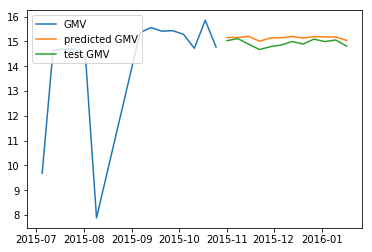

[761426.1181213564, 313720.8481827061]


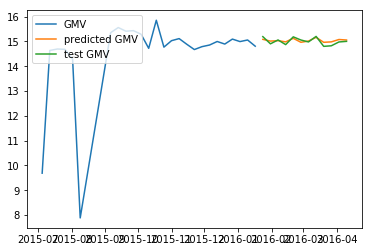

[761426.1181213564, 313720.8481827061, 614193.0943101486]


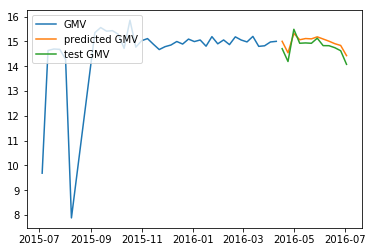

RMSE: 563113.3535380703


In [225]:
### Validation using K-fold timeseries using split.
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from numpy import sqrt
X = camera_log.copy()
X=X[cols]
y=camera_log['gmv']

tscv = TimeSeriesSplit(n_splits = 3)
rmse = []

for train_index, test_index in tscv.split(X):
    cv_train, cv_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    cv_train = sm.add_constant(cv_train)
    cv_test=sm.add_constant(cv_test, prepend=True, has_constant='add')
    model = sm.OLS(y_train,cv_train).fit()
    predictions = model.predict(cv_test)
    true_values = y_test.values
    rmse.append(sqrt(mean_squared_error(np.exp(true_values), np.exp(predictions))))
    print(rmse)
    plt.plot(y_train.index,y_train, '-', label="GMV")
    plt.plot(y_test.index,predictions,'-',label="predicted GMV")
    plt.plot(y_test.index, y_test,'-',label="test GMV")
    plt.legend(loc='upper left')
    plt.show()
print("RMSE: {}".format(np.mean(rmse)))

In [226]:
### Validation of Test data on model 
test_new=test[cols]
test_new=sm.add_constant(test_new, prepend=True, has_constant='add')
test_new

,const,Lens,CameraBattery,Affiliates
Week,,,,
2016-03-27,1.0,5.783825,6.770789,14.528114
2016-04-03,1.0,6.018593,6.815640,14.504793
2016-04-10,1.0,6.107023,6.529419,14.472827
2016-04-17,1.0,6.073045,6.376727,14.472827
2016-04-24,1.0,5.214936,5.634790,14.472827
2016-05-01,1.0,6.559615,7.095893,14.494844
2016-05-08,1.0,6.129050,6.538140,14.617642
2016-05-15,1.0,6.267201,6.519147,14.617642
2016-05-22,1.0,6.234411,6.513230,14.617642


In [227]:
y_pred=camera_mul.predict(test_new)
test_lr_reg=test.copy()
test_lr_reg['predicted_gmv']=np.exp(y_pred)

In [228]:
test['ActualGMV']=np.exp(test.gmv)

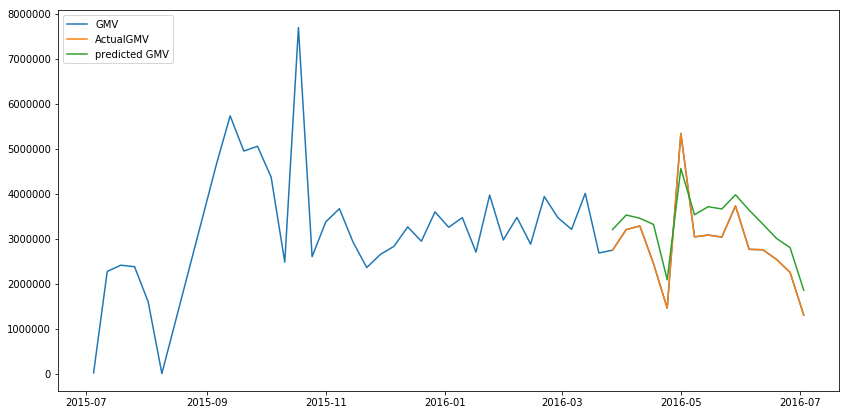

In [229]:
plt.figure(figsize=(14,7))
plt.plot(camera_final.index,camera_final.gmv, '-', label="GMV")
#plt.plot(test_new.index,test_lr_reg.predicted_gmv, '-',label="gmv predicted")
plt.plot(test.index, test.ActualGMV,'-',label="ActualGMV")
plt.plot(test.index,test_lr_reg.predicted_gmv,'-',label="predicted GMV")
#plt.plot(train.index, y_train_pred,'-',label="gmv_train_predicted")
plt.legend(loc='upper left')
plt.show()

In [230]:
from numpy import sqrt
from sklearn.metrics import mean_squared_error
camera_lr_reg_RMSE=sqrt(mean_squared_error(test.ActualGMV,test_lr_reg.predicted_gmv))
camera_lr_reg_RMSE

584662.0170004673

#### <div id=27></div>Model Summary: <br>
Model Adj-R2 : 0.990<br>
K-fold mean RMSE : 761426<br>
Test data RMSE : 584662<br>
Features : Lens, CameraBattery, Affiliates are the significant features

### <div id=100></div>Model Building-Distribution Model

In [231]:
camera_lag=camera_final.copy()
cols_orig=['Telescope','Strap','Softbox','ReflectorUmbrella','Lens','FlashShoeAdapter','Flash','deliverybdays','deliverycdays','Prepaid','sla','product_procurement_sla','payday','saleday','discount_per','CameraAccessory','CameraBag','CameraBattery','CameraMount','Filter','ExtensionTube','CameraTripod','CameraRemoteControl','CameraMicrophone','CameraLEDLight','CameraHousing','CameraFilmRolls','CameraEyeCup','CameraBatteryGrip','CameraBatteryCharger','listprice','Holiday','Hot_WK','Snow_WK','Rain','Precipitation','NPS','Stock','Total_Investment','TV','Digital','Sponsorship','Content_Marketing','Online_marketing','Affiliates','SEM','Radio','Other']

In [232]:
### Function to create lag attributes 
def lag_attributes (df,lag=2):
    new_dict={}
    for col_name in df:
        new_dict[col_name]=df[col_name]
        for l in range(1,lag+1):
            new_dict['%s_lag%d' %(col_name,l)]=df[col_name].shift(l)
    result=pd.DataFrame(new_dict,index=df.index)
    return result.dropna()

In [233]:
### Create lag attributes upto 2 levels
camera_lag=lag_attributes(camera_lag)

In [234]:
#creating the train and validation set from orignial data set
train = camera_lag[:int(0.7*(len(camera_lag)))]
test = camera_lag[int(0.7*(len(camera_lag))):]

In [235]:
#Feature selection using rFE
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE

X=train.copy()
X=X.drop('gmv',axis=1)
Y=train['gmv']
estimator_lr=LinearRegression()
rfe = RFE(estimator_lr, 15)             
rfe = rfe.fit(X,Y)

In [236]:
col_rfe = X.columns[rfe.support_]
col_rfe

Index(['Flash', 'Flash_lag2', 'Prepaid', 'Prepaid_lag1', 'Prepaid_lag2',
       'CameraBag', 'CameraBag_lag1', 'CameraBag_lag2', 'CameraBattery',
       'CameraBattery_lag1', 'Filter_lag2', 'CameraTripod',
       'CameraTripod_lag2', 'CameraRemoteControl_lag2',
       'CameraBatteryCharger'],
      dtype='object')

In [237]:
# Build the model
X=train[col_rfe]

X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

const                       0.89577
Filter_lag2                 0.73733
CameraBag_lag1              0.41464
Prepaid_lag1                0.29364
CameraRemoteControl_lag2    0.19922
CameraBatteryCharger        0.17360
CameraTripod_lag2           0.09088
CameraBattery_lag1          0.06081
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     170.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.67e-15
Time:                        21:43:46   Log-Likelihood:                -428.34
No. Observations:                  33   AIC:                             888.7
Df Residuals:                      17   BIC:                             912.6
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     1.839e+04   1.38e+05      0.133      0.896   -2.73e+05     3.1e+05
Flash                      475.8114     85.494      5.565      0.000     295.435     656.187
Flash_lag2                 169.8217     75.750      2.242      0.039      10.004     329.640
Prepaid                   1435.4682    391.123      3.670      0.002     610.270    2260.666
Prepaid_lag1               254.3406    234.701      1.084      0.294    -240.836     749.517
Prepaid_lag2             -1153.0886    367.745     -3.136      0.006   -1928.963    -377.214
CameraBag                 3295.4509    925.756      3.560      0.002    1342.276    5248.626
CameraBag_lag1             624.8945    747.300      0.836      0.415    -951.770    2201.559
CameraBag_lag2            2259.3273    831.077      2.719      0.015     505.908    4012.746
CameraBattery             1020.5811    461.868      2.210      0.041      46.125    1995.037
CameraBattery_lag1        -577.7988    287.754     -2.008      0.061   -1184.906      29.308
Filter_lag2                698.2263   2047.947      0.341      0.737   -3622.565    5019.018
CameraTripod               325.6330    100.902      3.227      0.005     112.748     538.518
CameraTripod_lag2          209.1083    116.661      1.792      0.091     -37.026     455.242
CameraRemoteControl_lag2  2129.0294   1593.828      1.336      0.199   -1233.654    5491.713
CameraBatteryCharger      -834.8355    587.793     -1.420      0.174   -2074.969     405.298
==============================================================================
Omnibus:                        3.108   Durbin-Watson:                   1.337
Prob(Omnibus):                  0.211   Jarque-Bera (JB):                1.788
Skew:                          -0.461   Prob(JB):                        0.409
Kurtosis:                       3.672   Cond. No.                     1.39e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.39e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [238]:
# Drop columns with high VIF-value/p-value
X.drop('Filter_lag2', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

const                       0.95554
CameraBag_lag1              0.41124
Prepaid_lag1                0.30138
CameraBatteryCharger        0.11907
CameraRemoteControl_lag2    0.06306
CameraTripod_lag2           0.05188
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     192.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.23e-16
Time:                        21:43:46   Log-Likelihood:                -428.45
No. Observations:                  33   AIC:                             886.9
Df Residuals:                      18   BIC:                             909.4
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     7413.3564   1.31e+05      0.057      0.956   -2.68e+05    2.83e+05
Flash                      490.6501     71.757      6.838      0.000     339.894     641.406
Flash_lag2                 176.7603     71.151      2.484      0.023      27.278     326.243
Prepaid                   1336.0513    254.190      5.256      0.000     802.018    1870.085
Prepaid_lag1               239.0129    224.629      1.064      0.301    -232.915     710.941
Prepaid_lag2             -1076.5916    284.123     -3.789      0.001   -1673.513    -479.670
CameraBag                 3423.1366    825.575      4.146      0.001    1688.668    5157.605
CameraBag_lag1             612.3008    727.833      0.841      0.411    -916.819    2141.421
CameraBag_lag2            2286.5522    806.668      2.835      0.011     591.805    3981.300
CameraBattery             1114.5618    361.379      3.084      0.006     355.333    1873.791
CameraBattery_lag1        -530.3638    245.621     -2.159      0.045   -1046.395     -14.332
CameraTripod               345.3671     80.595      4.285      0.000     176.044     514.691
CameraTripod_lag2          222.6668    106.948      2.082      0.052      -2.022     447.355
CameraRemoteControl_lag2  2456.6269   1240.013      1.981      0.063    -148.543    5061.797
CameraBatteryCharger      -894.9229    546.810     -1.637      0.119   -2043.728     253.882
==============================================================================
Omnibus:                        3.130   Durbin-Watson:                   1.334
Prob(Omnibus):                  0.209   Jarque-Bera (JB):                1.802
Skew:                          -0.415   Prob(JB):                        0.406
Kurtosis:                       3.788   Cond. No.                     1.35e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.35e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [239]:
# Drop columns with high VIF-value/p-value
X.drop('CameraBag_lag1', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

const                       0.76145
CameraBatteryCharger        0.11477
CameraRemoteControl_lag2    0.07760
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.993
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                     209.9
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.16e-17
Time:                        21:43:47   Log-Likelihood:                -429.09
No. Observations:                  33   AIC:                             886.2
Df Residuals:                      19   BIC:                             907.1
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     3.846e+04   1.25e+05      0.308      0.761   -2.23e+05       3e+05
Flash                      493.2867     71.135      6.935      0.000     344.399     642.174
Flash_lag2                 178.5582     70.570      2.530      0.020      30.854     326.262
Prepaid                   1300.5565    248.728      5.229      0.000     779.962    1821.151
Prepaid_lag1               388.3920    136.520      2.845      0.010     102.651     674.133
Prepaid_lag2             -1062.5976    281.446     -3.775      0.001   -1651.671    -473.524
CameraBag                 3466.1393    817.629      4.239      0.000    1754.823    5177.456
CameraBag_lag2            2285.0212    800.438      2.855      0.010     609.685    3960.357
CameraBattery             1134.9745    357.780      3.172      0.005     386.133    1883.816
CameraBattery_lag1        -547.7541    242.860     -2.255      0.036   -1056.066     -39.442
CameraTripod               348.5866     79.882      4.364      0.000     181.391     515.782
CameraTripod_lag2          226.2571    106.037      2.134      0.046       4.318     448.196
CameraRemoteControl_lag2  2250.3264   1206.137      1.866      0.078    -274.148    4774.801
CameraBatteryCharger      -896.8503    542.583     -1.653      0.115   -2032.490     238.789
==============================================================================
Omnibus:                        2.798   Durbin-Watson:                   1.384
Prob(Omnibus):                  0.247   Jarque-Bera (JB):                1.608
Skew:                          -0.485   Prob(JB):                        0.448
Kurtosis:                       3.479   Cond. No.                     1.29e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.29e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [240]:
# Drop columns with high VIF-value/p-value
X.drop('CameraBatteryCharger', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

const                0.62696
CameraTripod_lag2    0.09152
Flash_lag2           0.06163
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     209.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.78e-18
Time:                        21:43:47   Log-Likelihood:                -431.30
No. Observations:                  33   AIC:                             888.6
Df Residuals:                      20   BIC:                             908.1
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     6.377e+04   1.29e+05      0.494      0.627   -2.06e+05    3.33e+05
Flash                      466.9027     72.261      6.461      0.000     316.170     617.636
Flash_lag2                 135.2352     68.300      1.980      0.062      -7.237     277.707
Prepaid                   1328.0566    258.695      5.134      0.000     788.428    1867.685
Prepaid_lag1               400.2248    142.114      2.816      0.011     103.781     696.669
Prepaid_lag2             -1153.4370    287.733     -4.009      0.001   -1753.638    -553.236
CameraBag                 3719.4241    837.199      4.443      0.000    1973.058    5465.790
CameraBag_lag2            2601.9224    810.093      3.212      0.004     912.098    4291.747
CameraBattery              720.8543    266.247      2.707      0.014     165.474    1276.235
CameraBattery_lag1        -629.6040    247.841     -2.540      0.019   -1146.590    -112.618
CameraTripod               369.3211     82.237      4.491      0.000     197.778     540.864
CameraTripod_lag2          192.2051    108.428      1.773      0.092     -33.971     418.381
CameraRemoteControl_lag2  2708.3747   1223.650      2.213      0.039     155.885    5260.864
==============================================================================
Omnibus:                        1.573   Durbin-Watson:                   1.299
Prob(Omnibus):                  0.455   Jarque-Bera (JB):                0.816
Skew:                          -0.371   Prob(JB):                        0.665
Kurtosis:                       3.210   Cond. No.                     1.27e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.27e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [241]:
# Drop columns with high VIF-value/p-value
X.drop('CameraTripod_lag2', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

const            0.92752
Flash_lag2       0.20019
CameraBattery    0.05036
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     206.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.97e-19
Time:                        21:43:47   Log-Likelihood:                -433.71
No. Observations:                  33   AIC:                             891.4
Df Residuals:                      21   BIC:                             909.4
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     1.216e+04   1.32e+05      0.092      0.928   -2.63e+05    2.87e+05
Flash                      472.9380     75.773      6.242      0.000     315.360     630.516
Flash_lag2                  86.9696     65.756      1.323      0.200     -49.778     223.717
Prepaid                   1370.6749    270.395      5.069      0.000     808.358    1932.992
Prepaid_lag1               415.4959    148.912      2.790      0.011     105.816     725.176
Prepaid_lag2              -947.5424    276.350     -3.429      0.003   -1522.243    -372.842
CameraBag                 4450.9479    764.679      5.821      0.000    2860.711    6041.185
CameraBag_lag2            2490.9439    847.867      2.938      0.008     727.708    4254.180
CameraBattery              531.4833    256.012      2.076      0.050      -0.923    1063.889
CameraBattery_lag1        -692.5040    257.495     -2.689      0.014   -1227.994    -157.014
CameraTripod               351.0792     85.651      4.099      0.001     172.958     529.200
CameraRemoteControl_lag2  2825.2090   1282.685      2.203      0.039     157.719    5492.699
==============================================================================
Omnibus:                        2.029   Durbin-Watson:                   1.323
Prob(Omnibus):                  0.363   Jarque-Bera (JB):                0.982
Skew:                          -0.350   Prob(JB):                        0.612
Kurtosis:                       3.472   Cond. No.                     1.17e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.17e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [242]:
# Drop columns with high VIF-value/p-value
X.drop('Flash_lag2', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

const                       0.77813
CameraRemoteControl_lag2    0.06493
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     219.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.20e-19
Time:                        21:43:47   Log-Likelihood:                -435.03
No. Observations:                  33   AIC:                             892.1
Df Residuals:                      22   BIC:                             908.5
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                     3.791e+04   1.33e+05      0.285      0.778   -2.38e+05    3.14e+05
Flash                      508.5336     72.028      7.060      0.000     359.156     657.911
Prepaid                   1356.2119    274.736      4.936      0.000     786.444    1925.979
Prepaid_lag1               443.8881    149.845      2.962      0.007     133.128     754.648
Prepaid_lag2              -819.5034    263.210     -3.114      0.005   -1365.367    -273.640
CameraBag                 4370.5233    775.130      5.638      0.000    2763.003    5978.043
CameraBag_lag2            2267.4808    844.893      2.684      0.014     515.280    4019.682
CameraBattery              586.5976    256.863      2.284      0.032      53.895    1119.300
CameraBattery_lag1        -748.7506    258.247     -2.899      0.008   -1284.323    -213.178
CameraTripod               329.8633     85.556      3.856      0.001     152.430     507.296
CameraRemoteControl_lag2  2481.8277   1277.348      1.943      0.065    -167.229    5130.885
==============================================================================
Omnibus:                        1.336   Durbin-Watson:                   1.277
Prob(Omnibus):                  0.513   Jarque-Bera (JB):                0.601
Skew:                          -0.308   Prob(JB):                        0.740
Kurtosis:                       3.239   Cond. No.                     1.11e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.11e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [243]:
# Drop columns with high VIF-value/p-value
X.drop('CameraRemoteControl_lag2', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

const            0.86259
CameraBattery    0.06707
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                     217.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.43e-20
Time:                        21:43:47   Log-Likelihood:                -437.65
No. Observations:                  33   AIC:                             895.3
Df Residuals:                      23   BIC:                             910.3
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               2.459e+04    1.4e+05      0.175      0.863   -2.66e+05    3.15e+05
Flash                434.0321     64.547      6.724      0.000     300.506     567.558
Prepaid             1375.4795    290.649      4.732      0.000     774.227    1976.732
Prepaid_lag1         434.0463    158.537      2.738      0.012     106.087     762.005
Prepaid_lag2        -504.0502    219.312     -2.298      0.031    -957.732     -50.369
CameraBag           4377.0975    820.552      5.334      0.000    2679.656    6074.539
CameraBag_lag2      2225.0312    894.113      2.489      0.021     375.417    4074.645
CameraBattery        517.6396    269.310      1.922      0.067     -39.471    1074.750
CameraBattery_lag1  -701.0811    272.147     -2.576      0.017   -1264.060    -138.103
CameraTripod         379.8815     86.373      4.398      0.000     201.204     558.559
==============================================================================
Omnibus:                        0.565   Durbin-Watson:                   1.249
Prob(Omnibus):                  0.754   Jarque-Bera (JB):                0.210
Skew:                          -0.195   Prob(JB):                        0.900
Kurtosis:                       3.029   Cond. No.                     1.11e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.11e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [244]:
# Drop columns with high VIF-value/p-value
X.drop('CameraBattery', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

const    0.4448
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                     219.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.58e-20
Time:                        21:43:47   Log-Likelihood:                -440.10
No. Observations:                  33   AIC:                             898.2
Df Residuals:                      24   BIC:                             911.7
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.093e+05   1.41e+05      0.777      0.445   -1.81e+05       4e+05
Flash                401.9105     65.753      6.112      0.000     266.203     537.618
Prepaid             1739.9989    232.286      7.491      0.000    1260.584    2219.414
Prepaid_lag1         390.1299    165.454      2.358      0.027      48.649     731.611
Prepaid_lag2        -584.0175    227.096     -2.572      0.017   -1052.720    -115.315
CameraBag           4113.1357    853.182      4.821      0.000    2352.254    5874.017
CameraBag_lag2      2574.1239    923.310      2.788      0.010     668.506    4479.742
CameraBattery_lag1  -613.9833    283.011     -2.169      0.040   -1198.089     -29.878
CameraTripod         352.2938     89.827      3.922      0.001     166.901     537.687
==============================================================================
Omnibus:                        0.808   Durbin-Watson:                   1.189
Prob(Omnibus):                  0.667   Jarque-Bera (JB):                0.211
Skew:                          -0.161   Prob(JB):                        0.900
Kurtosis:                       3.221   Cond. No.                     1.00e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large,  1e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [245]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,21.15
4,Prepaid_lag2,11.41
2,Prepaid,10.59
6,CameraBag_lag2,10.52
5,CameraBag,7.65
3,Prepaid_lag1,5.38
7,CameraBattery_lag1,5.34
8,CameraTripod,2.76
1,Flash,1.36


In [246]:
# Drop columns with high VIF-value/p-value
X.drop('Prepaid_lag2', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

CameraBag_lag2        0.33300
const                 0.20722
CameraBattery_lag1    0.13803
Prepaid_lag1          0.12128
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     204.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.94e-20
Time:                        21:43:47   Log-Likelihood:                -444.12
No. Observations:                  33   AIC:                             904.2
Df Residuals:                      25   BIC:                             916.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               1.957e+05   1.51e+05      1.295      0.207   -1.16e+05    5.07e+05
Flash                398.0965     72.743      5.473      0.000     248.280     547.913
Prepaid             1652.6270    254.281      6.499      0.000    1128.925    2176.329
Prepaid_lag1         284.4753    177.356      1.604      0.121     -80.796     649.746
CameraBag           4284.4425    941.241      4.552      0.000    2345.920    6222.965
CameraBag_lag2       331.8781    336.181      0.987      0.333    -360.499    1024.256
CameraBattery_lag1  -470.4209    307.024     -1.532      0.138   -1102.748     161.907
CameraTripod         299.8279     96.803      3.097      0.005     100.457     499.198
==============================================================================
Omnibus:                        2.663   Durbin-Watson:                   1.235
Prob(Omnibus):                  0.264   Jarque-Bera (JB):                1.996
Skew:                          -0.437   Prob(JB):                        0.369
Kurtosis:                       2.170   Cond. No.                     8.80e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.8e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [247]:
# Drop columns with high VIF-value/p-value
X.drop('CameraBag_lag2', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

CameraBattery_lag1    0.12715
Prepaid_lag1          0.10636
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     238.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.92e-21
Time:                        21:43:47   Log-Likelihood:                -444.75
No. Observations:                  33   AIC:                             903.5
Df Residuals:                      26   BIC:                             914.0
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const               2.708e+05   1.31e+05      2.074      0.048    2426.564    5.39e+05
Flash                415.4882     70.543      5.890      0.000     270.485     560.491
Prepaid             1637.1112    253.671      6.454      0.000    1115.683    2158.540
Prepaid_lag1         295.9013    176.891      1.673      0.106     -67.704     659.506
CameraBag           4225.5665    938.890      4.501      0.000    2295.650    6155.483
CameraBattery_lag1  -483.1600    306.603     -1.576      0.127   -1113.391     147.070
CameraTripod         325.4050     93.226      3.490      0.002     133.776     517.034
==============================================================================
Omnibus:                        2.764   Durbin-Watson:                   1.187
Prob(Omnibus):                  0.251   Jarque-Bera (JB):                2.457
Skew:                          -0.643   Prob(JB):                        0.293
Kurtosis:                       2.635   Cond. No.                     7.55e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.55e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [248]:
# Drop columns with high VIF-value/p-value
X.drop('CameraBattery_lag1', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

Prepaid_lag1    0.55944
const           0.11720
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     270.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.59e-22
Time:                        21:43:47   Log-Likelihood:                -446.26
No. Observations:                  33   AIC:                             904.5
Df Residuals:                      27   BIC:                             913.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          2.06e+05   1.27e+05      1.618      0.117   -5.52e+04    4.67e+05
Flash          391.1677     70.699      5.533      0.000     246.104     536.231
Prepaid       1608.7531    259.890      6.190      0.000    1075.504    2142.002
Prepaid_lag1    51.9610     87.922      0.591      0.559    -128.441     232.363
CameraBag     4331.7346    961.850      4.504      0.000    2358.182    6305.287
CameraTripod   308.5177     95.118      3.244      0.003     113.351     503.684
==============================================================================
Omnibus:                        1.491   Durbin-Watson:                   1.267
Prob(Omnibus):                  0.475   Jarque-Bera (JB):                1.402
Skew:                          -0.450   Prob(JB):                        0.496
Kurtosis:                       2.542   Cond. No.                     6.70e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.7e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [249]:
# Drop columns with high VIF-value/p-value
X.drop('Prepaid_lag1', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

Series([], Name: P>|t|, dtype: float64)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.977
Method:                 Least Squares   F-statistic:                     346.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.14e-23
Time:                        21:43:48   Log-Likelihood:                -446.47
No. Observations:                  33   AIC:                             902.9
Df Residuals:                      28   BIC:                             910.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         2.534e+05   9.77e+04      2.594      0.015    5.33e+04    4.54e+05
Flash          385.1950     69.156      5.570      0.000     243.536     526.854
Prepaid       1622.4168    255.833      6.342      0.000    1098.366    2146.468
CameraBag     4265.2460    944.082      4.518      0.000    2331.382    6199.110
CameraTripod   320.9570     91.676      3.501      0.002     133.167     508.746
==============================================================================
Omnibus:                        1.400   Durbin-Watson:                   1.299
Prob(Omnibus):                  0.497   Jarque-Bera (JB):                1.241
Skew:                          -0.447   Prob(JB):                        0.538
Kurtosis:                       2.678   Cond. No.                     4.45e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.45e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [250]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Prepaid,10.19
0,const,8.09
3,CameraBag,7.43
4,CameraTripod,2.28
1,Flash,1.19


In [251]:
# Drop columns with high VIF-value/p-value
X.drop('Prepaid', axis = 1, inplace = True)

# Again build the model
X = sm.add_constant(X)
y=train['gmv']
camera_dlag = sm.OLS(y,X).fit()

# Check p-values to drop insignificant variable
p_values = camera_dlag.summary2().tables[1]['P>|t|']
p_values = p_values[p_values > 0.05]
print(round(p_values,5).sort_values(ascending=False))

# Check summary
camera_dlag.summary()

const    0.3114
Name: P>|t|, dtype: float64


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.952
Model:                            OLS   Adj. R-squared:                  0.947
Method:                 Least Squares   F-statistic:                     190.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.56e-19
Time:                        21:43:48   Log-Likelihood:                -461.16
No. Observations:                  33   AIC:                             930.3
Df Residuals:                      29   BIC:                             936.3
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         1.523e+05   1.48e+05      1.030      0.311    -1.5e+05    4.55e+05
Flash          501.7954    102.248      4.908      0.000     292.674     710.916
CameraBag     9568.9430    671.793     14.244      0.000    8194.972    1.09e+04
CameraTripod   650.1507    115.894      5.610      0.000     413.121     887.180
==============================================================================
Omnibus:                        2.101   Durbin-Watson:                   1.927
Prob(Omnibus):                  0.350   Jarque-Bera (JB):                1.246
Skew:                           0.131   Prob(JB):                        0.536
Kurtosis:                       2.085   Cond. No.                     3.32e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.32e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [252]:
# Check VIF
vif = pd.DataFrame()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,7.87
2,CameraBag,1.60
3,CameraTripod,1.55
1,Flash,1.11


Now, all VIF and p-values are in range.

In [253]:
# Validation using K-fold timeseries using split.
X = camera_lag.copy()
cols=['CameraBag','CameraTripod','CameraTripod']
X=X[cols]
y=camera_lag['gmv']

[379489.09379572497]


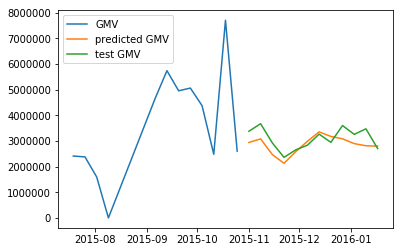

[379489.09379572497, 521173.0025548122]


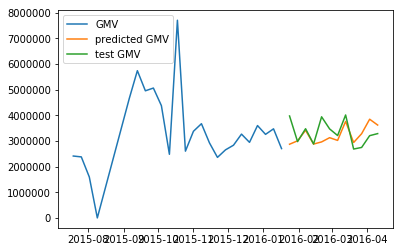

[379489.09379572497, 521173.0025548122, 1066979.676843218]


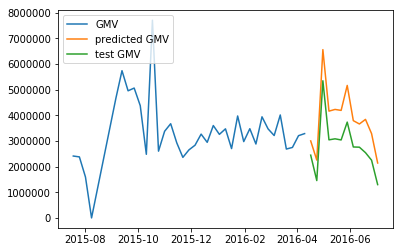

RMSE: 655880.591064585


In [254]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error

tscv = TimeSeriesSplit(n_splits = 3)
rmse = []

for train_index, test_index in tscv.split(X):
    cv_train, cv_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    cv_train = sm.add_constant(cv_train)
    cv_test=sm.add_constant(cv_test, prepend=True, has_constant='add')
    model = sm.OLS(y_train,cv_train).fit()
    predictions = model.predict(cv_test)
    true_values = y_test.values
    rmse.append(sqrt(mean_squared_error(true_values, predictions)))
    print(rmse)
    plt.plot(y_train.index,y_train, '-', label="GMV")
    plt.plot(y_test.index,predictions,'-',label="predicted GMV")
    plt.plot(y_test.index, y_test,'-',label="test GMV")
    plt.legend(loc='upper left')
    plt.show()
print("RMSE: {}".format(np.mean(rmse)))

In [255]:
### Validation of Test data on model 
test_new=test[cols]
test_new=sm.add_constant(test_new, prepend=True, has_constant='add')
test_new

,const,CameraBag,CameraTripod,CameraTripod
Week,,,,
2016-03-27,1.0,269.0,415.0,415.0
2016-04-03,1.0,319.0,489.0,489.0
2016-04-10,1.0,293.0,562.0,562.0
2016-04-17,1.0,243.0,349.0,349.0
2016-04-24,1.0,174.0,260.0,260.0
2016-05-01,1.0,570.0,799.0,799.0
2016-05-08,1.0,354.0,425.0,425.0
2016-05-15,1.0,363.0,385.0,385.0
2016-05-22,1.0,366.0,274.0,274.0


In [256]:
y_pred=camera_dlag.predict(test_new)
test_lr_reg=test.copy()
test_lr_reg['predicted_gmv']=y_pred

In [257]:
test['ActualGMV']=test.gmv

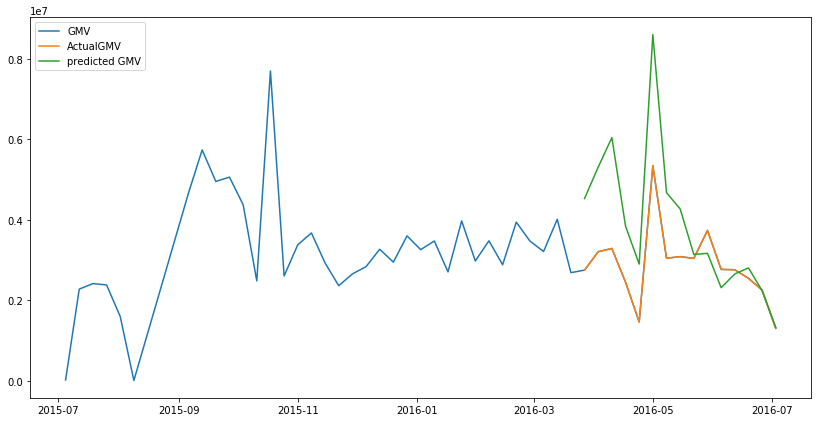

In [258]:
plt.figure(figsize=(14,7))
plt.plot(camera_final.index,camera_final.gmv, '-', label="GMV")
#plt.plot(test_new.index,test_lr_reg.predicted_gmv, '-',label="gmv predicted")
plt.plot(test.index, test.ActualGMV,'-',label="ActualGMV")
plt.plot(test.index,test_lr_reg.predicted_gmv,'-',label="predicted GMV")
#plt.plot(train.index, y_train_pred,'-',label="gmv_train_predicted")
plt.legend(loc='upper left')
plt.show()

In [259]:
from numpy import sqrt
from sklearn.metrics import mean_squared_error
camera_lr_reg_RMSE=sqrt(mean_squared_error(test.ActualGMV,test_lr_reg.predicted_gmv))
camera_lr_reg_RMSE

1517209.6805816193

#### <div id=128></div>Model Summary<br>
Model Adj-R2 : 0.947<br>
K-fold mean RMSE : 655880<br>
Test data RMSE : 1517209<br>
Features : Flash,CameraBag and CameraTripod are the significant features

### <div id=21></div>Model Building - Koyck Model

In [260]:
### Add 3 lags of the dependent variable
camera_koyck=camera_final.copy()
camera_koyck['gmv_lag1']=camera_koyck.gmv.shift(1)
camera_koyck['gmv_lag2']=camera_koyck.gmv.shift(2)
camera_koyck['gmv_lag3']=camera_koyck.gmv.shift(3)
camera_koyck=camera_koyck.dropna()

In [261]:
camera_withoutGMV=camera_koyck.copy()
camera_withoutGMV=camera_withoutGMV.drop('gmv',axis=1)

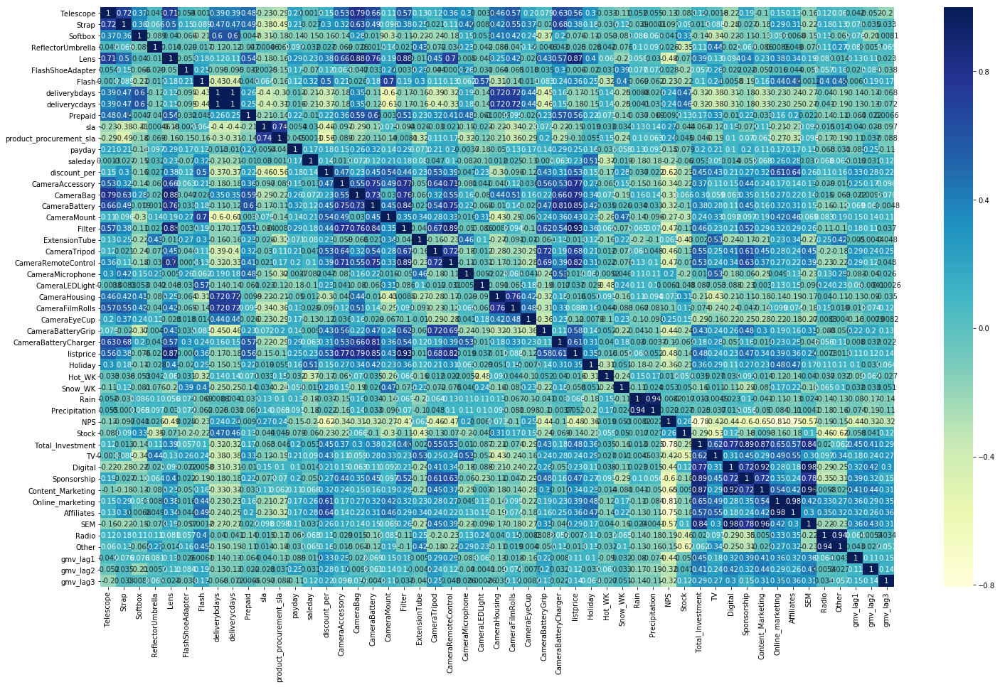

In [262]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(camera_withoutGMV.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [263]:
# Calculate the VIFs 
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
50,gmv_lag3,inf
17,CameraBattery,inf
36,NPS,inf
30,listprice,inf
29,CameraBatteryCharger,inf
37,Stock,inf
38,Total_Investment,inf
39,TV,inf
1,Strap,inf
40,Digital,inf


In [264]:
#creating the train and validation set from orignial data set
train = camera_koyck[:int(0.7*(len(camera_koyck)))]
test = camera_koyck[int(0.7*(len(camera_koyck))):]

In [265]:
camera_koyck.columns

Index(['Telescope', 'Strap', 'Softbox', 'ReflectorUmbrella', 'Lens',
       'FlashShoeAdapter', 'Flash', 'gmv', 'deliverybdays', 'deliverycdays',
       'Prepaid', 'sla', 'product_procurement_sla', 'payday', 'saleday',
       'discount_per', 'CameraAccessory', 'CameraBag', 'CameraBattery',
       'CameraMount', 'Filter', 'ExtensionTube', 'CameraTripod',
       'CameraRemoteControl', 'CameraMicrophone', 'CameraLEDLight',
       'CameraHousing', 'CameraFilmRolls', 'CameraEyeCup', 'CameraBatteryGrip',
       'CameraBatteryCharger', 'listprice', 'Holiday', 'Hot_WK', 'Snow_WK',
       'Rain', 'Precipitation', 'NPS', 'Stock', 'Total_Investment', 'TV',
       'Digital', 'Sponsorship', 'Content_Marketing', 'Online_marketing',
       'Affiliates', 'SEM', 'Radio', 'Other', 'gmv_lag1', 'gmv_lag2',
       'gmv_lag3'],
      dtype='object')

In [266]:
### Feature Scaling

cols_orig=['Telescope', 'Strap', 'Softbox', 'ReflectorUmbrella', 'Lens',
       'FlashShoeAdapter', 'Flash', 'deliverybdays', 'deliverycdays',
       'Prepaid', 'sla', 'product_procurement_sla', 'payday', 'saleday',
       'discount_per', 'CameraAccessory', 'CameraBag', 'CameraBattery',
       'CameraMount', 'Filter', 'ExtensionTube', 'CameraTripod',
       'CameraRemoteControl', 'CameraMicrophone', 'CameraLEDLight',
       'CameraHousing', 'CameraFilmRolls', 'CameraEyeCup', 'CameraBatteryGrip',
       'CameraBatteryCharger', 'listprice', 'Holiday', 'Hot_WK', 'Snow_WK',
       'Rain', 'Precipitation', 'NPS', 'Stock', 'Total_Investment', 'TV',
       'Digital', 'Sponsorship', 'Content_Marketing', 'Online_marketing',
       'Affiliates', 'SEM', 'Radio', 'Other', 'gmv_lag1', 'gmv_lag2',
       'gmv_lag3']
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
train[cols_orig]= scaler.fit_transform(train[cols_orig])
train.head(4)

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other,gmv_lag1,gmv_lag2,gmv_lag3
Week,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-07-26,-0.159844,-0.864146,-0.179605,-0.244137,-0.336135,-0.179605,-1.204031,2378641.0,-0.047539,-0.051687,-0.376138,-0.090717,0.123070,-0.881917,-0.560112,-0.287806,-0.310976,-0.281735,-0.242197,-1.379581,-0.625443,-0.911322,-0.591839,-0.613076,-0.417029,-0.258199,0.0,-2.367056,-0.506502,-0.094916,-0.118889,-0.829996,-0.208514,0.258199,-0.480384,0.52915,0.480384,1.926840,0.516532,-1.620304,-2.015775,-0.195594,-1.029034,-0.980548,-2.802422,-2.808463,-0.528962,-0.500233,-0.542501,-0.760539,-0.818410,-2.250871
2015-08-02,-1.355557,-0.864146,-0.179605,-0.244137,-1.523221,-0.179605,-1.198465,1595257.0,-0.312026,-0.311965,-1.086867,-0.075604,-0.095470,-0.881917,-0.560112,-0.452410,-0.798100,-1.185273,-1.069054,-1.745639,-1.333517,-0.911322,-0.782469,-0.830713,-0.417029,-0.258199,0.0,-2.367056,-0.506502,-0.094916,-0.863630,-0.946198,-3.544745,0.258199,-0.480384,0.52915,0.480384,2.381413,0.618454,-1.701201,-2.043694,-0.294356,-1.093059,-0.980815,-2.856376,-2.877868,-0.611006,-0.500233,-0.542501,-0.786204,-0.713630,-0.679222
2015-08-09,-2.219127,-3.368126,-0.179605,-0.244137,-2.855395,-0.179605,-1.248556,2646.0,-0.312026,-0.311965,-2.211615,5.070764,4.653242,-0.881917,-0.560112,-5.007751,-2.189881,-2.476042,-2.695074,-1.892062,-2.329247,-0.911322,-1.398081,-1.639080,-0.417029,-0.258199,0.0,-2.367056,-0.506502,-1.803400,-2.290303,-2.685138,-0.208514,0.258199,-0.480384,0.52915,0.480384,3.517845,0.873260,-1.903443,-2.113490,-0.541262,-1.253122,-0.981483,-2.991260,-3.051380,-0.816116,-0.500233,-0.542501,-1.386605,-0.739106,-0.583369
2015-09-06,2.298011,-0.319802,-0.179605,-0.244137,0.692673,-0.179605,-0.569549,4664064.0,-0.312026,-0.311965,1.148826,-0.678325,0.025117,1.133893,-0.560112,-0.495479,1.289572,0.879957,1.644936,0.889978,0.879216,-0.911322,0.546695,1.159112,-0.417029,-0.258199,0.0,-0.059241,-0.506502,0.854242,0.204131,0.938608,-0.208514,0.258199,-0.480384,0.52915,0.480384,0.211596,-0.233829,0.006092,-0.508725,-0.512063,0.676942,-0.435874,-0.721930,-0.794766,-0.434161,-0.500233,-0.542501,-2.607213,-1.335065,-0.606674


In [267]:
#Feature selection using rFE
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE

X=train.copy()
X=X.drop('gmv',axis=1)
Y=train['gmv']
estimator_lr=LinearRegression()
rfe = RFE(estimator_lr, 15)             
rfe = rfe.fit(X,Y)

In [268]:
ranking=pd.DataFrame(list(zip(X.columns,rfe.support_,rfe.ranking_)),columns=('Feature','FistList','Rank'))
ranking. head(3)

,Feature,FistList,Rank
0,Telescope,True,1
1,Strap,False,6
2,Softbox,True,1


In [269]:
col_rfe = X.columns[rfe.support_]
col_rfe

Index(['Telescope', 'Softbox', 'Flash', 'sla', 'payday', 'discount_per',
       'CameraBag', 'CameraBattery', 'Filter', 'CameraTripod',
       'CameraMicrophone', 'listprice', 'Holiday', 'NPS', 'gmv_lag1'],
      dtype='object')

In [270]:
ranking.loc[(ranking.Rank >= 2) & (ranking.Rank<=15)]

,Feature,FistList,Rank
1,Strap,False,6
3,ReflectorUmbrella,False,12
4,Lens,False,7
5,FlashShoeAdapter,False,3
9,Prepaid,False,10
11,product_procurement_sla,False,4
15,CameraAccessory,False,13
20,ExtensionTube,False,11
22,CameraRemoteControl,False,2
27,CameraEyeCup,False,5


In [271]:
# Calculate the VIFs on features selected using RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,listprice,313.09
13,NPS,293.65
3,sla,199.47
5,discount_per,135.85
6,CameraBag,98.99
8,Filter,89.80
7,CameraBattery,58.07
0,Telescope,22.45
12,Holiday,19.80
14,gmv_lag1,16.48


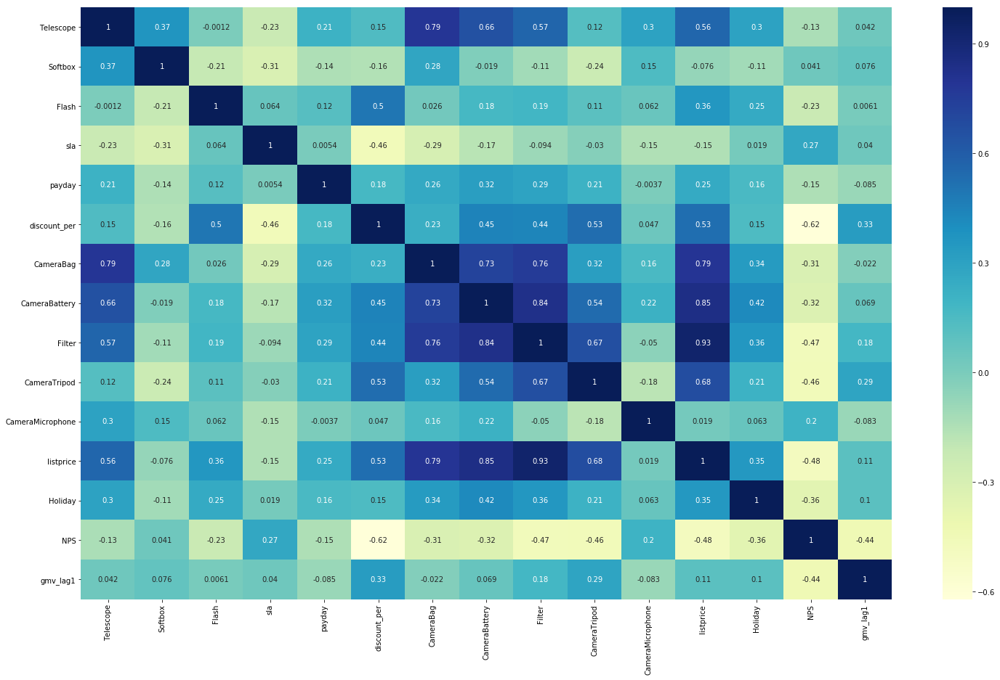

In [272]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(X.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [273]:
## remove attributes with high multicolinearity 
col_rfe=['Telescope', 'Softbox', 'Flash', 'sla', 'payday', 'discount_per',
       'CameraBag', 'CameraBattery', 'Filter', 'CameraTripod',
       'CameraMicrophone', 'Holiday', 'NPS', 'gmv_lag1','SEM']

       
vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,NPS,370.91
3,sla,237.45
5,discount_per,142.75
8,Filter,66.55
6,CameraBag,58.93
7,CameraBattery,46.63
0,Telescope,26.99
11,Holiday,17.33
13,gmv_lag1,16.78
9,CameraTripod,7.34


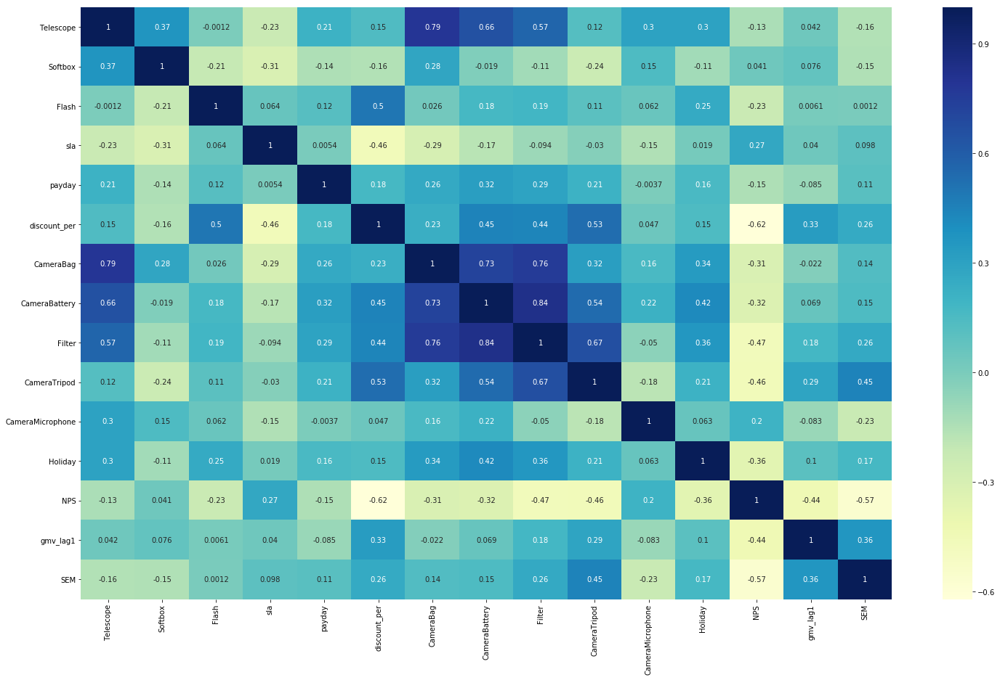

In [274]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(X.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [275]:
## remove attributes with high multicolinearity 
col_rfe=['Telescope', 'Softbox', 'Flash', 'sla', 'payday', 'discount_per',
       'CameraBag', 'CameraBattery', 'Filter', 'CameraTripod',
       'CameraMicrophone', 'Holiday', 'NPS', 'gmv_lag1','SEM']



vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,NPS,370.91
3,sla,237.45
5,discount_per,142.75
8,Filter,66.55
6,CameraBag,58.93
7,CameraBattery,46.63
0,Telescope,26.99
11,Holiday,17.33
13,gmv_lag1,16.78
9,CameraTripod,7.34


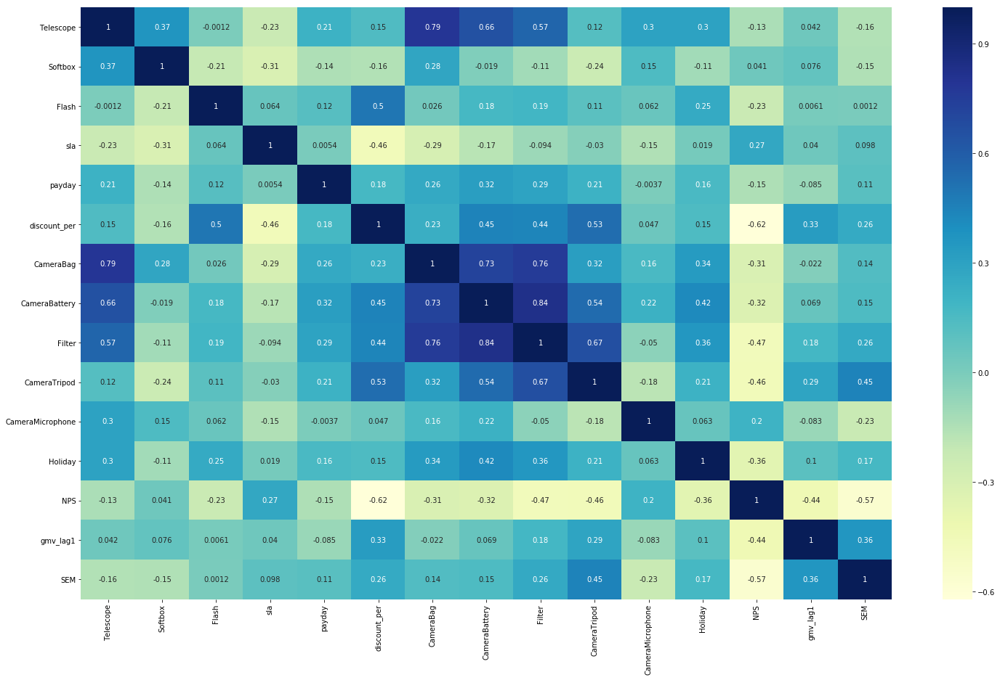

In [276]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(X.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [277]:
## remove attributes with high multicolinearity 
col_rfe=['Telescope', 'Softbox', 'Flash', 'sla', 'payday', 'discount_per',
       'CameraBag', 'CameraBattery', 'Filter', 'CameraTripod',
       'CameraMicrophone', 'Holiday', 'gmv_lag1','SEM']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,discount_per,70.30
8,Filter,64.52
6,CameraBag,56.30
7,CameraBattery,46.53
3,sla,41.97
0,Telescope,26.34
11,Holiday,17.30
12,gmv_lag1,15.46
9,CameraTripod,7.20
13,SEM,3.94


In [278]:
### Removing features with high VIF 
col_rfe=['Telescope', 'Softbox', 'Flash', 'sla', 'payday', 
       'CameraBag', 'CameraBattery', 'Filter', 'CameraTripod',
       'CameraMicrophone', 'Holiday', 'gmv_lag1','SEM']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,Filter,60.78
5,CameraBag,51.83
6,CameraBattery,43.27
0,Telescope,25.92
3,sla,18.63
10,Holiday,17.25
11,gmv_lag1,12.87
8,CameraTripod,6.78
12,SEM,3.89
2,Flash,2.52


In [279]:
### Build model using the features identified using VIF & Correlation  - manual & RFE  approach.

import statsmodels.api as sm
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m1 = sm.OLS(y,X).fit()
camera_koyck_m1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     153.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.13e-15
Time:                        21:44:19   Log-Likelihood:                -420.42
No. Observations:                  32   AIC:                             868.8
Df Residuals:                      18   BIC:                             889.4
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.413e+06    2.9e+04    117.814      0.000    3.35e+06    3.47e+06
Telescope         6.975e+04    5.7e+04      1.223      0.237   -5.01e+04     1.9e+05
Softbox          -5.512e+04   3.43e+04     -1.605      0.126   -1.27e+05     1.7e+04
Flash             2.944e+05   3.63e+04      8.112      0.000    2.18e+05    3.71e+05
sla               1.311e+04   3.58e+04      0.366      0.718   -6.21e+04    8.83e+04
payday           -1.045e+05   3.41e+04     -3.065      0.007   -1.76e+05   -3.29e+04
CameraBag         5.011e+05   8.47e+04      5.916      0.000    3.23e+05    6.79e+05
CameraBattery     2.007e+05   6.66e+04      3.014      0.007    6.08e+04    3.41e+05
Filter            3.516e+05   1.02e+05      3.436      0.003    1.37e+05    5.67e+05
CameraTripod       2.54e+05    4.6e+04      5.516      0.000    1.57e+05    3.51e+05
CameraMicrophone -5450.3024   3.32e+04     -0.164      0.871   -7.51e+04    6.42e+04
Holiday           4.287e+04   3.35e+04      1.280      0.217   -2.75e+04    1.13e+05
gmv_lag1         -4.634e+04   3.63e+04     -1.277      0.218   -1.23e+05    2.99e+04
SEM               6.989e+04   4.02e+04      1.740      0.099   -1.45e+04    1.54e+05
==============================================================================
Omnibus:                        0.070   Durbin-Watson:                   2.086
Prob(Omnibus):                  0.966   Jarque-Bera (JB):                0.137
Skew:                          -0.091   Prob(JB):                        0.934
Kurtosis:                       2.737   Cond. No.                         9.42
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [280]:
### Removing features with high VIF / high p-value
col_rfe=['Telescope', 'Softbox', 'Flash', 'payday', 
       'CameraBag', 'CameraBattery', 'Filter', 'CameraTripod',
       'CameraMicrophone', 'Holiday', 'gmv_lag1','SEM']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Filter,60.11
4,CameraBag,49.90
5,CameraBattery,42.24
0,Telescope,25.70
9,Holiday,14.47
10,gmv_lag1,9.22
7,CameraTripod,6.67
11,SEM,3.87
2,Flash,2.50
1,Softbox,2.29


In [281]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m2 = sm.OLS(y,X).fit()
camera_koyck_m2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     174.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           8.84e-17
Time:                        21:44:19   Log-Likelihood:                -420.54
No. Observations:                  32   AIC:                             867.1
Df Residuals:                      19   BIC:                             886.1
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.413e+06   2.83e+04    120.594      0.000    3.35e+06    3.47e+06
Telescope          6.93e+04   5.57e+04      1.244      0.229   -4.73e+04    1.86e+05
Softbox          -5.383e+04   3.34e+04     -1.613      0.123   -1.24e+05     1.6e+04
Flash             2.918e+05   3.47e+04      8.399      0.000    2.19e+05    3.64e+05
payday           -1.038e+05   3.33e+04     -3.121      0.006   -1.73e+05   -3.42e+04
CameraBag         4.954e+05   8.14e+04      6.089      0.000    3.25e+05    6.66e+05
CameraBattery     1.923e+05   6.11e+04      3.148      0.005    6.44e+04     3.2e+05
Filter            3.612e+05   9.66e+04      3.739      0.001    1.59e+05    5.63e+05
CameraTripod      2.504e+05    4.4e+04      5.694      0.000    1.58e+05    3.43e+05
CameraMicrophone -5942.2112   3.24e+04     -0.183      0.856   -7.37e+04    6.18e+04
Holiday           4.446e+04   3.24e+04      1.371      0.186   -2.34e+04    1.12e+05
gmv_lag1         -4.766e+04   3.53e+04     -1.350      0.193   -1.22e+05    2.62e+04
SEM               7.084e+04   3.92e+04      1.809      0.086   -1.11e+04    1.53e+05
==============================================================================
Omnibus:                        0.116   Durbin-Watson:                   2.069
Prob(Omnibus):                  0.943   Jarque-Bera (JB):                0.108
Skew:                          -0.102   Prob(JB):                        0.948
Kurtosis:                       2.802   Cond. No.                         8.76
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [282]:
### Removing features with high VIF / high p-value
col_rfe=['Softbox', 'Flash', 'payday', 
       'CameraBag', 'CameraBattery', 'Filter', 'CameraTripod',
       'CameraMicrophone', 'Holiday', 'gmv_lag1','SEM']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Filter,60.11
4,CameraBattery,39.64
3,CameraBag,39.27
8,Holiday,14.45
9,gmv_lag1,8.69
6,CameraTripod,6.52
10,SEM,3.22
1,Flash,2.47
0,Softbox,2.22
2,payday,2.06


In [283]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m3 = sm.OLS(y,X).fit()
camera_koyck_m3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     184.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.32e-17
Time:                        21:44:19   Log-Likelihood:                -421.79
No. Observations:                  32   AIC:                             867.6
Df Residuals:                      20   BIC:                             885.2
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const             3.413e+06   2.87e+04    118.978      0.000    3.35e+06    3.47e+06
Softbox           -4.41e+04   3.29e+04     -1.341      0.195   -1.13e+05    2.45e+04
Flash             2.854e+05   3.48e+04      8.195      0.000    2.13e+05    3.58e+05
payday           -8.988e+04   3.17e+04     -2.832      0.010   -1.56e+05   -2.37e+04
CameraBag          5.23e+05   7.93e+04      6.592      0.000    3.58e+05    6.88e+05
CameraBattery     2.135e+05   5.95e+04      3.590      0.002    8.94e+04    3.37e+05
Filter            3.747e+05   9.73e+04      3.851      0.001    1.72e+05    5.78e+05
CameraTripod      2.412e+05   4.39e+04      5.489      0.000     1.5e+05    3.33e+05
CameraMicrophone  2611.8534   3.21e+04      0.081      0.936   -6.43e+04    6.95e+04
Holiday           4.331e+04   3.29e+04      1.318      0.202   -2.52e+04    1.12e+05
gmv_lag1         -3.749e+04   3.48e+04     -1.077      0.294    -1.1e+05    3.51e+04
SEM               4.972e+04   3.58e+04      1.391      0.180   -2.49e+04    1.24e+05
==============================================================================
Omnibus:                        0.702   Durbin-Watson:                   1.976
Prob(Omnibus):                  0.704   Jarque-Bera (JB):                0.540
Skew:                           0.304   Prob(JB):                        0.763
Kurtosis:                       2.814   Cond. No.                         8.17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [284]:
### Removing features with high VIF / high p-value
col_rfe=['Softbox', 'Flash', 'payday', 
       'CameraBag', 'CameraBattery', 'Filter', 'CameraTripod',
        'Holiday', 'gmv_lag1','SEM']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Filter,51.74
3,CameraBag,37.44
4,CameraBattery,32.49
7,Holiday,14.27
8,gmv_lag1,8.57
6,CameraTripod,6.49
9,SEM,3.15
1,Flash,2.45
0,Softbox,2.19
2,payday,2.05


In [285]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m4 = sm.OLS(y,X).fit()
camera_koyck_m4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.990
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     213.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           8.71e-19
Time:                        21:44:19   Log-Likelihood:                -421.80
No. Observations:                  32   AIC:                             865.6
Df Residuals:                      21   BIC:                             881.7
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          3.413e+06    2.8e+04    121.896      0.000    3.35e+06    3.47e+06
Softbox       -4.375e+04   3.18e+04     -1.375      0.184    -1.1e+05    2.24e+04
Flash          2.858e+05   3.36e+04      8.498      0.000    2.16e+05    3.56e+05
payday        -8.986e+04    3.1e+04     -2.901      0.009   -1.54e+05   -2.54e+04
CameraBag      5.233e+05   7.74e+04      6.764      0.000    3.62e+05    6.84e+05
CameraBattery  2.137e+05    5.8e+04      3.686      0.001    9.31e+04    3.34e+05
Filter          3.75e+05   9.49e+04      3.952      0.001    1.78e+05    5.72e+05
CameraTripod   2.403e+05   4.16e+04      5.783      0.000    1.54e+05    3.27e+05
Holiday         4.29e+04   3.17e+04      1.354      0.190    -2.3e+04    1.09e+05
gmv_lag1      -3.718e+04   3.38e+04     -1.101      0.283   -1.07e+05     3.3e+04
SEM            4.936e+04   3.46e+04      1.425      0.169   -2.27e+04    1.21e+05
==============================================================================
Omnibus:                        0.760   Durbin-Watson:                   1.980
Prob(Omnibus):                  0.684   Jarque-Bera (JB):                0.571
Skew:                           0.316   Prob(JB):                        0.752
Kurtosis:                       2.828   Cond. No.                         8.16
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [286]:
### Removing features with high VIF / high p-value
col_rfe=['Softbox', 'Flash', 'payday', 
       'CameraBag', 'CameraBattery', 'Filter', 'CameraTripod',
         'gmv_lag1','SEM']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Filter,49.57
3,CameraBag,33.92
4,CameraBattery,29.00
7,gmv_lag1,6.69
6,CameraTripod,6.45
8,SEM,3.13
1,Flash,2.27
0,Softbox,2.08
2,payday,2.05


In [287]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m5 = sm.OLS(y,X).fit()
camera_koyck_m5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.989
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     228.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.33e-19
Time:                        21:44:19   Log-Likelihood:                -423.13
No. Observations:                  32   AIC:                             866.3
Df Residuals:                      22   BIC:                             880.9
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          3.413e+06   2.85e+04    119.653      0.000    3.35e+06    3.47e+06
Softbox       -4.784e+04   3.23e+04     -1.482      0.152   -1.15e+05    1.91e+04
Flash          2.953e+05   3.35e+04      8.813      0.000    2.26e+05    3.65e+05
payday        -8.579e+04   3.14e+04     -2.731      0.012   -1.51e+05   -2.06e+04
CameraBag      5.278e+05   7.87e+04      6.704      0.000    3.65e+05    6.91e+05
CameraBattery  2.248e+05   5.85e+04      3.845      0.001    1.04e+05    3.46e+05
Filter         3.747e+05   9.67e+04      3.876      0.001    1.74e+05    5.75e+05
CameraTripod   2.377e+05   4.23e+04      5.621      0.000     1.5e+05    3.25e+05
gmv_lag1      -3.476e+04   3.43e+04     -1.012      0.322   -1.06e+05    3.65e+04
SEM            5.349e+04   3.51e+04      1.522      0.142   -1.94e+04    1.26e+05
==============================================================================
Omnibus:                        1.013   Durbin-Watson:                   1.732
Prob(Omnibus):                  0.602   Jarque-Bera (JB):                0.777
Skew:                           0.371   Prob(JB):                        0.678
Kurtosis:                       2.822   Cond. No.                         7.94
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [288]:
### Removing features with high VIF / high p-value
col_rfe=['Softbox', 'Flash', 'payday', 
       'CameraBag', 'CameraBattery',  'CameraTripod',
         'gmv_lag1','SEM']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,CameraBattery,25.00
3,CameraBag,19.98
6,gmv_lag1,6.42
5,CameraTripod,4.73
7,SEM,3.09
1,Flash,2.25
2,payday,2.04
0,Softbox,1.75


In [289]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m6 = sm.OLS(y,X).fit()
camera_koyck_m6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.976
Method:                 Least Squares   F-statistic:                     158.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.03e-18
Time:                        21:44:19   Log-Likelihood:                -431.46
No. Observations:                  32   AIC:                             880.9
Df Residuals:                      23   BIC:                             894.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          3.413e+06   3.62e+04     94.308      0.000    3.34e+06    3.49e+06
Softbox       -7.446e+04      4e+04     -1.861      0.076   -1.57e+05    8325.217
Flash          2.887e+05   4.25e+04      6.800      0.000    2.01e+05    3.77e+05
payday        -9.552e+04   3.97e+04     -2.404      0.025   -1.78e+05   -1.33e+04
CameraBag      7.564e+05   6.62e+04     11.423      0.000    6.19e+05    8.93e+05
CameraBattery  3.356e+05   6.47e+04      5.187      0.000    2.02e+05    4.69e+05
CameraTripod   2.945e+05   5.03e+04      5.852      0.000     1.9e+05    3.99e+05
gmv_lag1       1.574e+04   4.03e+04      0.391      0.700   -6.76e+04    9.91e+04
SEM            1.772e+04    4.3e+04      0.412      0.684   -7.13e+04    1.07e+05
==============================================================================
Omnibus:                        3.455   Durbin-Watson:                   1.630
Prob(Omnibus):                  0.178   Jarque-Bera (JB):                2.247
Skew:                           0.623   Prob(JB):                        0.325
Kurtosis:                       3.364   Cond. No.                         3.93
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [290]:
### Removing features with high VIF / high p-value
col_rfe=['Softbox', 'Flash', 'payday', 
       'CameraBag',  'CameraTripod',
         'gmv_lag1','SEM']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,CameraBag,7.21
5,gmv_lag1,5.86
4,CameraTripod,4.07
6,SEM,2.97
1,Flash,2.16
2,payday,2.00
0,Softbox,1.68


In [291]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m7 = sm.OLS(y,X).fit()
camera_koyck_m7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.950
Method:                 Least Squares   F-statistic:                     85.11
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.18e-15
Time:                        21:44:20   Log-Likelihood:                -443.86
No. Observations:                  32   AIC:                             903.7
Df Residuals:                      24   BIC:                             915.4
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         3.413e+06   5.22e+04     65.402      0.000    3.31e+06    3.52e+06
Softbox      -7.206e+04   5.77e+04     -1.249      0.224   -1.91e+05     4.7e+04
Flash          2.75e+05   6.11e+04      4.501      0.000    1.49e+05    4.01e+05
payday        -6.74e+04   5.67e+04     -1.188      0.247   -1.85e+05    4.97e+04
CameraBag     9.959e+05   6.84e+04     14.552      0.000    8.55e+05    1.14e+06
CameraTripod   3.62e+05   7.01e+04      5.164      0.000    2.17e+05    5.07e+05
gmv_lag1      3.512e+04   5.79e+04      0.607      0.550   -8.43e+04    1.55e+05
SEM          -4.082e+04   5.99e+04     -0.682      0.502   -1.64e+05    8.27e+04
==============================================================================
Omnibus:                        1.452   Durbin-Watson:                   1.985
Prob(Omnibus):                  0.484   Jarque-Bera (JB):                1.294
Skew:                           0.346   Prob(JB):                        0.524
Kurtosis:                       2.299   Cond. No.                         2.53
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [292]:
### Removing features with high VIF / high p-value
col_rfe=['Softbox', 'Flash', 'payday', 
       'CameraBag',  'CameraTripod','SEM'
         ]

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,CameraBag,6.12
4,CameraTripod,3.90
5,SEM,2.59
1,Flash,2.02
2,payday,1.99
0,Softbox,1.62


In [293]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m8 = sm.OLS(y,X).fit()
camera_koyck_m8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                     101.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.46e-16
Time:                        21:44:20   Log-Likelihood:                -444.10
No. Observations:                  32   AIC:                             902.2
Df Residuals:                      25   BIC:                             912.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         3.413e+06   5.15e+04     66.245      0.000    3.31e+06    3.52e+06
Softbox       -6.88e+04   5.67e+04     -1.213      0.236   -1.86e+05     4.8e+04
Flash         2.753e+05   6.03e+04      4.564      0.000    1.51e+05       4e+05
payday       -7.228e+04   5.55e+04     -1.303      0.204   -1.87e+05    4.19e+04
CameraBag     9.913e+05   6.72e+04     14.761      0.000    8.53e+05    1.13e+06
CameraTripod  3.718e+05   6.73e+04      5.522      0.000    2.33e+05     5.1e+05
SEM          -3.049e+04   5.67e+04     -0.538      0.595   -1.47e+05    8.62e+04
==============================================================================
Omnibus:                        1.675   Durbin-Watson:                   1.950
Prob(Omnibus):                  0.433   Jarque-Bera (JB):                1.311
Skew:                           0.295   Prob(JB):                        0.519
Kurtosis:                       2.203   Cond. No.                         2.41
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [294]:
### Removing features with high VIF / high p-value
col_rfe=['Flash', 'payday', 
       'CameraBag',  'CameraTripod','SEM'
         ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,CameraBag,3.97
3,CameraTripod,3.59
4,SEM,2.59
0,Flash,1.94
1,payday,1.93


In [295]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m9 = sm.OLS(y,X).fit()
camera_koyck_m9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.950
Method:                 Least Squares   F-statistic:                     119.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.30e-17
Time:                        21:44:20   Log-Likelihood:                -445.01
No. Observations:                  32   AIC:                             902.0
Df Residuals:                      26   BIC:                             910.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         3.413e+06    5.2e+04     65.652      0.000    3.31e+06    3.52e+06
Flash         2.474e+05   5.63e+04      4.396      0.000    1.32e+05    3.63e+05
payday       -5.821e+04   5.47e+04     -1.064      0.297   -1.71e+05    5.43e+04
CameraBag     9.962e+05   6.76e+04     14.729      0.000    8.57e+05    1.14e+06
CameraTripod   3.67e+05   6.78e+04      5.411      0.000    2.28e+05    5.06e+05
SEM          -2.973e+04   5.72e+04     -0.520      0.607   -1.47e+05    8.78e+04
==============================================================================
Omnibus:                        2.257   Durbin-Watson:                   2.119
Prob(Omnibus):                  0.324   Jarque-Bera (JB):                1.704
Skew:                           0.387   Prob(JB):                        0.427
Kurtosis:                       2.177   Cond. No.                         2.34
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [296]:
### Removing features with high VIF / high p-value
col_rfe=['Flash',  'CameraBag',  'CameraTripod' ]

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,CameraBag,3.34
2,CameraTripod,2.84
0,Flash,1.92


In [297]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m10 = sm.OLS(y,X).fit()
camera_koyck_m10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.951
Method:                 Least Squares   F-statistic:                     202.9
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.30e-19
Time:                        21:44:20   Log-Likelihood:                -445.89
No. Observations:                  32   AIC:                             899.8
Df Residuals:                      28   BIC:                             905.6
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         3.413e+06   5.15e+04     66.288      0.000    3.31e+06    3.52e+06
Flash         2.456e+05   5.48e+04      4.483      0.000    1.33e+05    3.58e+05
CameraBag     9.815e+05   6.58e+04     14.906      0.000    8.47e+05    1.12e+06
CameraTripod  3.505e+05   6.48e+04      5.406      0.000    2.18e+05    4.83e+05
==============================================================================
Omnibus:                        1.678   Durbin-Watson:                   2.093
Prob(Omnibus):                  0.432   Jarque-Bera (JB):                1.250
Skew:                           0.254   Prob(JB):                        0.535
Kurtosis:                       2.176   Cond. No.                         2.09
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

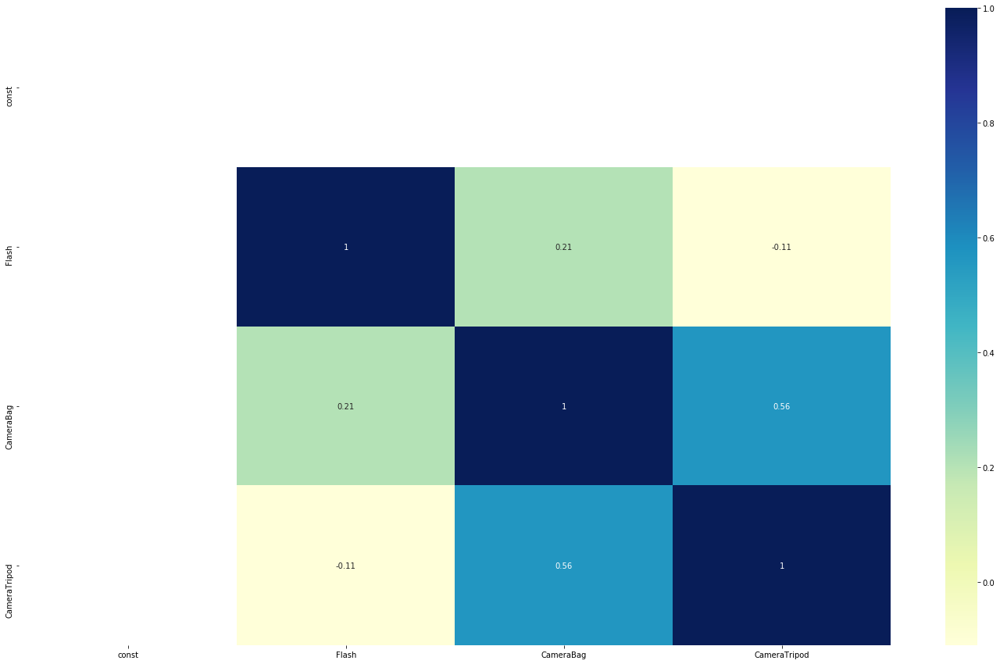

In [298]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(X.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [299]:
### Removing features with high VIF / high p-value and trying to add gmv_lag1 
col_rfe=['Flash',  'CameraBag',  'CameraTripod' ,'gmv_lag1' ]

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,CameraBag,5.06
3,gmv_lag1,4.95
2,CameraTripod,3.13
0,Flash,2.01


In [300]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_koyck_m11 = sm.OLS(y,X).fit()
camera_koyck_m11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.956
Model:                            OLS   Adj. R-squared:                  0.950
Method:                 Least Squares   F-statistic:                     148.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.99e-18
Time:                        21:44:21   Log-Likelihood:                -445.76
No. Observations:                  32   AIC:                             901.5
Df Residuals:                      27   BIC:                             908.8
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const         3.413e+06   5.22e+04     65.368      0.000    3.31e+06    3.52e+06
Flash         2.459e+05   5.56e+04      4.427      0.000    1.32e+05     3.6e+05
CameraBag     9.848e+05   6.71e+04     14.672      0.000    8.47e+05    1.12e+06
CameraTripod  3.414e+05   6.85e+04      4.985      0.000    2.01e+05    4.82e+05
gmv_lag1      2.617e+04   5.47e+04      0.478      0.637   -8.62e+04    1.39e+05
==============================================================================
Omnibus:                        1.498   Durbin-Watson:                   2.097
Prob(Omnibus):                  0.473   Jarque-Bera (JB):                1.240
Skew:                           0.295   Prob(JB):                        0.538
Kurtosis:                       2.237   Cond. No.                         2.21
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [301]:
### Lag of GMV is insignificant. SEM -only investment which was little significant is also insignificant in the final model.
### use model - camera_koyck_m10
col_rfe=['Flash',  'CameraBag',  'CameraTripod'    ]

In [302]:
### Calculation of K-fold validation of timeseries split.
X = camera_koyck.copy()
X=X[col_rfe]
y=camera_koyck['gmv']

[282642.0847372983]


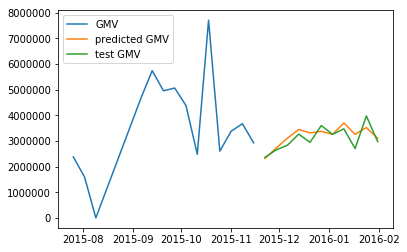

[282642.0847372983, 320007045.7400753]


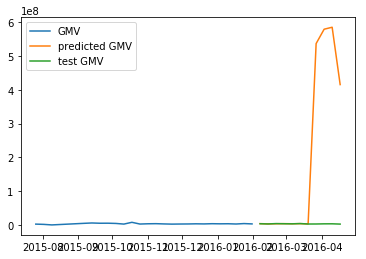

[282642.0847372983, 320007045.7400753, 1214475.9753843434]


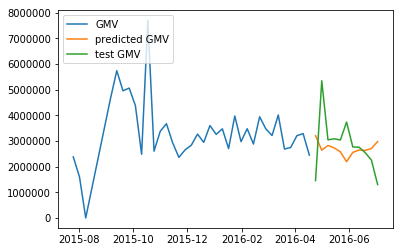

RMSE: 107168054.60006565


In [303]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error

tscv = TimeSeriesSplit(n_splits = 3)
rmse = []

for train_index, test_index in tscv.split(X):
    cv_train, cv_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    scaler_new=StandardScaler()
    cv_train[col_rfe]=scaler_new.fit_transform(cv_train[col_rfe])
    cv_test[col_rfe]=scaler_new.transform(cv_test[col_rfe])
    #print(cv_train)
    cv_train = sm.add_constant(cv_train)
    cv_test=sm.add_constant(cv_test, prepend=True, has_constant='add')
    
    model = sm.OLS(y_train,cv_train).fit()
    predictions = model.predict(cv_test)
    true_values = y_test.values
    rmse.append(sqrt(mean_squared_error(true_values, predictions)))
    print(rmse)
    plt.plot(y_train.index,y_train, '-', label="GMV")
    plt.plot(y_test.index,predictions,'-',label="predicted GMV")
    plt.plot(y_test.index, y_test,'-',label="test GMV")
    plt.legend(loc='upper left')
    plt.show()
print("RMSE: {}".format(np.mean(rmse)))

In [304]:
### TEST Validation by fitting into the model
test[cols_orig] = scaler.transform(test[cols_orig])
test_new=test[col_rfe]
test_new=sm.add_constant(test_new, prepend=True, has_constant='add')
test_new

,const,Flash,CameraBag,CameraTripod
Week,,,,
2016-03-27,1.0,-0.335793,0.194856,-0.675786
2016-04-03,1.0,-0.563984,0.691306,-0.546367
2016-04-10,1.0,-0.517603,0.433152,-0.418698
2016-04-17,1.0,-0.860817,-0.063297,-0.791213
2016-04-24,1.0,-1.051903,-0.748398,-0.946865
2016-05-01,1.0,-0.562128,3.183482,-0.004208
2016-05-08,1.0,-0.873803,1.038821,-0.658297
2016-05-15,1.0,-0.888645,1.128182,-0.728253
2016-05-22,1.0,-1.024075,1.157968,-0.922381


In [305]:
y_pred=camera_koyck_m10.predict(test_new)
test_lr_reg=test.copy()
test_lr_reg['predicted_gmv']=y_pred

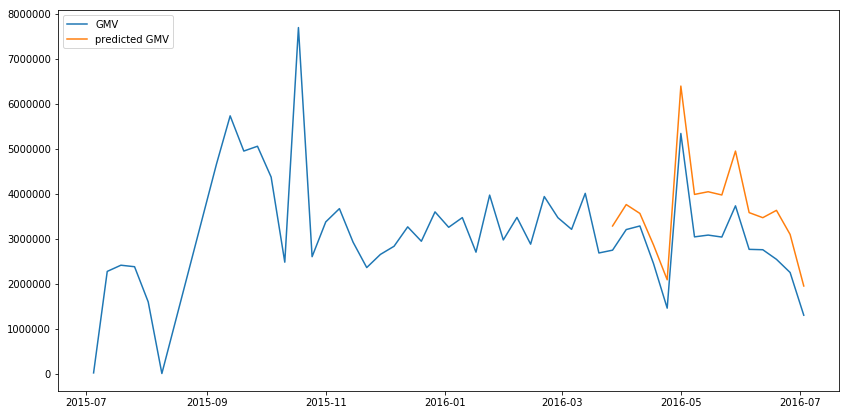

In [306]:
plt.figure(figsize=(14,7))
plt.plot(camera_final.index,camera_final.gmv, '-', label="GMV")
plt.plot(test.index,test_lr_reg.predicted_gmv,'-',label="predicted GMV")
plt.legend(loc='upper left')
plt.show()

In [307]:
from numpy import sqrt
from sklearn.metrics import mean_squared_error
camera_lr_reg_RMSE=sqrt(mean_squared_error(test.gmv,test_lr_reg.predicted_gmv))
camera_lr_reg_RMSE

818370.4478075214

#### <div id=22></div>Koyck Model Summary:
Model Adj-R2 : 0.95
K-fold Mean RMSE :461510
Test Validation RMSE : 818370

<B> GMV lag doesnt come out as significant feature and so Koyck model is not suitable for this dataset </B>

### <div id=23></div>Model Buidling - Multiplicative-Lag Model

In [308]:
camera_log=camera_final.copy()
cols_orig=['Telescope','Strap','Softbox','ReflectorUmbrella','Lens','FlashShoeAdapter','Flash','deliverybdays','deliverycdays','Prepaid','sla','product_procurement_sla','payday','saleday','discount_per','CameraAccessory','CameraBag','CameraBattery','CameraMount','Filter','ExtensionTube','CameraTripod','CameraRemoteControl','CameraMicrophone','CameraLEDLight','CameraHousing','CameraFilmRolls','CameraEyeCup','CameraBatteryGrip','CameraBatteryCharger','listprice','Holiday','Hot_WK','Snow_WK','Rain','Precipitation','NPS','Stock','Total_Investment','TV','Digital','Sponsorship','Content_Marketing','Online_marketing','Affiliates','SEM','Radio','Other']


In [309]:
### Convert 0 & Negative values to non-zero value
camera_log=camera_log.apply(lambda x : [abs(i)+0.0001 if i <= 0 else i for i in x])
camera_log

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other
Week,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-07-05,0.0001,0.0001,0.0001,0.0001,1.0000,0.0001,0.0001,1.608400e+04,0.470588,0.500000,18.0,3.264706,1.323529,0.0001,0.0001,39.804973,0.0001,1.0000,0.0001,0.0001,0.0001,0.0001,13.0,1.0000,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,1.0000,8.042000e+03,1.0000,1.0000,0.0001,0.0001,0.0001,54.599588,1177.000000,3.997134e+06,5.044631e+04,5.934197e+05,1.736972e+06,2.185538e+02,3.109469e+05,1.282075e+05,1.176923e+06,0.000100,1.000000e-04
2015-07-12,16.0000,13.0000,0.0001,0.0001,260.0000,0.0001,19.0000,2.274396e+06,0.000100,0.000100,758.0,7.099222,2.737721,0.0001,0.0001,42.014021,33.0000,205.0000,551.0000,4.0000,167.0000,0.0001,443.0,85.0000,0.0001,0.0001,0.0001,0.0001,0.0001,12.0000,196.0000,3.713382e+05,2.0000,1.0000,0.0001,1.0000,1.0000,54.599588,1177.000000,5.595987e+06,7.062483e+04,8.307876e+05,2.431761e+06,3.059753e+02,4.353256e+05,1.794904e+05,1.647692e+06,0.000100,1.000000e-04
2015-07-19,22.0000,24.0000,0.0001,0.0001,313.0000,0.0001,23.0000,2.412128e+06,0.000100,0.000100,848.0,6.469560,2.754690,1.0000,2.0000,43.396963,20.0000,254.0000,622.0000,11.0000,134.0000,0.0001,491.0,99.0000,0.0001,0.0001,0.0001,0.0001,0.0001,5.0000,196.0000,3.388427e+05,2.0000,1.0000,0.0001,1.0000,1.0000,54.599588,1177.000000,5.595987e+06,7.062483e+04,8.307876e+05,2.431761e+06,3.059753e+02,4.353256e+05,1.794904e+05,1.647692e+06,0.000100,1.000000e-04
2015-07-26,31.0000,23.0000,0.0001,0.0001,382.0000,0.0001,24.0000,2.378641e+06,0.005510,0.006297,801.0,6.410917,2.832621,0.0001,0.0001,43.083996,27.0000,221.0000,623.0000,7.0000,154.0000,0.0001,463.0,66.0000,0.0001,0.0001,0.0001,0.0001,0.0001,9.0000,242.0000,3.330709e+05,2.0000,1.0000,0.0001,1.0000,1.0000,54.599588,1177.000000,5.595987e+06,7.062483e+04,8.307876e+05,2.431761e+06,3.059753e+02,4.353256e+05,1.794904e+05,1.647692e+06,0.000100,1.000000e-04
2015-08-02,13.0000,23.0000,0.0001,0.0001,202.0000,0.0001,27.0000,1.595257e+06,0.000100,0.000100,492.0,6.419474,2.776306,0.0001,0.0001,42.183558,20.0000,130.0000,414.0000,2.0000,90.0000,0.0001,354.0,52.0000,0.0001,0.0001,0.0001,0.0001,0.0001,9.0000,159.0000,3.122634e+05,0.0001,1.0000,0.0001,1.0000,1.0000,56.138878,1185.285714,4.471708e+06,5.104962e+04,7.131876e+05,1.836617e+06,2.191465e+02,3.230583e+05,1.351124e+05,1.412465e+06,0.000100,1.000000e-04
2015-08-09,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,2.646000e+03,0.000100,0.000100,3.0,9.333333,4.000000,0.0001,0.0001,17.264368,0.0001,0.0001,3.0000,0.0001,0.0001,0.0001,2.0,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,0.0001,8.820000e+02,2.0000,1.0000,0.0001,1.0000,1.0000,59.987101,1206.000000,1.661011e+06,2.111584e+03,4.191876e+05,3.487557e+05,2.074541e+00,4.239003e+04,2.416716e+04,8.243966e+05,0.000100,1.000000e-04
2015-09-06,68.0000,28.0000,0.0001,0.0001,538.0000,0.0001,366.0000,4.664064e+06,0.000100,0.000100,1464.0,6.078215,2.807380,1.0000,0.0001,41.947956,50.0000,338.0000,1100.0000,38.0000,290.0000,0.0001,1114.0,180.0000,0.0001,0.0001,0.0001,28.0000,0.0001,14.0000,278.0000,6.497640e+05,2.0000,1.0000,0.0001,1.0000,1.0000,48.791373,1116.000000,2.819918e+07,1.127297e+06,4.539552e+05,1.828963e+07,1.772901e+05,4.764443e+06,1.467069e+06,1.919495e+06,0.000100,1.000000e-04
2015-09-13,52.0000,44.0000,0.0001,0.0001,635.0000,0.0001,410.0000,5.735555e+06,0.001035,0.001183,1876.0,6.246679,2.916385,0.0001,0.0001,43.917456,52.0000,404.0000,1187.0000,24.0000,432.0000,0.0001,1584.0,284.0000,0.0001,0.0001,0.0001,12.0000,0.

In [310]:
### Apply log transformation 
camera_log=camera_log.apply(lambda X: np.log(X) , axis=1)
camera_log

,Telescope,Strap,Softbox,ReflectorUmbrella,Lens,FlashShoeAdapter,Flash,gmv,deliverybdays,deliverycdays,Prepaid,sla,product_procurement_sla,payday,saleday,discount_per,CameraAccessory,CameraBag,CameraBattery,CameraMount,Filter,ExtensionTube,CameraTripod,CameraRemoteControl,CameraMicrophone,CameraLEDLight,CameraHousing,CameraFilmRolls,CameraEyeCup,CameraBatteryGrip,CameraBatteryCharger,listprice,Holiday,Hot_WK,Snow_WK,Rain,Precipitation,NPS,Stock,Total_Investment,TV,Digital,Sponsorship,Content_Marketing,Online_marketing,Affiliates,SEM,Radio,Other
Week,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-07-05,-9.210340,-9.210340,-9.210340,-9.210340,0.000000,-9.21034,-9.210340,9.685580,-0.753772,-0.693147,2.890372,1.183170,0.280302,-9.21034,-9.210340,3.683992,-9.210340,0.000000,-9.210340,-9.210340,-9.210340,-9.210340,2.564949,0.000000,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,-9.210340,0.000000,8.992433,0.000000,0.00000,-9.21034,-9.21034,-9.21034,4.000026,7.070724,15.201088,10.828665,13.293657,14.367654,5.387032,12.647377,11.761405,13.978414,-9.210340,-9.210340
2015-07-12,2.772589,2.564949,-9.210340,-9.210340,5.560682,-9.21034,2.944439,14.637225,-9.210340,-9.210340,6.630683,1.959985,1.007126,-9.21034,-9.210340,3.738003,3.496508,5.323010,6.311735,1.386294,5.117994,-9.210340,6.093570,4.442651,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,2.484907,5.278115,12.824868,0.693147,0.00000,-9.21034,0.00000,0.00000,4.000026,7.070724,15.537560,11.165137,13.630129,14.704126,5.723505,12.983850,12.097877,14.314886,-9.210340,-9.210340
2015-07-19,3.091042,3.178054,-9.210340,-9.210340,5.746203,-9.21034,3.135494,14.696020,-9.210340,-9.210340,6.742881,1.867108,1.013305,0.00000,0.693147,3.770389,2.995732,5.537334,6.432940,2.397895,4.897840,-9.210340,6.196444,4.595120,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,1.609438,5.278115,12.733291,0.693147,0.00000,-9.21034,0.00000,0.00000,4.000026,7.070724,15.537560,11.165137,13.630129,14.704126,5.723505,12.983850,12.097877,14.314886,-9.210340,-9.210340
2015-07-26,3.433987,3.135494,-9.210340,-9.210340,5.945421,-9.21034,3.178054,14.682040,-5.201256,-5.067724,6.685861,1.858002,1.041202,-9.21034,-9.210340,3.763152,3.295837,5.398163,6.434547,1.945910,5.036953,-9.210340,6.137727,4.189655,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,2.197225,5.488938,12.716111,0.693147,0.00000,-9.21034,0.00000,0.00000,4.000026,7.070724,15.537560,11.165137,13.630129,14.704126,5.723505,12.983850,12.097877,14.314886,-9.210340,-9.210340
2015-08-02,2.564949,3.135494,-9.210340,-9.210340,5.308268,-9.21034,3.295837,14.282545,-9.210340,-9.210340,6.198479,1.859336,1.021121,-9.21034,-9.210340,3.742031,2.995732,4.867534,6.025866,0.693147,4.499810,-9.210340,5.869297,3.951244,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,2.197225,5.068904,12.651602,-9.210340,0.00000,-9.21034,0.00000,0.00000,4.027829,7.077739,15.313281,10.840553,13.477500,14.423436,5.389741,12.685588,11.813862,14.160847,-9.210340,-9.210340
2015-08-09,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,-9.21034,-9.210340,7.880804,-9.210340,-9.210340,1.098612,2.233592,1.386294,-9.21034,-9.210340,2.848645,-9.210340,-9.210340,1.098612,-9.210340,-9.210340,-9.210340,0.693147,-9.210340,-9.210340,-9.21034,-9.210340,-9.210340,-9.210340,-9.210340,-9.210340,6.782192,0.693147,0.00000,-9.21034,0.00000,0.00000,4.094130,7.095064,14.322937,7.655194,12.946074,12.762127,0.729740,10.654669,10.092750,13.622407,-9.210340,-9.210340
2015-09-06,4.219508,3.332205,-9.210340,-9.210340,6.287859,-9.21034,5.902633,15.355398,-9.210340,-9.210340,7.288928,1.804711,1.032252,0.00000,-9.210340,3.736430,3.912023,5.823046,7.003065,3.637586,5.669881,-9.210340,7.015712,5.192957,-9.210340,-9.21034,-9.210340,3.332205,-9.210340,2.639057,5.627621,13.384364,0.693147,0.00000,-9.21034,0.00000,0.00000,3.887554,7.017506,17.154804,13.935334,13.025754,16.721845,12.085543,15.376691,14.198777,14.467573,-9.210340,-9.210340
2015-09-13,3.951244,3.784190,-9.210340,-9.210340,6.453625,-9.21034,6.016157,15.562195,-6.87

In [311]:
### Function to create lag attributes 
def lag_attributes (df,lag=2):
    new_dict={}
    for col_name in df:
        new_dict[col_name]=df[col_name]
        for l in range(1,lag+1):
            new_dict['%s_lag%d' %(col_name,l)]=df[col_name].shift(l)
    result=pd.DataFrame(new_dict,index=df.index)
    return result.dropna()


In [312]:
### Create lag attributes upto 2 levels
camera_lag=lag_attributes(camera_log)

In [313]:
camera_lag.head(5)

,Telescope,Telescope_lag1,Telescope_lag2,Strap,Strap_lag1,Strap_lag2,Softbox,Softbox_lag1,Softbox_lag2,ReflectorUmbrella,ReflectorUmbrella_lag1,ReflectorUmbrella_lag2,Lens,Lens_lag1,Lens_lag2,FlashShoeAdapter,FlashShoeAdapter_lag1,FlashShoeAdapter_lag2,Flash,Flash_lag1,Flash_lag2,gmv,gmv_lag1,gmv_lag2,deliverybdays,deliverybdays_lag1,deliverybdays_lag2,deliverycdays,deliverycdays_lag1,deliverycdays_lag2,Prepaid,Prepaid_lag1,Prepaid_lag2,sla,sla_lag1,sla_lag2,product_procurement_sla,product_procurement_sla_lag1,product_procurement_sla_lag2,payday,payday_lag1,payday_lag2,saleday,saleday_lag1,saleday_lag2,discount_per,discount_per_lag1,discount_per_lag2,CameraAccessory,CameraAccessory_lag1,CameraAccessory_lag2,CameraBag,CameraBag_lag1,CameraBag_lag2,CameraBattery,CameraBattery_lag1,CameraBattery_lag2,CameraMount,CameraMount_lag1,CameraMount_lag2,Filter,Filter_lag1,Filter_lag2,ExtensionTube,ExtensionTube_lag1,ExtensionTube_lag2,CameraTripod,CameraTripod_lag1,CameraTripod_lag2,CameraRemoteControl,CameraRemoteControl_lag1,CameraRemoteControl_lag2,CameraMicrophone,CameraMicrophone_lag1,CameraMicrophone_lag2,CameraLEDLight,CameraLEDLight_lag1,CameraLEDLight_lag2,CameraHousing,CameraHousing_lag1,CameraHousing_lag2,CameraFilmRolls,CameraFilmRolls_lag1,CameraFilmRolls_lag2,CameraEyeCup,CameraEyeCup_lag1,CameraEyeCup_lag2,CameraBatteryGrip,CameraBatteryGrip_lag1,CameraBatteryGrip_lag2,CameraBatteryCharger,CameraBatteryCharger_lag1,CameraBatteryCharger_lag2,listprice,listprice_lag1,listprice_lag2,Holiday,Holiday_lag1,Holiday_lag2,Hot_WK,Hot_WK_lag1,Hot_WK_lag2,Snow_WK,Snow_WK_lag1,Snow_WK_lag2,Rain,Rain_lag1,Rain_lag2,Precipitation,Precipitation_lag1,Precipitation_lag2,NPS,NPS_lag1,NPS_lag2,Stock,Stock_lag1,Stock_lag2,Total_Investment,Total_Investment_lag1,Total_Investment_lag2,TV,TV_lag1,TV_lag2,Digital,Digital_lag1,Digital_lag2,Sponsorship,Sponsorship_lag1,Sponsorship_lag2,Content_Marketing,Content_Marketing_lag1,Content_Marketing_lag2,Online_marketing,Online_marketing_lag1,Online_marketing_lag2,Affiliates,Affiliates_lag1,Affiliates_lag2,SEM,SEM_lag1,SEM_lag2,Radio,Radio_lag1,Radio_lag2,Other,Other_lag1,Other_lag2
Week,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-07-19,3.091042,2.772589,-9.210340,3.178054,2.564949,-9.210340,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,5.746203,5.560682,0.000000,-9.21034,-9.21034,-9.21034,3.135494,2.944439,-9.210340,14.696020,14.637225,9.685580,-9.210340,-9.210340,-0.753772,-9.210340,-9.210340,-0.693147,6.742881,6.630683,2.890372,1.867108,1.959985,1.183170,1.013305,1.007126,0.280302,0.00000,-9.21034,-9.21034,0.693147,-9.210340,-9.210340,3.770389,3.738003,3.683992,2.995732,3.496508,-9.210340,5.537334,5.323010,0.000000,6.432940,6.311735,-9.210340,2.397895,1.386294,-9.210340,4.897840,5.117994,-9.210340,-9.21034,-9.21034,-9.21034,6.196444,6.093570,2.564949,4.595120,4.442651,0.000000,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,-9.210340,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,1.609438,2.484907,-9.210340,5.278115,5.278115,0.000000,12.733291,12.824868,8.992433,0.693147,0.693147,0.000000,0.0,0.0,0.0,-9.21034,-9.21034,-9.21034,0.0,0.0,-9.21034,0.0,0.0,-9.21034,4.000026,4.000026,4.000026,7.070724,7.070724,7.070724,15.537560,15.537560,15.201088,11.165137,11.165137,10.828665,13.630129,13.630129,13.293657,14.704126,14.704126,14.367654,5.723505,5.723505,5.387032,12.983850,12.983850,12.647377,12.097877,12.097877,11.761405,14.314886,14.314886,13.978414,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034
2015-07-26,3.433987,3.091042,2.772589,3.135494,3.178054,2.564949,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,-9.21034,5.945421,5.746203,5.560682,-9.21034,-9.21034,-9.21034,3.178054,3.135494,2.944439,14.682040,14.696020,14.637225,-5.201256,-9.210340,-9.210340,-5.067724,-9.210340,-9.210340,6.685861,6.742881,6.630683,1.858002,1.867108,1.959985,1.041202,1.013305,1.007

In [314]:
camera_withoutGMV=camera_lag.copy()
camera_withoutGMV=camera_withoutGMV.drop('gmv',axis=1)

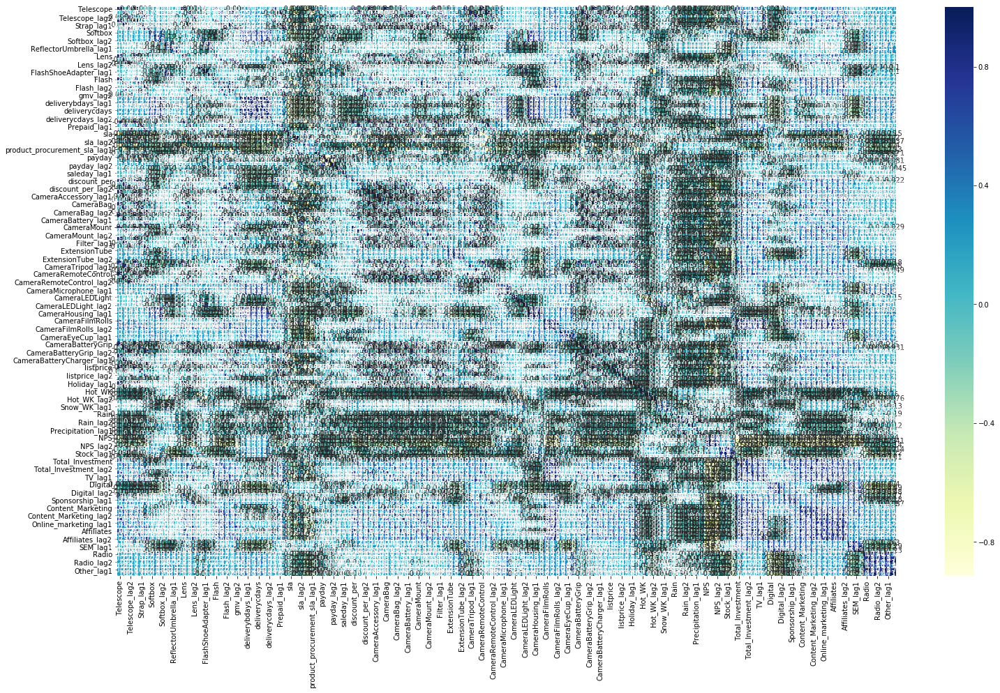

In [315]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(camera_withoutGMV.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [316]:
# Calculate the VIFs 
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Telescope,inf
109,Precipitation_lag2,inf
93,listprice_lag1,inf
94,listprice_lag2,inf
95,Holiday,inf
96,Holiday_lag1,inf
97,Holiday_lag2,inf
98,Hot_WK,inf
99,Hot_WK_lag1,inf
100,Hot_WK_lag2,inf


In [317]:
#creating the train and validation set from orignial data set
train = camera_lag[:int(0.7*(len(camera_lag)))]
test = camera_lag[int(0.7*(len(camera_lag))):]

In [318]:
#Feature selection using rFE
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE

X=train.copy()
X=X.drop('gmv',axis=1)
Y=train['gmv']
estimator_lr=LinearRegression()
rfe = RFE(estimator_lr, 15)             
rfe = rfe.fit(X,Y)

In [319]:
col_rfe = X.columns[rfe.support_]
col_rfe

Index(['Telescope', 'Strap', 'Lens', 'deliverycdays_lag1', 'Prepaid', 'Filter',
       'CameraRemoteControl', 'listprice', 'Holiday', 'Total_Investment_lag1',
       'TV_lag2', 'Digital_lag1', 'Digital_lag2', 'Affiliates_lag2', 'SEM'],
      dtype='object')

In [320]:
ranking=pd.DataFrame(list(zip(X.columns,rfe.support_,rfe.ranking_)),columns=('Feature','FistList','Rank'))
ranking. head(3)

,Feature,FistList,Rank
0,Telescope,True,1
1,Telescope_lag1,False,73
2,Telescope_lag2,False,109


In [321]:
ranking.loc[(ranking.Rank >= 2) & (ranking.Rank<=15)]

,Feature,FistList,Rank
18,Flash,False,6
47,CameraAccessory,False,4
61,Filter_lag2,False,3
62,ExtensionTube,False,14
65,CameraTripod,False,2
75,CameraLEDLight_lag1,False,9
76,CameraLEDLight_lag2,False,8
81,CameraFilmRolls_lag1,False,7
85,CameraEyeCup_lag2,False,11
101,Snow_WK,False,13


In [322]:
# Calculate the VIFs for features selected by RFE
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,listprice,4724.57
13,Affiliates_lag2,3334.09
2,Lens,2083.85
5,Filter,1957.24
9,Total_Investment_lag1,1716.96
14,SEM,1583.24
10,TV_lag2,1395.34
11,Digital_lag1,1055.27
12,Digital_lag2,866.82
4,Prepaid,729.68


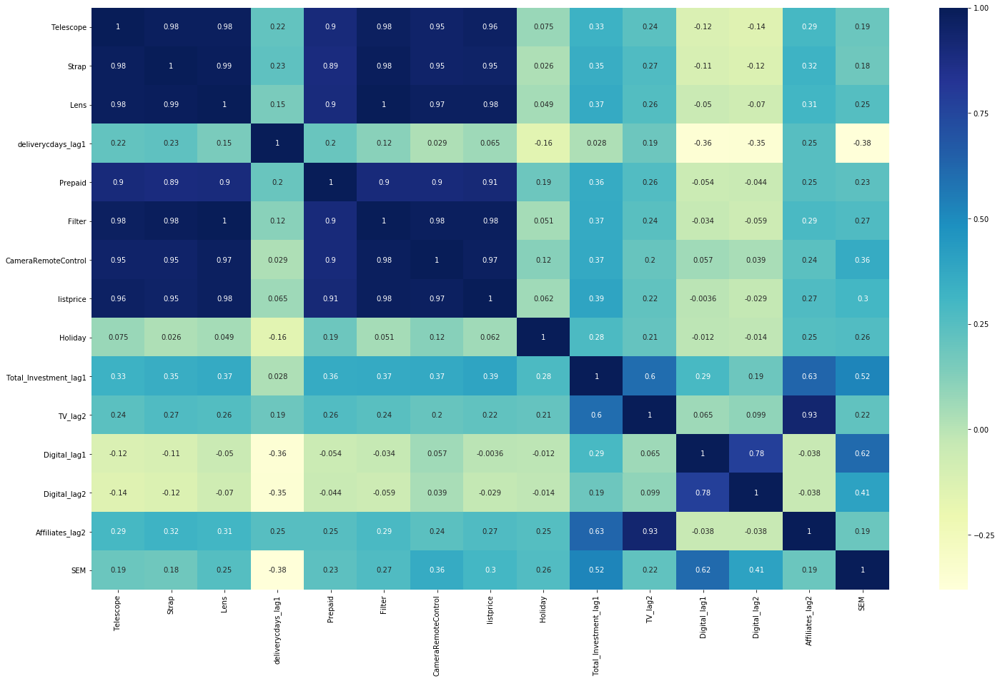

In [323]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(X.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [324]:
### Removing high VIF features
col_rfe=['Telescope', 'Lens', 'Flash', 'CameraBag', 'CameraBattery',
       'CameraMount', 'Filter', 'CameraBatteryCharger', 'listprice', 'Holiday',
       'Holiday_lag1', 'Total_Investment', 'Online_marketing_lag2',
       'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,listprice,5761.16
1,Lens,3908.70
11,Total_Investment,3875.98
13,Affiliates,3352.40
4,CameraBattery,2772.22
3,CameraBag,2204.98
6,Filter,2025.61
7,CameraBatteryCharger,990.72
12,Online_marketing_lag2,526.77
0,Telescope,209.19


In [325]:
### Removing high VIF features
col_rfe=['Telescope', 'Lens', 'Flash', 'CameraBag', 'CameraBattery',
       'CameraMount', 'Filter', 'CameraBatteryCharger','Holiday',
       'Holiday_lag1', 'Total_Investment', 'Online_marketing_lag2',
       'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Lens,3415.51
12,Affiliates,3350.40
10,Total_Investment,2988.50
3,CameraBag,2096.90
6,Filter,1859.74
4,CameraBattery,1410.70
7,CameraBatteryCharger,912.77
11,Online_marketing_lag2,526.77
0,Telescope,191.97
2,Flash,148.68


In [326]:
### Removing high VIF features
col_rfe=['Telescope', 'Lens', 'Flash', 'CameraBag', 'CameraBattery',
       'CameraMount', 'Filter', 'CameraBatteryCharger','Holiday',
       'Holiday_lag1', 'Online_marketing_lag2',
       'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Lens,3415.00
3,CameraBag,2096.34
6,Filter,1856.72
11,Affiliates,1280.20
4,CameraBattery,1133.06
7,CameraBatteryCharger,881.02
10,Online_marketing_lag2,526.16
0,Telescope,191.77
2,Flash,122.48
9,Holiday_lag1,72.00


In [327]:
### Build model using the features identified using VIF & Correlation  - manual & RFE  approach.

import statsmodels.api as sm
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m1 = sm.OLS(y,X).fit()

In [328]:
camera_lag_mul_m1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     361.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.22e-20
Time:                        21:46:39   Log-Likelihood:                 34.415
No. Observations:                  33   AIC:                            -42.83
Df Residuals:                      20   BIC:                            -23.38
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.5068      1.156      8.225      0.000       7.096      11.918
Telescope                 0.0078      0.074      0.105      0.917      -0.147       0.162
Lens                      0.2044      0.238      0.860      0.400      -0.291       0.700
Flash                     0.1230      0.037      3.304      0.004       0.045       0.201
CameraBag                 0.1842      0.168      1.098      0.285      -0.166       0.534
CameraBattery             0.5688      0.147      3.857      0.001       0.261       0.876
CameraMount              -0.0747      0.086     -0.873      0.393      -0.253       0.104
Filter                    0.0513      0.197      0.260      0.797      -0.360       0.463
CameraBatteryCharger     -0.1446      0.106     -1.365      0.187      -0.366       0.076
Holiday                   0.0116      0.018      0.657      0.518      -0.025       0.048
Holiday_lag1             -0.1348      0.108     -1.251      0.225      -0.359       0.090
Online_marketing_lag2    -0.0104      0.025     -0.408      0.687      -0.063       0.043
Affiliates               -0.0143      0.071     -0.200      0.843      -0.163       0.135
==============================================================================
Omnibus:                        1.953   Durbin-Watson:                   1.502
Prob(Omnibus):                  0.377   Jarque-Bera (JB):                1.310
Skew:                           0.488   Prob(JB):                        0.519
Kurtosis:                       3.039   Cond. No.                     1.56e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.56e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [329]:
### Removing high VIF features & high p-value
col_rfe=['Telescope', 'Lens', 'Flash', 'CameraBag', 'CameraBattery',
       'CameraMount', 'CameraBatteryCharger','Holiday',
       'Holiday_lag1', 'Online_marketing_lag2',
       'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,CameraBag,2013.12
1,Lens,1960.03
10,Affiliates,1278.02
4,CameraBattery,1120.85
6,CameraBatteryCharger,881.02
9,Online_marketing_lag2,445.16
0,Telescope,177.61
2,Flash,119.53
8,Holiday_lag1,71.63
5,CameraMount,31.86


In [330]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m2 = sm.OLS(y,X).fit()

In [331]:
camera_lag_mul_m2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     412.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           6.01e-22
Time:                        21:46:40   Log-Likelihood:                 34.359
No. Observations:                  33   AIC:                            -44.72
Df Residuals:                      21   BIC:                            -26.76
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.3174      0.877     10.619      0.000       7.493      11.142
Telescope                 0.0084      0.072      0.116      0.909      -0.142       0.159
Lens                      0.2436      0.179      1.359      0.189      -0.129       0.617
Flash                     0.1218      0.036      3.372      0.003       0.047       0.197
CameraBag                 0.1883      0.163      1.154      0.262      -0.151       0.528
CameraBattery             0.5852      0.130      4.488      0.000       0.314       0.856
CameraMount              -0.0782      0.083     -0.947      0.354      -0.250       0.093
CameraBatteryCharger     -0.1401      0.102     -1.371      0.185      -0.353       0.072
Holiday                   0.0110      0.017      0.641      0.528      -0.025       0.046
Holiday_lag1             -0.1394      0.104     -1.343      0.194      -0.355       0.076
Online_marketing_lag2    -0.0122      0.024     -0.511      0.614      -0.062       0.037
Affiliates               -0.0061      0.063     -0.097      0.924      -0.136       0.124
==============================================================================
Omnibus:                        2.559   Durbin-Watson:                   1.503
Prob(Omnibus):                  0.278   Jarque-Bera (JB):                1.703
Skew:                           0.551   Prob(JB):                        0.427
Kurtosis:                       3.148   Cond. No.                     1.18e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.18e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [332]:
### Removing high VIF features & high p-value
col_rfe=['Telescope', 'Lens', 'Flash', 'CameraBattery',
       'CameraMount', 'CameraBatteryCharger','Holiday',
       'Holiday_lag1', 'Online_marketing_lag2',
       'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,Affiliates,1215.04
3,CameraBattery,1059.86
1,Lens,856.00
5,CameraBatteryCharger,670.23
8,Online_marketing_lag2,433.52
0,Telescope,160.54
2,Flash,112.54
7,Holiday_lag1,71.36
4,CameraMount,31.24
6,Holiday,1.38


In [333]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m3 = sm.OLS(y,X).fit()

In [334]:
camera_lag_mul_m3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     447.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.21e-23
Time:                        21:46:40   Log-Likelihood:                 33.346
No. Observations:                  33   AIC:                            -44.69
Df Residuals:                      22   BIC:                            -28.23
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.4409      0.877     10.760      0.000       7.621      11.260
Telescope                 0.0199      0.072      0.275      0.786      -0.130       0.169
Lens                      0.4111      0.106      3.879      0.001       0.191       0.631
Flash                     0.1194      0.036      3.286      0.003       0.044       0.195
CameraBattery             0.5953      0.131      4.542      0.000       0.324       0.867
CameraMount              -0.0578      0.081     -0.712      0.484      -0.226       0.111
CameraBatteryCharger     -0.1397      0.103     -1.357      0.189      -0.353       0.074
Holiday                   0.0091      0.017      0.529      0.602      -0.026       0.045
Holiday_lag1             -0.1535      0.104     -1.478      0.153      -0.369       0.062
Online_marketing_lag2    -0.0144      0.024     -0.600      0.555      -0.064       0.035
Affiliates               -0.0209      0.062     -0.339      0.738      -0.149       0.107
==============================================================================
Omnibus:                        2.005   Durbin-Watson:                   1.546
Prob(Omnibus):                  0.367   Jarque-Bera (JB):                1.148
Skew:                           0.442   Prob(JB):                        0.563
Kurtosis:                       3.229   Cond. No.                     1.14e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.14e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [335]:
### Removing high VIF features & high p-value
col_rfe=['Lens', 'Flash', 'CameraBattery',
       'CameraMount', 'CameraBatteryCharger','Holiday',
       'Holiday_lag1', 'Online_marketing_lag2',
       'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,Affiliates,1185.48
2,CameraBattery,1056.79
0,Lens,729.25
4,CameraBatteryCharger,570.63
7,Online_marketing_lag2,430.18
1,Flash,110.17
6,Holiday_lag1,70.05
3,CameraMount,30.09
5,Holiday,1.25


In [336]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m4 = sm.OLS(y,X).fit()

In [337]:
camera_lag_mul_m4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     517.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.29e-24
Time:                        21:46:40   Log-Likelihood:                 33.289
No. Observations:                  33   AIC:                            -46.58
Df Residuals:                      23   BIC:                            -31.61
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.4716      0.853     11.109      0.000       7.708      11.235
Lens                      0.4237      0.094      4.526      0.000       0.230       0.617
Flash                     0.1202      0.035      3.387      0.003       0.047       0.194
CameraBattery             0.5983      0.128      4.675      0.000       0.334       0.863
CameraMount              -0.0489      0.073     -0.670      0.509      -0.200       0.102
CameraBatteryCharger     -0.1433      0.100     -1.433      0.165      -0.350       0.064
Holiday                   0.0087      0.017      0.519      0.609      -0.026       0.043
Holiday_lag1             -0.1543      0.102     -1.517      0.143      -0.365       0.056
Online_marketing_lag2    -0.0156      0.023     -0.679      0.504      -0.063       0.032
Affiliates               -0.0244      0.059     -0.412      0.684      -0.147       0.098
==============================================================================
Omnibus:                        2.202   Durbin-Watson:                   1.494
Prob(Omnibus):                  0.333   Jarque-Bera (JB):                1.216
Skew:                           0.440   Prob(JB):                        0.544
Kurtosis:                       3.333   Cond. No.                     1.12e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.12e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [338]:
### Removing high VIF features & high p-value
col_rfe=['Lens', 'Flash', 'CameraBattery',
        'CameraBatteryCharger','Holiday',
       'Holiday_lag1', 'Online_marketing_lag2',
       'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,Affiliates,1172.54
2,CameraBattery,940.94
0,Lens,717.84
3,CameraBatteryCharger,559.01
6,Online_marketing_lag2,415.35
5,Holiday_lag1,66.31
1,Flash,57.37
4,Holiday,1.24


In [339]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m5 = sm.OLS(y,X).fit()

In [340]:
camera_lag_mul_m5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     595.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.12e-25
Time:                        21:46:40   Log-Likelihood:                 32.970
No. Observations:                  33   AIC:                            -47.94
Df Residuals:                      24   BIC:                            -34.47
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.7117      0.765     12.699      0.000       8.133      11.290
Lens                      0.4475      0.086      5.224      0.000       0.271       0.624
Flash                     0.1112      0.032      3.424      0.002       0.044       0.178
CameraBattery             0.5733      0.121      4.737      0.000       0.324       0.823
CameraBatteryCharger     -0.1750      0.087     -2.007      0.056      -0.355       0.005
Holiday                   0.0027      0.014      0.192      0.850      -0.026       0.031
Holiday_lag1             -0.1737      0.096     -1.802      0.084      -0.373       0.025
Online_marketing_lag2    -0.0170      0.023     -0.748      0.462      -0.064       0.030
Affiliates               -0.0319      0.058     -0.555      0.584      -0.151       0.087
==============================================================================
Omnibus:                        3.935   Durbin-Watson:                   1.434
Prob(Omnibus):                  0.140   Jarque-Bera (JB):                2.527
Skew:                           0.609   Prob(JB):                        0.283
Kurtosis:                       3.595   Cond. No.                     1.01e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.01e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [341]:
### Removing high VIF features & high p-value
col_rfe=['Lens', 'Flash', 'CameraBattery',
        'CameraBatteryCharger','Holiday_lag1', 'Online_marketing_lag2',
       'Affiliates']

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Affiliates,1171.62
2,CameraBattery,939.60
0,Lens,706.79
3,CameraBatteryCharger,546.51
5,Online_marketing_lag2,411.54
4,Holiday_lag1,65.33
1,Flash,49.96


In [342]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m6 = sm.OLS(y,X).fit()

In [343]:
camera_lag_mul_m6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.994
Method:                 Least Squares   F-statistic:                     708.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.11e-27
Time:                        21:46:40   Log-Likelihood:                 32.944
No. Observations:                  33   AIC:                            -49.89
Df Residuals:                      25   BIC:                            -37.92
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.6356      0.641     15.041      0.000       8.316      10.955
Lens                      0.4489      0.084      5.364      0.000       0.277       0.621
Flash                     0.1107      0.032      3.487      0.002       0.045       0.176
CameraBattery             0.5777      0.117      4.958      0.000       0.338       0.818
CameraBatteryCharger     -0.1771      0.085     -2.090      0.047      -0.352      -0.003
Holiday_lag1             -0.1761      0.094     -1.878      0.072      -0.369       0.017
Online_marketing_lag2    -0.0170      0.022     -0.763      0.452      -0.063       0.029
Affiliates               -0.0279      0.053     -0.531      0.600      -0.136       0.080
==============================================================================
Omnibus:                        3.721   Durbin-Watson:                   1.431
Prob(Omnibus):                  0.156   Jarque-Bera (JB):                2.359
Skew:                           0.593   Prob(JB):                        0.307
Kurtosis:                       3.555   Cond. No.                         863.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [344]:
### Removing high VIF features & high p-value
col_rfe=['Lens', 'Flash', 'CameraBattery',
        'Holiday_lag1', 'Online_marketing_lag2',
       'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Affiliates,1082.62
2,CameraBattery,674.20
0,Lens,594.50
4,Online_marketing_lag2,403.75
3,Holiday_lag1,55.97
1,Flash,48.41


In [345]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m7 = sm.OLS(y,X).fit()

In [346]:
camera_lag_mul_m7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     730.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.08e-27
Time:                        21:46:40   Log-Likelihood:                 30.288
No. Observations:                  33   AIC:                            -46.58
Df Residuals:                      26   BIC:                            -36.10
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.6028      0.681     14.109      0.000       8.204      11.002
Lens                      0.3858      0.083      4.651      0.000       0.215       0.556
Flash                     0.0827      0.031      2.703      0.012       0.020       0.146
CameraBattery             0.4392      0.102      4.312      0.000       0.230       0.649
Holiday_lag1             -0.2401      0.094     -2.551      0.017      -0.434      -0.047
Online_marketing_lag2    -0.0244      0.023     -1.046      0.305      -0.072       0.024
Affiliates                0.0191      0.051      0.377      0.709      -0.085       0.123
==============================================================================
Omnibus:                        2.126   Durbin-Watson:                   1.591
Prob(Omnibus):                  0.345   Jarque-Bera (JB):                1.480
Skew:                           0.519   Prob(JB):                        0.477
Kurtosis:                       3.019   Cond. No.                         841.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [347]:
### Removing high VIF features & high p-value
col_rfe=['Lens', 'Flash', 'CameraBattery',
        'Holiday_lag1', 'Online_marketing_lag2'
       ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Lens,593.75
2,CameraBattery,488.78
4,Online_marketing_lag2,123.60
3,Holiday_lag1,51.82
1,Flash,40.67


In [348]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m8 = sm.OLS(y,X).fit()

In [349]:
camera_lag_mul_m8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.994
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     905.7
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           3.62e-29
Time:                        21:46:41   Log-Likelihood:                 30.198
No. Observations:                  33   AIC:                            -48.40
Df Residuals:                      27   BIC:                            -39.42
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.7347      0.575     16.938      0.000       8.555      10.914
Lens                      0.3878      0.081      4.763      0.000       0.221       0.555
Flash                     0.0902      0.023      3.961      0.000       0.043       0.137
CameraBattery             0.4434      0.100      4.449      0.000       0.239       0.648
Holiday_lag1             -0.2499      0.089     -2.804      0.009      -0.433      -0.067
Online_marketing_lag2    -0.0202      0.020     -1.001      0.326      -0.062       0.021
==============================================================================
Omnibus:                        2.030   Durbin-Watson:                   1.544
Prob(Omnibus):                  0.362   Jarque-Bera (JB):                1.350
Skew:                           0.495   Prob(JB):                        0.509
Kurtosis:                       3.060   Cond. No.                         574.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [350]:
### Removing high VIF features & high p-value. Adding next set of features
col_rfe=['deliverybdays_lag1','Prepaid','CameraAccessory','CameraAccessory_lag2','CameraBattery_lag2','CameraRemoteControl',
         'listprice_lag2','Hot_WK_lag2','Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Total_Investment_lag2','Digital_lag1',
         'Lens', 'Flash', 'CameraBattery',
        'Holiday_lag1', 'Online_marketing_lag2' ]

vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,Total_Investment_lag2,5905.03
18,Online_marketing_lag2,2882.52
6,listprice_lag2,2671.72
16,CameraBattery,1769.09
14,Lens,1322.22
1,Prepaid,589.50
13,Digital_lag1,522.15
5,CameraRemoteControl,239.50
2,CameraAccessory,207.50
15,Flash,110.88


In [351]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m9 = sm.OLS(y,X).fit()

In [352]:
camera_lag_mul_m9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     764.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           8.89e-17
Time:                        21:46:41   Log-Likelihood:                 61.407
No. Observations:                  33   AIC:                            -82.81
Df Residuals:                      13   BIC:                            -52.88
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    10.5024      1.041     10.087      0.000       8.253      12.752
deliverybdays_lag1       -0.0005      0.008     -0.062      0.951      -0.018       0.017
Prepaid                   0.4347      0.110      3.942      0.002       0.196       0.673
CameraAccessory           0.0802      0.047      1.713      0.110      -0.021       0.181
CameraAccessory_lag2      0.0299      0.036      0.825      0.424      -0.048       0.108
CameraBattery_lag2       -0.0053      0.016     -0.329      0.747      -0.040       0.029
CameraRemoteControl       0.0526      0.052      1.006      0.333      -0.060       0.165
listprice_lag2           -0.0834      0.064     -1.313      0.212      -0.221       0.054
Hot_WK_lag2               0.0022      0.006      0.380      0.710      -0.010       0.015
Snow_WK                  -0.0099      0.006     -1.694      0.114      -0.023       0.003
Snow_WK_lag2             -0.0072      0.005     -1.448      0.171      -0.018       0.004
Rain_lag1                -0.0080      0.004     -2.057      0.060      -0.016       0.000
Rain_lag2                 0.0005      0.004      0.148      0.884      -0.007       0.008
Total_Investment_lag2    -0.0632      0.060     -1.059      0.309      -0.192       0.066
Digital_lag1              0.0111      0.017      0.659      0.521      -0.025       0.047
Lens                      0.1969      0.071      2.754      0.016       0.042       0.351
Flash                     0.0603      0.022      2.762      0.016       0.013       0.108
CameraBattery             0.0478      0.098      0.488      0.633      -0.164       0.259
Holiday_lag1             -0.1311      0.075     -1.752      0.103      -0.293       0.031
Online_marketing_lag2     0.0691      0.042      1.662      0.120      -0.021       0.159
==============================================================================
Omnibus:                        1.229   Durbin-Watson:                   2.558
Prob(Omnibus):                  0.541   Jarque-Bera (JB):                0.613
Skew:                          -0.327   Prob(JB):                        0.736
Kurtosis:                       3.137   Cond. No.                     3.55e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.55e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [353]:
### Removing high VIF features & high p-value
col_rfe=['deliverybdays_lag1','Prepaid','CameraAccessory','CameraAccessory_lag2','CameraBattery_lag2','CameraRemoteControl',
         'listprice_lag2','Hot_WK_lag2','Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1',
         'Lens', 'Flash', 'CameraBattery',
        'Holiday_lag1', 'Online_marketing_lag2' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,listprice_lag2,2262.53
15,CameraBattery,1724.96
13,Lens,1311.86
17,Online_marketing_lag2,1059.78
1,Prepaid,558.20
12,Digital_lag1,371.83
5,CameraRemoteControl,239.43
2,CameraAccessory,200.34
14,Flash,109.69
16,Holiday_lag1,64.04


In [354]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m10 = sm.OLS(y,X).fit()
camera_lag_mul_m10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     800.0
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.21e-18
Time:                        21:46:41   Log-Likelihood:                 60.042
No. Observations:                  33   AIC:                            -82.08
Df Residuals:                      14   BIC:                            -53.65
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.7459      0.761     12.814      0.000       8.115      11.377
deliverybdays_lag1       -0.0006      0.008     -0.075      0.941      -0.018       0.017
Prepaid                   0.4316      0.111      3.899      0.002       0.194       0.669
CameraAccessory           0.0682      0.046      1.494      0.157      -0.030       0.166
CameraAccessory_lag2      0.0181      0.035      0.523      0.609      -0.056       0.093
CameraBattery_lag2       -0.0014      0.016     -0.089      0.930      -0.035       0.032
CameraRemoteControl       0.0273      0.047      0.585      0.568      -0.073       0.127
listprice_lag2           -0.0640      0.061     -1.048      0.312      -0.195       0.067
Hot_WK_lag2               0.0021      0.006      0.358      0.726      -0.010       0.015
Snow_WK                  -0.0065      0.005     -1.323      0.207      -0.017       0.004
Snow_WK_lag2             -0.0044      0.004     -1.041      0.315      -0.014       0.005
Rain_lag1                -0.0077      0.004     -1.969      0.069      -0.016       0.001
Rain_lag2                 0.0012      0.004      0.318      0.755      -0.007       0.009
Digital_lag1              0.0046      0.016      0.291      0.775      -0.029       0.038
Lens                      0.2109      0.071      2.990      0.010       0.060       0.362
Flash                     0.0535      0.021      2.553      0.023       0.009       0.098
CameraBattery             0.0908      0.089      1.015      0.327      -0.101       0.283
Holiday_lag1             -0.1150      0.074     -1.563      0.140      -0.273       0.043
Online_marketing_lag2     0.0316      0.022      1.445      0.170      -0.015       0.078
==============================================================================
Omnibus:                        4.893   Durbin-Watson:                   2.354
Prob(Omnibus):                  0.087   Jarque-Bera (JB):                3.328
Skew:                          -0.656   Prob(JB):                        0.189
Kurtosis:                       3.835   Cond. No.                     2.28e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.28e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [355]:
### Removing high VIF features & high p-value
col_rfe=['deliverybdays_lag1','Prepaid','CameraAccessory','CameraAccessory_lag2','CameraBattery_lag2','CameraRemoteControl',
         'Hot_WK_lag2','Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1',
         'Lens', 'Flash', 'CameraBattery',
        'Holiday_lag1', 'Online_marketing_lag2' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,CameraBattery,1465.06
12,Lens,1257.95
16,Online_marketing_lag2,602.79
1,Prepaid,526.91
11,Digital_lag1,328.70
2,CameraAccessory,198.97
5,CameraRemoteControl,193.68
13,Flash,89.16
15,Holiday_lag1,63.93
4,CameraBattery_lag2,49.94


In [356]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m11 = sm.OLS(y,X).fit()
camera_lag_mul_m11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     841.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.95e-19
Time:                        21:46:41   Log-Likelihood:                 58.796
No. Observations:                  33   AIC:                            -81.59
Df Residuals:                      15   BIC:                            -54.65
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.1958      0.552     16.652      0.000       8.019      10.373
deliverybdays_lag1        0.0004      0.008      0.047      0.963      -0.017       0.018
Prepaid                   0.4168      0.110      3.784      0.002       0.182       0.652
CameraAccessory           0.0731      0.046      1.605      0.129      -0.024       0.170
CameraAccessory_lag2     -0.0160      0.012     -1.340      0.200      -0.041       0.009
CameraBattery_lag2        0.0104      0.011      0.938      0.363      -0.013       0.034
CameraRemoteControl       0.0229      0.047      0.491      0.631      -0.077       0.122
Hot_WK_lag2               0.0020      0.006      0.350      0.731      -0.010       0.014
Snow_WK                  -0.0066      0.005     -1.339      0.200      -0.017       0.004
Snow_WK_lag2             -0.0030      0.004     -0.737      0.473      -0.012       0.006
Rain_lag1                -0.0083      0.004     -2.162      0.047      -0.017      -0.000
Rain_lag2                 0.0006      0.004      0.161      0.874      -0.007       0.008
Digital_lag1              0.0076      0.015      0.494      0.629      -0.025       0.041
Lens                      0.2287      0.069      3.328      0.005       0.082       0.375
Flash                     0.0552      0.021      2.635      0.019       0.011       0.100
CameraBattery             0.0743      0.088      0.841      0.414      -0.114       0.263
Holiday_lag1             -0.1274      0.073     -1.749      0.101      -0.283       0.028
Online_marketing_lag2     0.0206      0.019      1.069      0.302      -0.020       0.062
==============================================================================
Omnibus:                        2.557   Durbin-Watson:                   2.474
Prob(Omnibus):                  0.278   Jarque-Bera (JB):                1.467
Skew:                          -0.479   Prob(JB):                        0.480
Kurtosis:                       3.388   Cond. No.                     1.51e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.51e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [357]:
### Removing high VIF features & high p-value
col_rfe=['deliverybdays_lag1','Prepaid','CameraAccessory','CameraAccessory_lag2','CameraBattery_lag2','CameraRemoteControl',
         'Hot_WK_lag2','Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1',
         'Lens', 'Flash', 'Holiday_lag1', 'Online_marketing_lag2' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,Lens,1042.79
15,Online_marketing_lag2,565.62
1,Prepaid,381.76
11,Digital_lag1,304.14
2,CameraAccessory,193.00
5,CameraRemoteControl,184.81
13,Flash,84.71
4,CameraBattery_lag2,48.37
14,Holiday_lag1,46.37
3,CameraAccessory_lag2,16.81


In [358]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m12 = sm.OLS(y,X).fit()
camera_lag_mul_m12.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     910.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.34e-20
Time:                        21:46:41   Log-Likelihood:                 58.036
No. Observations:                  33   AIC:                            -82.07
Df Residuals:                      16   BIC:                            -56.63
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     9.2622      0.542     17.104      0.000       8.114      10.410
deliverybdays_lag1       -0.0012      0.008     -0.150      0.883      -0.018       0.016
Prepaid                   0.4645      0.093      4.969      0.000       0.266       0.663
CameraAccessory           0.0694      0.045      1.545      0.142      -0.026       0.165
CameraAccessory_lag2     -0.0167      0.012     -1.419      0.175      -0.042       0.008
CameraBattery_lag2        0.0117      0.011      1.080      0.296      -0.011       0.035
CameraRemoteControl       0.0267      0.046      0.581      0.569      -0.071       0.124
Hot_WK_lag2               0.0035      0.006      0.623      0.542      -0.008       0.015
Snow_WK                  -0.0050      0.004     -1.110      0.284      -0.014       0.005
Snow_WK_lag2             -0.0021      0.004     -0.538      0.598      -0.010       0.006
Rain_lag1                -0.0086      0.004     -2.267      0.038      -0.017      -0.001
Rain_lag2                 0.0007      0.004      0.185      0.855      -0.007       0.008
Digital_lag1              0.0092      0.015      0.603      0.555      -0.023       0.041
Lens                      0.2456      0.065      3.773      0.002       0.108       0.384
Flash                     0.0505      0.020      2.525      0.023       0.008       0.093
Holiday_lag1             -0.1340      0.072     -1.867      0.080      -0.286       0.018
Online_marketing_lag2     0.0204      0.019      1.070      0.300      -0.020       0.061
==============================================================================
Omnibus:                        2.271   Durbin-Watson:                   2.390
Prob(Omnibus):                  0.321   Jarque-Bera (JB):                1.114
Skew:                          -0.262   Prob(JB):                        0.573
Kurtosis:                       3.732   Cond. No.                     1.46e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.46e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [359]:
### Removing high VIF features & high p-value
col_rfe=['deliverybdays_lag1','Prepaid','CameraAccessory','CameraAccessory_lag2','CameraBattery_lag2','CameraRemoteControl',
         'Hot_WK_lag2','Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1',
         'Lens', 'Flash', 'Holiday_lag1' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,Lens,637.09
1,Prepaid,371.98
11,Digital_lag1,180.20
5,CameraRemoteControl,159.08
2,CameraAccessory,148.45
13,Flash,76.39
4,CameraBattery_lag2,46.39
14,Holiday_lag1,39.10
7,Snow_WK,14.08
3,CameraAccessory_lag2,12.64


In [360]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m13 = sm.OLS(y,X).fit()
camera_lag_mul_m13.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.998
Method:                 Least Squares   F-statistic:                     963.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.26e-22
Time:                        21:46:42   Log-Likelihood:                 56.895
No. Observations:                  33   AIC:                            -81.79
Df Residuals:                      17   BIC:                            -57.85
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    9.5958      0.445     21.575      0.000       8.657      10.534
deliverybdays_lag1      -0.0007      0.008     -0.082      0.936      -0.017       0.016
Prepaid                  0.4330      0.089      4.860      0.000       0.245       0.621
CameraAccessory          0.0633      0.045      1.415      0.175      -0.031       0.158
CameraAccessory_lag2    -0.0085      0.009     -0.947      0.357      -0.028       0.010
CameraBattery_lag2       0.0067      0.010      0.684      0.503      -0.014       0.027
CameraRemoteControl      0.0327      0.046      0.712      0.486      -0.064       0.129
Hot_WK_lag2              0.0028      0.006      0.499      0.624      -0.009       0.014
Snow_WK                 -0.0053      0.004     -1.190      0.251      -0.015       0.004
Snow_WK_lag2            -0.0022      0.004     -0.577      0.571      -0.010       0.006
Rain_lag1               -0.0093      0.004     -2.451      0.025      -0.017      -0.001
Rain_lag2                0.0003      0.004      0.086      0.933      -0.007       0.008
Digital_lag1             0.0121      0.015      0.805      0.432      -0.020       0.044
Lens                     0.2603      0.064      4.073      0.001       0.125       0.395
Flash                    0.0634      0.016      3.954      0.001       0.030       0.097
Holiday_lag1            -0.1539      0.070     -2.211      0.041      -0.301      -0.007
==============================================================================
Omnibus:                        1.864   Durbin-Watson:                   2.183
Prob(Omnibus):                  0.394   Jarque-Bera (JB):                0.883
Skew:                          -0.342   Prob(JB):                        0.643
Kurtosis:                       3.417   Cond. No.                     1.01e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.01e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [361]:
### Removing high VIF features & high p-value
col_rfe=['deliverybdays_lag1','CameraAccessory','CameraAccessory_lag2','CameraBattery_lag2','CameraRemoteControl',
         'Hot_WK_lag2','Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1',
         'Lens', 'Flash', 'Holiday_lag1' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,Lens,549.11
1,CameraAccessory,147.88
4,CameraRemoteControl,147.39
10,Digital_lag1,135.78
12,Flash,72.47
3,CameraBattery_lag2,46.03
13,Holiday_lag1,29.62
6,Snow_WK,13.98
2,CameraAccessory_lag2,12.26
7,Snow_WK_lag2,9.47


In [362]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m14 = sm.OLS(y,X).fit()
camera_lag_mul_m14.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     456.6
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.35e-20
Time:                        21:46:42   Log-Likelihood:                 42.523
No. Observations:                  33   AIC:                            -55.05
Df Residuals:                      18   BIC:                            -32.60
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   11.1843      0.453     24.686      0.000      10.232      12.136
deliverybdays_lag1       0.0082      0.012      0.710      0.487      -0.016       0.033
CameraAccessory          0.1903      0.055      3.487      0.003       0.076       0.305
CameraAccessory_lag2    -0.0134      0.013     -1.000      0.331      -0.042       0.015
CameraBattery_lag2       0.0026      0.015      0.174      0.864      -0.028       0.033
CameraRemoteControl      0.1425      0.060      2.376      0.029       0.016       0.268
Hot_WK_lag2             -0.0004      0.008     -0.051      0.960      -0.018       0.017
Snow_WK                 -0.0131      0.006     -2.088      0.051      -0.026    8.19e-05
Snow_WK_lag2            -0.0078      0.006     -1.396      0.180      -0.019       0.004
Rain_lag1               -0.0164      0.005     -3.128      0.006      -0.027      -0.005
Rain_lag2                0.0014      0.005      0.259      0.798      -0.010       0.013
Digital_lag1             0.0083      0.023      0.369      0.717      -0.039       0.056
Lens                     0.3344      0.093      3.587      0.002       0.139       0.530
Flash                    0.0979      0.022      4.529      0.000       0.053       0.143
Holiday_lag1            -0.3830      0.077     -4.978      0.000      -0.545      -0.221
==============================================================================
Omnibus:                        2.713   Durbin-Watson:                   1.867
Prob(Omnibus):                  0.258   Jarque-Bera (JB):                2.343
Skew:                          -0.553   Prob(JB):                        0.310
Kurtosis:                       2.306   Cond. No.                         659.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [363]:
### Removing high VIF features & high p-value
col_rfe=['deliverybdays_lag1','CameraAccessory','CameraAccessory_lag2','CameraRemoteControl',
         'Hot_WK_lag2','Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1',
         'Lens', 'Flash', 'Holiday_lag1' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,Lens,549.07
3,CameraRemoteControl,147.38
1,CameraAccessory,145.61
9,Digital_lag1,133.88
11,Flash,65.02
12,Holiday_lag1,26.55
5,Snow_WK,13.98
6,Snow_WK_lag2,9.34
0,deliverybdays_lag1,4.34
2,CameraAccessory_lag2,3.04


In [364]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m15 = sm.OLS(y,X).fit()
camera_lag_mul_m15.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     518.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           2.31e-21
Time:                        21:46:42   Log-Likelihood:                 42.496
No. Observations:                  33   AIC:                            -56.99
Df Residuals:                      19   BIC:                            -36.04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   11.2031      0.429     26.137      0.000      10.306      12.100
deliverybdays_lag1       0.0081      0.011      0.715      0.483      -0.016       0.032
CameraAccessory          0.1919      0.052      3.668      0.002       0.082       0.301
CameraAccessory_lag2    -0.0114      0.006     -1.786      0.090      -0.025       0.002
CameraRemoteControl      0.1444      0.057      2.515      0.021       0.024       0.265
Hot_WK_lag2             -0.0003      0.008     -0.041      0.968      -0.017       0.016
Snow_WK                 -0.0131      0.006     -2.148      0.045      -0.026      -0.000
Snow_WK_lag2            -0.0078      0.005     -1.434      0.168      -0.019       0.004
Rain_lag1               -0.0162      0.005     -3.256      0.004      -0.027      -0.006
Rain_lag2                0.0017      0.005      0.345      0.734      -0.009       0.012
Digital_lag1             0.0078      0.022      0.357      0.725      -0.038       0.053
Lens                     0.3302      0.088      3.763      0.001       0.147       0.514
Flash                    0.0995      0.019      5.170      0.000       0.059       0.140
Holiday_lag1            -0.3836      0.075     -5.123      0.000      -0.540      -0.227
==============================================================================
Omnibus:                        2.723   Durbin-Watson:                   1.849
Prob(Omnibus):                  0.256   Jarque-Bera (JB):                2.359
Skew:                          -0.557   Prob(JB):                        0.307
Kurtosis:                       2.311   Cond. No.                         617.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [365]:
### Removing high VIF features & high p-value
col_rfe=['CameraAccessory','CameraAccessory_lag2','CameraRemoteControl',
         'Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1','Hot_WK_lag2',
         'Lens', 'Flash', 'Holiday_lag1' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,Lens,398.93
0,CameraAccessory,141.91
2,CameraRemoteControl,129.80
7,Digital_lag1,110.46
10,Flash,57.24
11,Holiday_lag1,26.36
3,Snow_WK,13.95
4,Snow_WK_lag2,9.30
1,CameraAccessory_lag2,2.86
6,Rain_lag2,1.66


In [366]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m16 = sm.OLS(y,X).fit()
camera_lag_mul_m16.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     575.3
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.20e-22
Time:                        21:46:42   Log-Likelihood:                 42.057
No. Observations:                  33   AIC:                            -58.11
Df Residuals:                      20   BIC:                            -38.66
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   11.1490      0.417     26.754      0.000      10.280      12.018
CameraAccessory          0.1830      0.050      3.646      0.002       0.078       0.288
CameraAccessory_lag2    -0.0099      0.006     -1.664      0.112      -0.022       0.003
CameraRemoteControl      0.1550      0.055      2.831      0.010       0.041       0.269
Snow_WK                 -0.0123      0.006     -2.074      0.051      -0.025    7.11e-05
Snow_WK_lag2            -0.0057      0.005     -1.259      0.222      -0.015       0.004
Rain_lag1               -0.0154      0.005     -3.217      0.004      -0.025      -0.005
Rain_lag2                0.0018      0.005      0.372      0.714      -0.008       0.012
Digital_lag1             0.0067      0.021      0.311      0.759      -0.038       0.051
Hot_WK_lag2           3.532e-05      0.008      0.004      0.996      -0.016       0.017
Lens                     0.3330      0.087      3.845      0.001       0.152       0.514
Flash                    0.0991      0.019      5.219      0.000       0.060       0.139
Holiday_lag1            -0.3896      0.074     -5.300      0.000      -0.543      -0.236
==============================================================================
Omnibus:                        2.588   Durbin-Watson:                   1.981
Prob(Omnibus):                  0.274   Jarque-Bera (JB):                2.293
Skew:                          -0.559   Prob(JB):                        0.318
Kurtosis:                       2.353   Cond. No.                         570.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [367]:
### Removing high VIF features & high p-value
col_rfe=['CameraAccessory_lag2','CameraRemoteControl',
         'Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1','Hot_WK_lag2',
         'Lens', 'Flash', 'Holiday_lag1' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,Lens,293.46
1,CameraRemoteControl,112.95
6,Digital_lag1,107.81
9,Flash,55.77
10,Holiday_lag1,25.28
2,Snow_WK,12.91
3,Snow_WK_lag2,9.30
0,CameraAccessory_lag2,2.84
5,Rain_lag2,1.65
4,Rain_lag1,1.51


In [368]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m17 = sm.OLS(y,X).fit()
camera_lag_mul_m17.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     395.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           9.44e-22
Time:                        21:46:42   Log-Likelihood:                 33.647
No. Observations:                  33   AIC:                            -43.29
Df Residuals:                      21   BIC:                            -25.34
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   10.8932      0.517     21.060      0.000       9.818      11.969
CameraAccessory_lag2    -0.0076      0.007     -1.017      0.321      -0.023       0.008
CameraRemoteControl      0.2099      0.066      3.166      0.005       0.072       0.348
Snow_WK                 -0.0060      0.007     -0.845      0.408      -0.021       0.009
Snow_WK_lag2            -0.0063      0.006     -1.107      0.281      -0.018       0.006
Rain_lag1               -0.0211      0.006     -3.707      0.001      -0.033      -0.009
Rain_lag2               -0.0003      0.006     -0.048      0.962      -0.013       0.012
Digital_lag1             0.0064      0.027      0.237      0.815      -0.050       0.063
Hot_WK_lag2             -0.0060      0.010     -0.618      0.544      -0.026       0.014
Lens                     0.4550      0.101      4.524      0.000       0.246       0.664
Flash                    0.0852      0.023      3.637      0.002       0.036       0.134
Holiday_lag1            -0.4023      0.092     -4.351      0.000      -0.595      -0.210
==============================================================================
Omnibus:                        7.830   Durbin-Watson:                   1.131
Prob(Omnibus):                  0.020   Jarque-Bera (JB):                6.374
Skew:                          -0.861   Prob(JB):                       0.0413
Kurtosis:                       4.293   Cond. No.                         555.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [369]:
### Removing high VIF features & high p-value
col_rfe=['CameraRemoteControl',
         'Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1','Hot_WK_lag2',
         'Lens', 'Flash', 'Holiday_lag1' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,Lens,290.39
5,Digital_lag1,104.73
0,CameraRemoteControl,98.34
8,Flash,52.31
9,Holiday_lag1,25.16
1,Snow_WK,12.85
2,Snow_WK_lag2,9.26
4,Rain_lag2,1.59
3,Rain_lag1,1.51
6,Hot_WK_lag2,1.25


In [370]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m18 = sm.OLS(y,X).fit()
camera_lag_mul_m18.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.993
Method:                 Least Squares   F-statistic:                     433.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.23e-23
Time:                        21:46:42   Log-Likelihood:                 32.854
No. Observations:                  33   AIC:                            -43.71
Df Residuals:                      22   BIC:                            -27.25
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                  10.9550      0.514     21.311      0.000       9.889      12.021
CameraRemoteControl     0.2312      0.063      3.674      0.001       0.101       0.362
Snow_WK                -0.0070      0.007     -0.993      0.332      -0.022       0.008
Snow_WK_lag2           -0.0069      0.006     -1.209      0.240      -0.019       0.005
Rain_lag1              -0.0210      0.006     -3.675      0.001      -0.033      -0.009
Rain_lag2              -0.0020      0.006     -0.342      0.736      -0.014       0.010
Digital_lag1           -0.0013      0.026     -0.048      0.962      -0.055       0.053
Hot_WK_lag2            -0.0056      0.010     -0.578      0.569      -0.026       0.015
Lens                    0.4461      0.100      4.449      0.000       0.238       0.654
Flash                   0.0800      0.023      3.497      0.002       0.033       0.127
Holiday_lag1           -0.4097      0.092     -4.442      0.000      -0.601      -0.218
==============================================================================
Omnibus:                        9.741   Durbin-Watson:                   1.074
Prob(Omnibus):                  0.008   Jarque-Bera (JB):                8.635
Skew:                          -1.009   Prob(JB):                       0.0133
Kurtosis:                       4.487   Cond. No.                         546.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [371]:
### Removing high VIF features & high p-value
col_rfe=['Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1','Hot_WK_lag2',
         'Lens', 'Flash', 'Holiday_lag1' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Lens,205.10
4,Digital_lag1,104.65
7,Flash,51.81
8,Holiday_lag1,24.61
0,Snow_WK,12.66
1,Snow_WK_lag2,9.15
3,Rain_lag2,1.58
2,Rain_lag1,1.43
5,Hot_WK_lag2,1.22


In [372]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m19 = sm.OLS(y,X).fit()
camera_lag_mul_m19.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.992
Model:                            OLS   Adj. R-squared:                  0.989
Method:                 Least Squares   F-statistic:                     311.4
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           7.52e-22
Time:                        21:46:42   Log-Likelihood:                 24.961
No. Observations:                  33   AIC:                            -29.92
Df Residuals:                      23   BIC:                            -14.96
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            9.9720      0.545     18.289      0.000       8.844      11.100
Snow_WK         -0.0006      0.009     -0.071      0.944      -0.018       0.017
Snow_WK_lag2    -0.0066      0.007     -0.935      0.360      -0.021       0.008
Rain_lag1       -0.0196      0.007     -2.773      0.011      -0.034      -0.005
Rain_lag2       -0.0004      0.007     -0.052      0.959      -0.015       0.015
Digital_lag1     0.0421      0.029      1.464      0.157      -0.017       0.102
Hot_WK_lag2      0.0011      0.012      0.090      0.929      -0.023       0.026
Lens             0.7321      0.078      9.328      0.000       0.570       0.894
Flash            0.0541      0.027      2.000      0.057      -0.002       0.110
Holiday_lag1    -0.4876      0.112     -4.373      0.000      -0.718      -0.257
==============================================================================
Omnibus:                        1.937   Durbin-Watson:                   0.869
Prob(Omnibus):                  0.380   Jarque-Bera (JB):                1.616
Skew:                           0.529   Prob(JB):                        0.446
Kurtosis:                       2.760   Cond. No.                         453.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [373]:
### Removing high VIF features & high p-value
col_rfe=['Snow_WK','Snow_WK_lag2','Rain_lag1','Rain_lag2','Digital_lag1','Hot_WK_lag2',
         'Lens', 'Flash' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,Lens,58.99
7,Flash,51.72
4,Digital_lag1,25.62
0,Snow_WK,12.35
1,Snow_WK_lag2,9.06
3,Rain_lag2,1.58
2,Rain_lag1,1.42
5,Hot_WK_lag2,1.16


In [374]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m20 = sm.OLS(y,X).fit()
camera_lag_mul_m20.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     198.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.26e-20
Time:                        21:46:43   Log-Likelihood:                 14.978
No. Observations:                  33   AIC:                            -11.96
Df Residuals:                      24   BIC:                             1.512
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           11.6691      0.507     23.000      0.000      10.622      12.716
Snow_WK         -0.0044      0.011     -0.390      0.700      -0.028       0.019
Snow_WK_lag2    -0.0081      0.009     -0.869      0.394      -0.027       0.011
Rain_lag1       -0.0178      0.009     -1.904      0.069      -0.037       0.001
Rain_lag2        0.0092      0.009      1.008      0.323      -0.010       0.028
Digital_lag1     0.0284      0.038      0.751      0.460      -0.050       0.106
Hot_WK_lag2     -0.0065      0.016     -0.416      0.681      -0.039       0.026
Lens             0.4117      0.037     11.050      0.000       0.335       0.489
Flash            0.0600      0.036      1.677      0.106      -0.014       0.134
==============================================================================
Omnibus:                        2.689   Durbin-Watson:                   1.043
Prob(Omnibus):                  0.261   Jarque-Bera (JB):                2.028
Skew:                           0.607   Prob(JB):                        0.363
Kurtosis:                       2.973   Cond. No.                         313.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [375]:
### Removing high VIF features & high p-value
col_rfe=['Snow_WK','Snow_WK_lag2','Rain_lag1','Digital_lag1','Hot_WK_lag2',
         'Lens', 'Flash' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,Lens,57.79
6,Flash,50.82
3,Digital_lag1,22.88
0,Snow_WK,10.53
1,Snow_WK_lag2,9.06
2,Rain_lag1,1.40
4,Hot_WK_lag2,1.15


In [376]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m21 = sm.OLS(y,X).fit()
camera_lag_mul_m21.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     226.2
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           5.49e-21
Time:                        21:46:43   Log-Likelihood:                 14.294
No. Observations:                  33   AIC:                            -12.59
Df Residuals:                      25   BIC:                           -0.6157
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           11.6797      0.507     23.019      0.000      10.635      12.725
Snow_WK         -0.0096      0.010     -0.965      0.344      -0.030       0.011
Snow_WK_lag2    -0.0084      0.009     -0.897      0.378      -0.028       0.011
Rain_lag1       -0.0173      0.009     -1.853      0.076      -0.037       0.002
Digital_lag1     0.0233      0.038      0.621      0.540      -0.054       0.101
Hot_WK_lag2     -0.0050      0.015     -0.323      0.750      -0.037       0.027
Lens             0.4070      0.037     11.007      0.000       0.331       0.483
Flash            0.0644      0.036      1.813      0.082      -0.009       0.138
==============================================================================
Omnibus:                        3.565   Durbin-Watson:                   1.183
Prob(Omnibus):                  0.168   Jarque-Bera (JB):                2.850
Skew:                           0.720   Prob(JB):                        0.240
Kurtosis:                       2.961   Cond. No.                         311.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [377]:
### Removing high VIF features & high p-value
col_rfe=['Snow_WK','Snow_WK_lag2','Rain_lag1','Digital_lag1','Hot_WK_lag2',
         'Lens' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,Digital_lag1,20.67
0,Snow_WK,8.80
1,Snow_WK_lag2,8.79
5,Lens,7.60
2,Rain_lag1,1.31
4,Hot_WK_lag2,1.15


In [378]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m22 = sm.OLS(y,X).fit()
camera_lag_mul_m22.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.978
Method:                 Least Squares   F-statistic:                     242.1
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           1.56e-21
Time:                        21:46:43   Log-Likelihood:                 12.256
No. Observations:                  33   AIC:                            -10.51
Df Residuals:                      26   BIC:                          -0.03662
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           11.7026      0.529     22.119      0.000      10.615      12.790
Snow_WK         -0.0031      0.010     -0.322      0.750      -0.023       0.017
Snow_WK_lag2    -0.0069      0.010     -0.708      0.485      -0.027       0.013
Rain_lag1       -0.0231      0.009     -2.518      0.018      -0.042      -0.004
Digital_lag1     0.0256      0.039      0.654      0.519      -0.055       0.106
Hot_WK_lag2     -0.0077      0.016     -0.476      0.638      -0.041       0.025
Lens             0.4704      0.013     37.437      0.000       0.445       0.496
==============================================================================
Omnibus:                        0.625   Durbin-Watson:                   1.261
Prob(Omnibus):                  0.731   Jarque-Bera (JB):                0.536
Skew:                           0.290   Prob(JB):                        0.765
Kurtosis:                       2.768   Cond. No.                         298.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [379]:
### Removing high VIF features & high p-value
col_rfe=['Snow_WK_lag2','Rain_lag1','Digital_lag1','Hot_WK_lag2',
         'Lens' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Digital_lag1,15.52
0,Snow_WK_lag2,8.46
4,Lens,7.59
1,Rain_lag1,1.30
3,Hot_WK_lag2,1.11


In [380]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m23 = sm.OLS(y,X).fit()
camera_lag_mul_m23.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.979
Method:                 Least Squares   F-statistic:                     300.5
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           8.93e-23
Time:                        21:46:43   Log-Likelihood:                 12.190
No. Observations:                  33   AIC:                            -12.38
Df Residuals:                      27   BIC:                            -3.402
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           11.7070      0.520     22.512      0.000      10.640      12.774
Snow_WK_lag2    -0.0072      0.009     -0.759      0.454      -0.027       0.012
Rain_lag1       -0.0227      0.009     -2.540      0.017      -0.041      -0.004
Digital_lag1     0.0269      0.038      0.705      0.487      -0.051       0.105
Hot_WK_lag2     -0.0068      0.016     -0.434      0.668      -0.039       0.025
Lens             0.4703      0.012     38.077      0.000       0.445       0.496
==============================================================================
Omnibus:                        0.863   Durbin-Watson:                   1.262
Prob(Omnibus):                  0.649   Jarque-Bera (JB):                0.700
Skew:                           0.341   Prob(JB):                        0.705
Kurtosis:                       2.790   Cond. No.                         270.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [381]:
### Removing high VIF features & high p-value
col_rfe=['Snow_WK_lag2','Rain_lag1','Digital_lag1','Lens' ]


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Digital_lag1,15.03
0,Snow_WK_lag2,8.04
3,Lens,7.56
1,Rain_lag1,1.28


In [382]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m24 = sm.OLS(y,X).fit()
camera_lag_mul_m24.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.980
Method:                 Least Squares   F-statistic:                     386.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           4.64e-24
Time:                        21:46:43   Log-Likelihood:                 12.076
No. Observations:                  33   AIC:                            -14.15
Df Residuals:                      28   BIC:                            -6.669
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           11.7651      0.495     23.760      0.000      10.751      12.779
Snow_WK_lag2    -0.0064      0.009     -0.698      0.491      -0.025       0.012
Rain_lag1       -0.0219      0.009     -2.541      0.017      -0.040      -0.004
Digital_lag1     0.0233      0.037      0.635      0.531      -0.052       0.099
Lens             0.4706      0.012     38.725      0.000       0.446       0.495
==============================================================================
Omnibus:                        0.687   Durbin-Watson:                   1.274
Prob(Omnibus):                  0.709   Jarque-Bera (JB):                0.621
Skew:                           0.308   Prob(JB):                        0.733
Kurtosis:                       2.730   Cond. No.                         261.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [383]:
## Adding other significant attributes predicted intially by RFE - manaul method.
col_rfe=['Rain_lag1','Lens',  'Affiliates']


vif = pd.DataFrame()
X = camera_withoutGMV.copy()
X=X[col_rfe]
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Affiliates,9.97
1,Lens,9.81
0,Rain_lag1,1.28


In [384]:
X=train[col_rfe]
X = sm.add_constant(X)
y=train['gmv']
camera_lag_mul_m25 = sm.OLS(y,X).fit()
camera_lag_mul_m25.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    gmv   R-squared:                       0.983
Model:                            OLS   Adj. R-squared:                  0.981
Method:                 Least Squares   F-statistic:                     565.8
Date:                Mon, 16 Sep 2019   Prob (F-statistic):           8.08e-26
Time:                        21:46:43   Log-Likelihood:                 13.009
No. Observations:                  33   AIC:                            -18.02
Df Residuals:                      29   BIC:                            -12.03
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.2247      0.542     20.704      0.000      10.116      12.333
Rain_lag1     -0.0175      0.008     -2.126      0.042      -0.034      -0.001
Lens           0.4498      0.017     26.921      0.000       0.416       0.484
Affiliates     0.0723      0.043      1.690      0.102      -0.015       0.160
==============================================================================
Omnibus:                        3.322   Durbin-Watson:                   1.419
Prob(Omnibus):                  0.190   Jarque-Bera (JB):                2.807
Skew:                           0.708   Prob(JB):                        0.246
Kurtosis:                       2.812   Cond. No.                         279.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

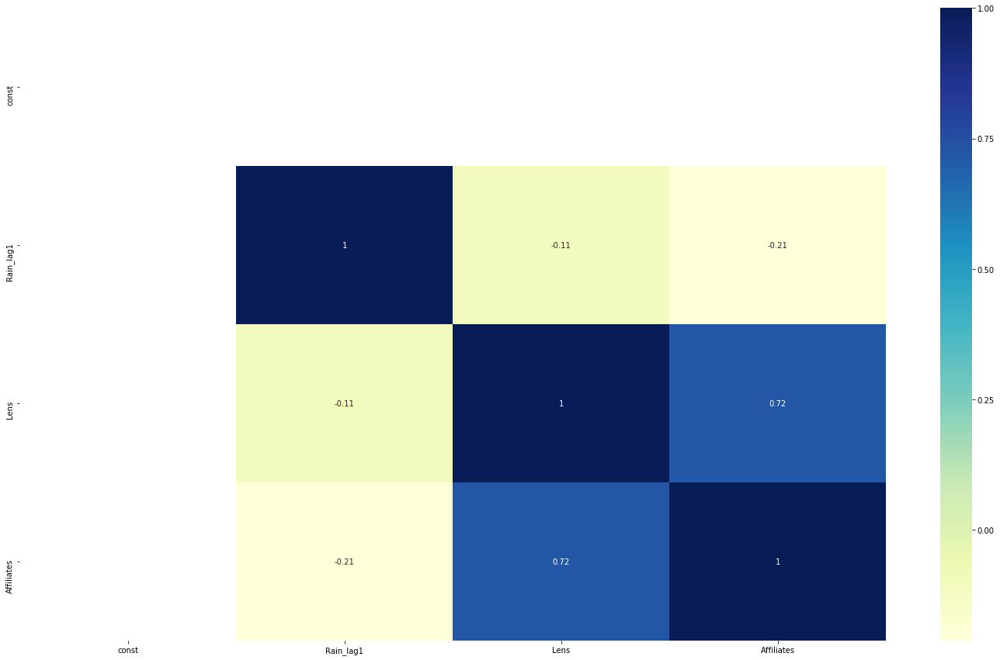

In [385]:
### Correlation Matrix
plt.figure(figsize = (25, 15))
sns.heatmap(X.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [386]:
### Validation using K-fold timeseries using split.

X = camera_lag.copy()
X=X[col_rfe]
y=camera_lag['gmv']

[859892.0940365301]


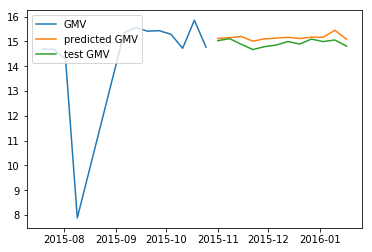

[859892.0940365301, 507981.07107714465]


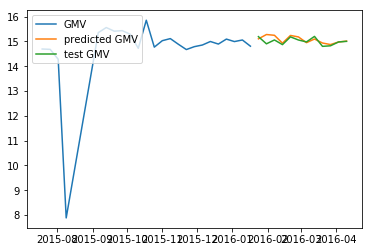

[859892.0940365301, 507981.07107714465, 720103.5692348016]


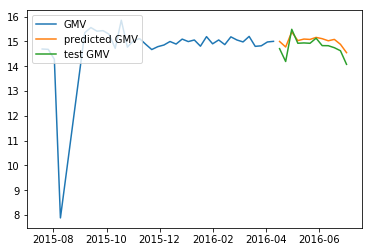

RMSE: 695992.2447828255


In [387]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error

tscv = TimeSeriesSplit(n_splits = 3)
rmse = []

for train_index, test_index in tscv.split(X):
    cv_train, cv_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    cv_train = sm.add_constant(cv_train)
    cv_test=sm.add_constant(cv_test, prepend=True, has_constant='add')
    model = sm.OLS(y_train,cv_train).fit()
    predictions = model.predict(cv_test)
    true_values = y_test.values
    rmse.append(sqrt(mean_squared_error(np.exp(true_values), np.exp(predictions))))
    print(rmse)
    plt.plot(y_train.index,y_train, '-', label="GMV")
    plt.plot(y_test.index,predictions,'-',label="predicted GMV")
    plt.plot(y_test.index, y_test,'-',label="test GMV")
    plt.legend(loc='upper left')
    plt.show()
print("RMSE: {}".format(np.mean(rmse)))

In [388]:
### Validation of Test data on model 
test_new=test[col_rfe]
test_new=sm.add_constant(test_new, prepend=True, has_constant='add')
test_new

,const,Rain_lag1,Lens,Affiliates
Week,,,,
2016-03-27,1.0,0.00000,5.783825,14.528114
2016-04-03,1.0,0.00000,6.018593,14.504793
2016-04-10,1.0,0.00000,6.107023,14.472827
2016-04-17,1.0,0.00000,6.073045,14.472827
2016-04-24,1.0,-9.21034,5.214936,14.472827
2016-05-01,1.0,-9.21034,6.559615,14.494844
2016-05-08,1.0,0.00000,6.129050,14.617642
2016-05-15,1.0,0.00000,6.267201,14.617642
2016-05-22,1.0,0.00000,6.234411,14.617642


In [389]:
y_pred=camera_lag_mul_m25.predict(test_new)
test_lr_reg=test.copy()
test_lr_reg['predicted_gmv']=np.exp(y_pred)

In [390]:
test['ActualGMV']=np.exp(test.gmv)

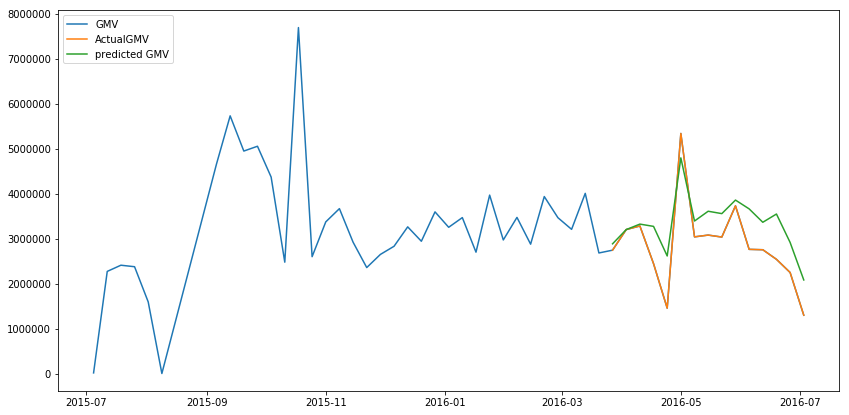

In [391]:
plt.figure(figsize=(14,7))
plt.plot(camera_final.index,camera_final.gmv, '-', label="GMV")
#plt.plot(test_new.index,test_lr_reg.predicted_gmv, '-',label="gmv predicted")
plt.plot(test.index, test.ActualGMV,'-',label="ActualGMV")
plt.plot(test.index,test_lr_reg.predicted_gmv,'-',label="predicted GMV")
#plt.plot(train.index, y_train_pred,'-',label="gmv_train_predicted")
plt.legend(loc='upper left')
plt.show()

In [393]:
from numpy import sqrt
from sklearn.metrics import mean_squared_error
camera_lr_reg_RMSE=sqrt(mean_squared_error(test.ActualGMV,test_lr_reg.predicted_gmv))
camera_lr_reg_RMSE

648517.776619661

#### <div id=24></div>Model Summary:
Model Adj-R2 : 0.981<br>
K-fold mean RMSE : 695992<br>
Test data RMSE : 648517<br>
Features : Rain-lag1, Affiliates, Lens are the significant features

In [394]:
# Calculate elasticity
df=camera_lag_mul_m25.summary2().tables[1]
significant_vars=df.index
elasticity=pd.DataFrame()
for significant_var in significant_vars:
    if (significant_var!= 'const'):
        elasticityValue=df.loc[significant_var]['Coef.']*train[significant_var].mean()/train['gmv'].mean()
        data={'kpi':significant_var,'elasticityValue':elasticityValue}
        elasticity = elasticity.append(data, ignore_index=True)
elasticity

,elasticityValue,kpi
0,0.002315,Rain_lag1
1,0.169916,Lens
2,0.069407,Affiliates


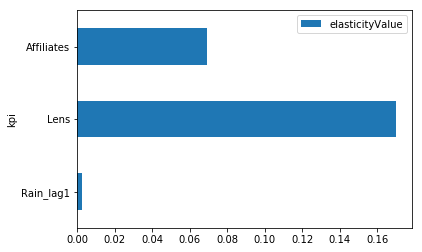

In [395]:
ax = elasticity.plot.barh(x='kpi', y='elasticityValue')